In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
from numpy import linalg
from keras.models import load_model

Using TensorFlow backend.


In [2]:
import geopandas as gpd

In [3]:
import seaborn as sns
sns.set(style="whitegrid")

In [4]:
def geoplot(df, variable, title=None, cmap='YlGn', save=None):
    umax = df[variable].max()
    umin = df[variable].min()

    fig, ax = plt.subplots(1, figsize=(8, 6), dpi=150)
    df.plot(column=variable, cmap=cmap, ax=ax, linewidth=0.125, edgecolor='0.0')
    ax.axis('off')

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=umin, vmax=umax))
    sm._A = []
    cbar = fig.colorbar(sm)
    
    if title is not None:
        plt.title(title)

    if save is not None:
        plt.savefig(save, figsize=(8,6), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [5]:
def corrplot(data, x, y, xlim=None, ylim=None, xlabel=None, ylabel=None, save=None, quantiles=False):
    df = data.copy()
    if quantiles:
        df[x] = df[x].rank(method="average", pct=True)
        df[y] = df[y].rank(method="average", pct=True)
        
    if xlim is None:
        xmin = df[x].min()
        xmax = df[x].max()
        xlim = (xmin,xmax)
    
    if ylim is None:
        ymin = df[y].min()
        ymax = df[y].max()
        ylim = (ymin,ymax)
    
    g = sns.jointplot(x, y, data=df,
                      kind="reg", truncate=False,
                      xlim=xlim, ylim=ylim,
                      height=7, space=1)
    
    if xlabel is not None:
        plt.xlabel(xlabel)
        
    if ylabel is not None:
        plt.ylabel(ylabel)
        
    r, p = stats.pearsonr(data[x],data[y])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", y=1.3, fontsize = 16)
        
    if save is not None:
        plt.savefig(save, figsize=(8,8), dpi=300, bbox_inches="tight")
    else:
        plt.show()

In [6]:
def corrfit(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None):
    df = data.loc[:,[X,Y]]

    if log[0]:
        U = f"log({X})"
        xlabel = f"log: {xlabel}"
        df[U] = df[X].map(np.log)
    else:
        U = X

    if log[1]:
        V = f"log({Y})"
        ylabel = f"log: {ylabel}"
        df[V] = df[Y].map(np.log)
    else:
        V = Y

    r = stats.linregress(df[U], df[V])
    df['fit'] = (r.intercept + r.slope*df[U])
    df['residuals'] = df[V]  - df.fit
    df['scaled_residuals'] = df.residuals/df.fit

    dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
    dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

    if xlim is None:
        xmin = df[U].min()
        xmax = df[U].max()
        xwidth = xmax - xmin
        xmax = xmax + 0.05*xwidth
        xmin = xmin - 0.05*xwidth
        xlim = (xmin,xmax)

    if ylim is None:
        ymin = df[V].min()
        ymax = df[V].max()
        ywidth = ymax - ymin
        ymax = ymax + 0.05*ywidth
        ymin = ymin - 0.05*ywidth
        ylim = (ymin,ymax)

    #print(size, data.columns)
    if size is not None:
        if size not in df.columns:
            if size not in data.columns:
                size = None
            else:
                df[size] = data[size]
    #print('Size:', size, df[size].min(), df[size].max())
        
    df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

    g0 = sns.jointplot(U, V, data=dfBULK,
                      kind="reg", 
                      marker="o",
                      xlim=xlim, ylim=ylim,
                      scatter=False,
                      height=7)    
    g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
                         size=size, sizes=(25,200),
                         alpha=0.75, 
                         marker="o", edgecolor="k",
                         ax=g0.ax_joint)
    #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
    #                    color="orange", marker="o", edgecolor="k",
    #                    ax=g0.ax_joint)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
    plt.show()
    
    return stats.linregress(dfBULK[U], dfBULK[V])

In [7]:
u = gpd.read_file("uk_covid.geojson").set_index("code")
d = pd.read_csv('uk_demographics.csv').set_index('code').loc[:,['0-29','30-59','60-89']]
uk = u.join(d)

In [8]:
def scale(X):
    return (X - X.mean())/X.std()

Eigenvalues [7.22928677e+00 3.08659118e+00 1.23234076e+00 8.98065955e-01
 5.93101939e-01 3.73348974e-01 1.87024050e-01 1.36966261e-01
 1.17514700e-01 1.66164558e-04 1.27750045e-02 2.07443953e-02
 6.28805799e-02 4.91932664e-02]
PCA0:  0.6283212920590429 2.167570145175589e-20


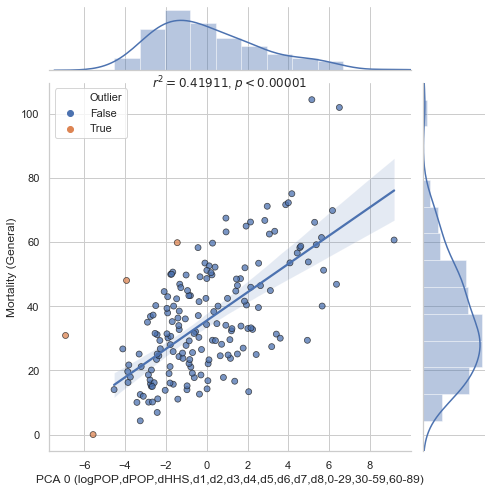

PCA1:  0.011899794755274973 0.8765153021993498
PCA2:  0.2793515036973779 0.00019762410394774663


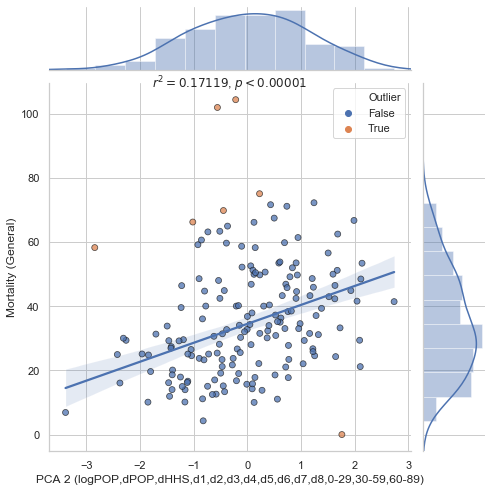

PCA3:  0.0376602016652724 0.6227715413315119
PCA4:  -0.04053491045255732 0.5964544306947982
PCA5:  -0.28744274712363505 0.00012579236972183694


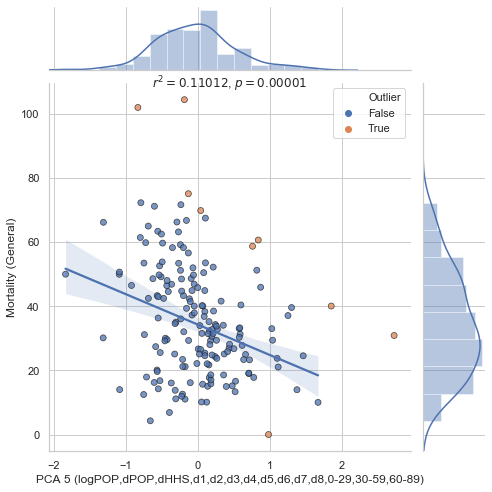

PCA6:  -0.14164054094332276 0.06304593267682335


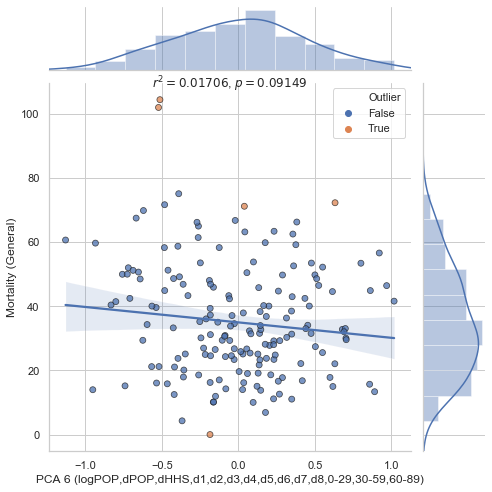

PCA7:  0.19600925496577332 0.009751195511226817


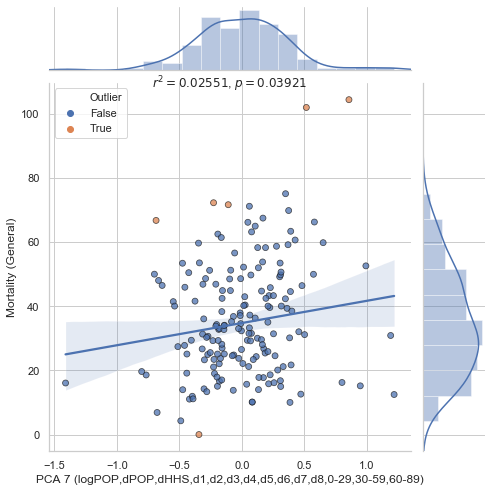

PCA8:  -0.13427419665987175 0.07819057655823963


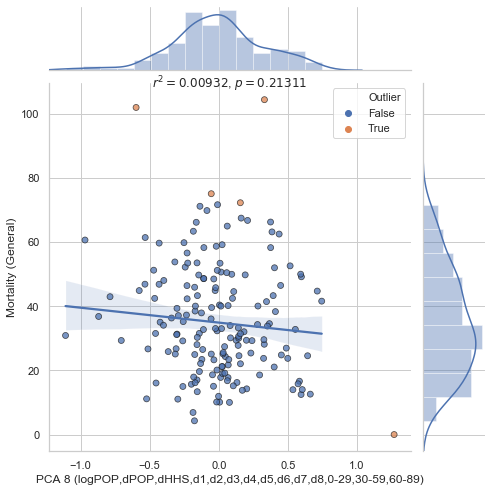

PCA9:  0.0027286319643108417 0.971577840034854
PCA10:  0.02519768564357346 0.7421002159263261
PCA11:  -0.02687457577441787 0.7256028364405886
PCA12:  0.10829277658018274 0.15612732723806308


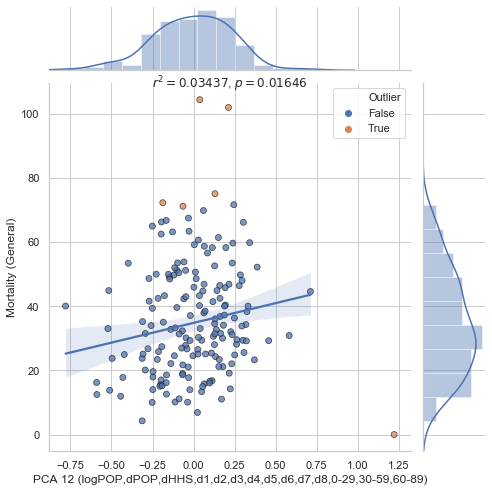

PCA13:  0.08603032745852152 0.260403929587837
['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']


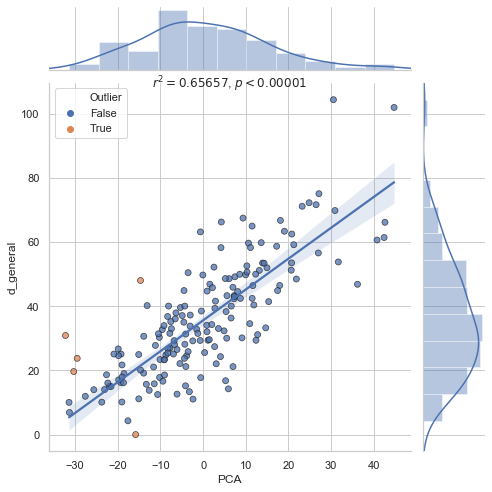

LinregressResult(slope=0.9611147508394207, intercept=35.579651576539, rvalue=0.8102918630339209, pvalue=2.2673413116062992e-40, stderr=0.053950689589140274)


logPOP     1.961284
dPOP       5.337402
dHHS      -1.657700
d1         1.354433
d2       -13.541053
d3         5.552871
d4         4.356153
d5        -3.245057
d6        -3.507131
d7        -1.135322
d8         7.094446
0-29      -5.389344
30-59      1.863873
60-89      3.273516
dtype: float64

In [9]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_general", "0-29", "30-59", "60-89"]].copy()
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']).map(np.log))
df['d2'] = scale((df['2']/df['households']).map(np.log))
df['d3'] = scale((df['3']/df['households']).map(np.log))
df['d4'] = scale((df['4']/df['households']).map(np.log))
df['d5'] = scale((df['5']/df['households']).map(np.log))
df['d6'] = scale((df['6']/df['households']).map(np.log))
df['d7'] = scale((df['7']/df['households']).map(np.log))
df['d8'] = scale((df['8']/df['households']).map(np.log))

factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]
C = df.loc[:,factors].corr().to_numpy()
e, v = linalg.eig(C)

print("Eigenvalues", e)
results = {}
results['components'] = factors
results['eigenvalues'] = e

components = []
for i in range(len(e)):
    df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
    r, p = stats.pearsonr(df[f'PCA{i}'],df["d_general"])
    print(f"PCA{i}: ", r, p)
    if p < 0.1 or np.abs(r) > 0.1:    
        regress = corrfit(df, X=f'PCA{i}', Y="d_general", 
                        xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (General)", 
                        log=(False, False))
        results[f'PCA{i}'] = {
            'eigenvector': v[:,i],
            'fit': regress
        }
        components.append(f'PCA{i}')

print(components)
df['PCA'] = 0
weights = np.zeros_like(results['PCA0']['eigenvector'])
for pca in components:
    df['PCA'] += results[pca]['fit'].slope*df[pca]
    weights += results[pca]['fit'].slope*results[pca]['eigenvector']
r = corrfit(df,'PCA','d_general')
df["PCR"] = r.intercept + r.slope*df["PCA"]
print(r)
data = df.copy()
pd.Series(weights, index=results['components'])


In [10]:
# df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households',"d_restricted", "0-29", "30-59", "60-89"]].copy()
# df['logPOP'] = scale(df['population'].map(np.log))
# df['dPOP'] = scale((df['dPOP']).map(np.log))
# df['dHHS'] = scale(df['dHHS'])
# df['0-29'] = scale(df['0-29'])
# df['30-59'] = scale(df['30-59'])
# df['60-89'] = scale(df['60-89'])
# df['d1'] = scale((df['1']/df['households']).map(np.log))
# df['d2'] = scale((df['2']/df['households']).map(np.log))
# df['d3'] = scale((df['3']/df['households']).map(np.log))
# df['d4'] = scale((df['4']/df['households']).map(np.log))
# df['d5'] = scale((df['5']/df['households']).map(np.log))
# df['d6'] = scale((df['6']/df['households']).map(np.log))
# df['d7'] = scale((df['7']/df['households']).map(np.log))
# df['d8'] = scale((df['8']/df['households']).map(np.log))

# factors = ['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]
# C = df.loc[:,factors].corr().to_numpy()
# e, v = linalg.eig(C)

# print("Eigenvalues", e)
# results = {}
# results['components'] = factors
# results['eigenvalues'] = e

# components_restricted = []
# for i in range(len(e)):
#     df[f'PCA{i}'] = (df.loc[:,factors]*v[:,i]).sum(axis=1)    
#     r, p = stats.pearsonr(df[f'PCA{i}'],df["d_restricted"])
#     print(f"PCA{i}: ", r, p)
#     if p < 0.1 or np.abs(r) > 0.1:    
#         regress = corrfit(df, X=f'PCA{i}', Y="d_restricted", 
#                         xlabel=f"PCA {i} ({','.join(factors)})", ylabel="Mortality (Restricted)", 
#                         log=(False, False))
#         results[f'PCA{i}'] = {
#             'eigenvector': v[:,i],
#             'fit': regress
#         }
#         components_restricted.append(f'PCA{i}')

# print(components_restricted)
# df['PCA'] = 0
# weights = np.zeros_like(results['PCA2']['eigenvector'])
# for pca in components_restricted:
#     df['PCA'] += results[pca]['fit'].slope*df[pca]
#     weights += results[pca]['fit'].slope*results[pca]['eigenvector']
# r = corrfit(df,'PCA','d_restricted')
# df["PCR"] = r.intercept + r.slope*df["PCA"]
# print(r)
# data = df.copy()
# pd.Series(weights, index=results['components'])


In [11]:
components

['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']

In [12]:
df = data
df["error"] = (df["d_general"] - df["PCR"])
df["perror"] = (df["error"]/df["PCR"]).round(3)*100
df.loc[:,["population","PCA","PCR","d_general","error","perror"]].sort_values("perror")

,population,PCA,PCR,d_general,error,perror
code,,,,,,
E06000053,2224.0,-15.819275,20.375513,0.000000,-20.375513,-100.0
W06000001,70043.0,-17.625533,18.639492,4.283083,-14.356409,-77.0
W06000006,135957.0,-2.368742,33.303019,11.032900,-22.270119,-66.9
E06000010,259778.0,5.920479,41.269911,14.242931,-27.026981,-65.5
E06000031,202259.0,-3.223737,32.481270,13.349221,-19.132050,-58.9
...,...,...,...,...,...,...
E06000017,39927.0,-31.427134,5.374570,10.018283,4.643714,86.4
E10000006,500012.0,-14.679071,21.471380,47.998848,26.527468,123.5
W06000023,132435.0,-30.329070,6.429935,19.632272,13.202338,205.3


In [13]:
# df = data
# df["error"] = (df["d_restricted"] - df["PCR"])
# df["perror"] = (df["error"]/df["PCR"]).round(3)*100
# df.loc[:,["population","PCA","PCR","d_restricted","error","perror"]].sort_values("perror")

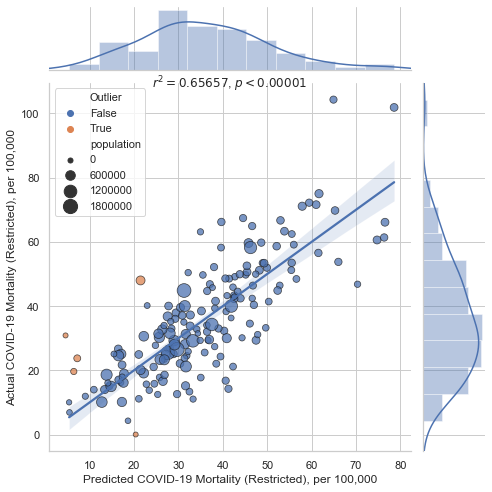

LinregressResult(slope=1.0000000000000004, intercept=-1.4210854715202004e-14, rvalue=0.8102918630339212, pvalue=2.2673413116060084e-40, stderr=0.05613345289105246)

In [14]:
corrfit(df, X="PCR", Y="d_general",
        xlabel="Predicted COVID-19 Mortality (Restricted), per 100,000",
        ylabel="Actual COVID-19 Mortality (Restricted), per 100,000",
        log=(False,False), size="population")

In [15]:
def z_score(X):
    return (X - X.mean())/X.std()

In [16]:
dfz = pd.DataFrame()
mean = {}
std={}
for i in components:
    dfz[i]=z_score(df[i])
    mean[i] = df[i].mean()
    std[i] = df[i].std()

In [17]:
test = pd.DataFrame([mean])
xtest = test.to_numpy()

In [18]:
model = load_model('d_general_v02.h5')

In [19]:
pred = model.predict(xtest).reshape(1)[0]
pred

42.111595

In [20]:
x_inc = xtest.copy()
x_inc

array([[ 6.62732553e-15,  5.93744707e-15,  6.05167811e-16,
        -2.44377415e-15,  7.74709455e-16,  3.60341172e-16,
         9.70418351e-15]])

In [21]:
std

{'PCA0': 2.6887333021260558,
 'PCA2': 1.1101084452772372,
 'PCA5': 0.611022891578777,
 'PCA6': 0.4324627724955691,
 'PCA7': 0.3700895316921083,
 'PCA8': 0.3428041714353445,
 'PCA12': 0.25076000457168873}

In [22]:
def cal_range(pca):
    y={}
    centeroid = xtest.copy()
    for x in range(len(centeroid[0])):
        store=[]
        for i in np.arange(-1.0, 1.05, 0.05):
            centeroid = xtest.copy()
            centeroid[0][x] = centeroid[0][x]+std[pca[x]]*round(i,2)
            prediction = model.predict(centeroid).reshape(1)[0]
            store.append(prediction)
        y[pca[x]]= store
    return y

In [23]:
y = cal_range(components)

In [24]:
result = pd.DataFrame()

In [26]:
for i in range(7):
    result[components[i]] = y[components[i]]

In [27]:
final = (result-pred)/pred

In [28]:
ticks=[]
for i in np.arange(-1.0, 1.05, 0.05):
    ticks.append(round(i,2))

In [29]:
final['index'] = ticks

In [30]:
final = final.set_index('index')

In [31]:
final.to_csv('pca_change.csv')

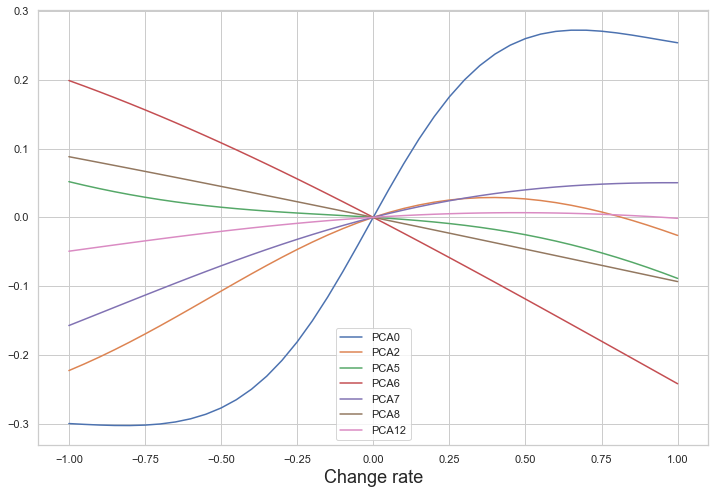

In [32]:
ax = final.plot(figsize=(12,8))
plt.xlabel('Change rate', fontsize=18)
plt.savefig('change_rate.png')

In [111]:
plot = data.copy()
plot = plot.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89",'PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13']]

In [114]:
corr_pca_df = plot.corr().loc[['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"],['PCA0','PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13']]

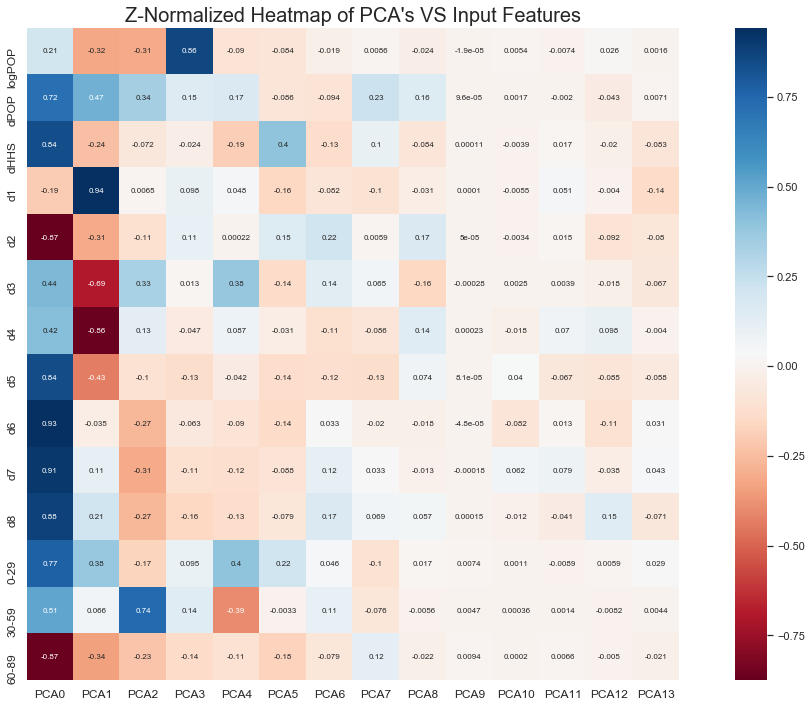

In [119]:
plt.figure(figsize=(20,12))
ax_relative = sns.heatmap(corr_pca_df, cmap="RdBu", annot=True, annot_kws={'size': 8},square=True)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of PCA's VS Input Features",fontsize=20)
plt.savefig('Heatmap_of_PCA_vs_input_Features.png')

In [106]:
df = uk.loc[:,['population','dPOP','dHHS','1','2','3','4','5','6','7','8','households', "0-29", "30-59", "60-89"]].copy()
df['logPOP'] = scale(df['population'].map(np.log))
df['dPOP'] = scale((df['dPOP']).map(np.log))
df['dHHS'] = scale(df['dHHS'])
df['0-29'] = scale(df['0-29'])
df['30-59'] = scale(df['30-59'])
df['60-89'] = scale(df['60-89'])
df['d1'] = scale((df['1']/df['households']).map(np.log))
df['d2'] = scale((df['2']/df['households']).map(np.log))
df['d3'] = scale((df['3']/df['households']).map(np.log))
df['d4'] = scale((df['4']/df['households']).map(np.log))
df['d5'] = scale((df['5']/df['households']).map(np.log))
df['d6'] = scale((df['6']/df['households']).map(np.log))
df['d7'] = scale((df['7']/df['households']).map(np.log))
df['d8'] = scale((df['8']/df['households']).map(np.log))
df1 = df.loc[:,['logPOP','dPOP','dHHS','d1','d2','d3','d4','d5','d6','d7','d8',"0-29", "30-59", "60-89"]]

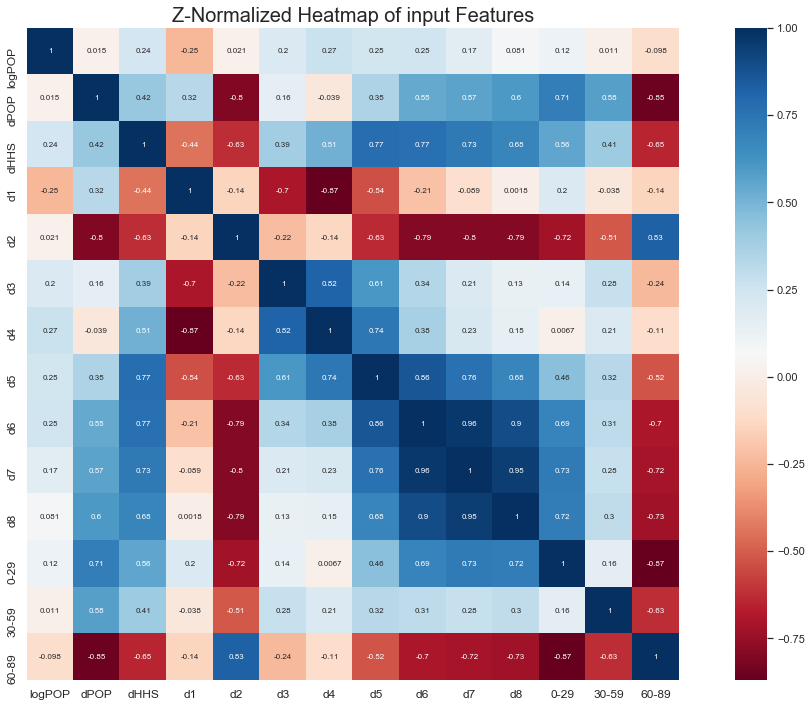

In [122]:
corr = df1.corr()
plt.figure(figsize=(20,12))
ax_relative = sns.heatmap(corr, cmap="RdBu", annot=True, annot_kws={'size': 8},square=True)
ax_relative.tick_params(labelsize=12)
ax_relative.set_title("Z-Normalized Heatmap of input Features",fontsize=20)
plt.savefig('Heatmap_of_input_Features2.png')

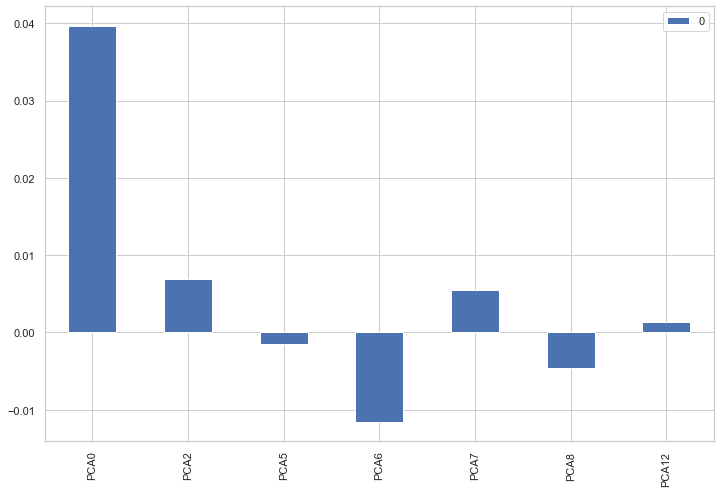

In [263]:
res5.plot(kind='bar',figsize=(12,8))
plt.savefig('changes_when_z_equals_0.05.png')

In [188]:
res

,0
PCA0,10.690262
PCA2,-1.107227
PCA5,-3.739037
PCA6,-10.190794
PCA7,2.119186
PCA8,-3.933399
PCA12,-0.059662


In [196]:
x_inc = xtest.copy()
x_inc

array([[ 6.62732553e-15,  5.93744707e-15,  6.05167811e-16,
        -2.44377415e-15,  7.74709455e-16,  3.60341172e-16,
         9.70418351e-15]])

In [197]:
x_inc[0][1] = x_inc[0][1]+x_inc[0][1]*0.5
x_inc

array([[ 6.62732553e-15,  8.90617060e-15,  6.05167811e-16,
        -2.44377415e-15,  7.74709455e-16,  3.60341172e-16,
         9.70418351e-15]])

In [198]:
prediction = model.predict(x_inc).reshape(1)[0]
prediction

42.111595

In [199]:
pred

42.111595

In [53]:
from keras.models import Sequential
from keras.layers import Dense
from keras import regularizers

In [54]:
# X = df.loc[:,'PCA0':'PCA13']
# X = df.loc[:,components_restricted]
X = df.loc[:,components]
# X = df.loc[:,['PCA0', 'PCA2', 'PCA5', 'PCA6', 'PCA7', 'PCA8', 'PCA12']]

In [55]:
y = df['d_general']
# y = uk['d_restricted']

In [56]:
X_train = X.to_numpy()

In [57]:
X_train.shape

(173, 7)

In [58]:
# model_restricted = Sequential()
# model_restricted.add(Dense(6,activation='sigmoid'))
# model_restricted.add(Dense(3))
# model_restricted.add(Dense(1))
# model_restricted.compile(optimizer='adam',loss='mse')
# model_restricted.fit(x=X_train,y=y.values,epochs=5000)

In [59]:
# model1 = Sequential()
# model1.add(Dense(14))
# model1.add(Dense(7))
# model1.add(Dense(1))
# model1.compile(optimizer='adam',loss='mse')
# model1.fit(x=X_train,y=y.values,epochs=1000)

In [88]:
model = Sequential()
model.add(Dense(7,activation='sigmoid',kernel_regularizer=regularizers.l2(l=0.1)))
model.add(Dense(3,kernel_regularizer=regularizers.l2(l=0.1)))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mse')
model.fit(x=X_train,y=y.values,epochs=100000)

Epoch 1/100000
173/173 [==============================] - 0s 657us/step - loss: 1561.6423
Epoch 2/100000
173/173 [==============================] - 0s 63us/step - loss: 1556.6295
Epoch 3/100000
173/173 [==============================] - 0s 58us/step - loss: 1551.6935
Epoch 4/100000
173/173 [==============================] - 0s 52us/step - loss: 1546.5996
Epoch 5/100000
173/173 [==============================] - 0s 75us/step - loss: 1541.5142
Epoch 6/100000
173/173 [==============================] - 0s 63us/step - loss: 1536.4902
Epoch 7/100000
173/173 [==============================] - 0s 58us/step - loss: 1531.1619
Epoch 8/100000
173/173 [==============================] - 0s 58us/step - loss: 1525.9727
Epoch 9/100000
173/173 [==============================] - 0s 69us/step - loss: 1520.6585
Epoch 10/100000
173/173 [==============================] - 0s 52us/step - loss: 1515.1948
Epoch 11/100000
173/173 [==============================] - 0s 58us/step - loss: 1509.5308
Epoch 12/100000
17

173/173 [==============================] - 0s 75us/step - loss: 170.0105
Epoch 184/100000
173/173 [==============================] - 0s 58us/step - loss: 169.1419
Epoch 185/100000
173/173 [==============================] - 0s 69us/step - loss: 168.6174
Epoch 186/100000
173/173 [==============================] - 0s 69us/step - loss: 167.9379
Epoch 187/100000
173/173 [==============================] - 0s 63us/step - loss: 167.4324
Epoch 188/100000
173/173 [==============================] - 0s 75us/step - loss: 166.9341
Epoch 189/100000
173/173 [==============================] - 0s 75us/step - loss: 166.3359
Epoch 190/100000
173/173 [==============================] - 0s 52us/step - loss: 165.8178
Epoch 191/100000
173/173 [==============================] - 0s 63us/step - loss: 165.4547
Epoch 192/100000
173/173 [==============================] - 0s 63us/step - loss: 164.7964
Epoch 193/100000
173/173 [==============================] - 0s 52us/step - loss: 164.3180
Epoch 194/100000
173/173 [=

Epoch 274/100000
173/173 [==============================] - 0s 63us/step - loss: 144.3775
Epoch 275/100000
173/173 [==============================] - 0s 52us/step - loss: 144.1955
Epoch 276/100000
173/173 [==============================] - 0s 52us/step - loss: 144.0520
Epoch 277/100000
173/173 [==============================] - 0s 69us/step - loss: 143.8841
Epoch 278/100000
173/173 [==============================] - 0s 69us/step - loss: 143.6899
Epoch 279/100000
173/173 [==============================] - 0s 58us/step - loss: 143.5283
Epoch 280/100000
173/173 [==============================] - 0s 63us/step - loss: 143.3798
Epoch 281/100000
173/173 [==============================] - 0s 69us/step - loss: 143.2238
Epoch 282/100000
173/173 [==============================] - 0s 63us/step - loss: 143.0898
Epoch 283/100000
173/173 [==============================] - 0s 63us/step - loss: 142.8867
Epoch 284/100000
173/173 [==============================] - 0s 69us/step - loss: 142.7504
Epoch 285/

173/173 [==============================] - 0s 58us/step - loss: 125.3682
Epoch 456/100000
173/173 [==============================] - 0s 63us/step - loss: 125.3052
Epoch 457/100000
173/173 [==============================] - 0s 52us/step - loss: 125.2372
Epoch 458/100000
173/173 [==============================] - 0s 69us/step - loss: 125.1747
Epoch 459/100000
173/173 [==============================] - 0s 75us/step - loss: 125.1158
Epoch 460/100000
173/173 [==============================] - 0s 75us/step - loss: 125.0799
Epoch 461/100000
173/173 [==============================] - 0s 63us/step - loss: 125.0060
Epoch 462/100000
173/173 [==============================] - 0s 63us/step - loss: 124.9393
Epoch 463/100000
173/173 [==============================] - 0s 52us/step - loss: 124.8797
Epoch 464/100000
173/173 [==============================] - 0s 69us/step - loss: 124.8160
Epoch 465/100000
173/173 [==============================] - 0s 69us/step - loss: 124.7522
Epoch 466/100000
173/173 [=

173/173 [==============================] - 0s 69us/step - loss: 117.1512
Epoch 637/100000
173/173 [==============================] - 0s 81us/step - loss: 117.0854
Epoch 638/100000
173/173 [==============================] - 0s 75us/step - loss: 117.0758
Epoch 639/100000
173/173 [==============================] - 0s 58us/step - loss: 117.0220
Epoch 640/100000
173/173 [==============================] - 0s 81us/step - loss: 117.0139
Epoch 641/100000
173/173 [==============================] - 0s 58us/step - loss: 116.9845
Epoch 642/100000
173/173 [==============================] - 0s 63us/step - loss: 116.9753
Epoch 643/100000
173/173 [==============================] - 0s 75us/step - loss: 116.8956
Epoch 644/100000
173/173 [==============================] - 0s 75us/step - loss: 116.8942
Epoch 645/100000
173/173 [==============================] - 0s 58us/step - loss: 116.8554
Epoch 646/100000
173/173 [==============================] - 0s 75us/step - loss: 116.8160
Epoch 647/100000
173/173 [=

Epoch 727/100000
173/173 [==============================] - 0s 63us/step - loss: 114.8247
Epoch 728/100000
173/173 [==============================] - 0s 69us/step - loss: 114.8329
Epoch 729/100000
173/173 [==============================] - 0s 52us/step - loss: 114.7935
Epoch 730/100000
173/173 [==============================] - 0s 58us/step - loss: 114.7476
Epoch 731/100000
173/173 [==============================] - 0s 81us/step - loss: 114.7281
Epoch 732/100000
173/173 [==============================] - 0s 63us/step - loss: 114.7090
Epoch 733/100000
173/173 [==============================] - 0s 75us/step - loss: 114.6994
Epoch 734/100000
173/173 [==============================] - 0s 69us/step - loss: 114.6691
Epoch 735/100000
173/173 [==============================] - 0s 63us/step - loss: 114.6663
Epoch 736/100000
173/173 [==============================] - 0s 92us/step - loss: 114.6213
Epoch 737/100000
173/173 [==============================] - 0s 75us/step - loss: 114.5933
Epoch 738/

173/173 [==============================] - 0s 63us/step - loss: 111.8592
Epoch 908/100000
173/173 [==============================] - 0s 75us/step - loss: 111.8530
Epoch 909/100000
173/173 [==============================] - 0s 63us/step - loss: 111.8472
Epoch 910/100000
173/173 [==============================] - 0s 52us/step - loss: 111.8281
Epoch 911/100000
173/173 [==============================] - 0s 69us/step - loss: 111.8258
Epoch 912/100000
173/173 [==============================] - 0s 58us/step - loss: 111.8143
Epoch 913/100000
173/173 [==============================] - 0s 69us/step - loss: 111.7923
Epoch 914/100000
173/173 [==============================] - 0s 63us/step - loss: 111.7844
Epoch 915/100000
173/173 [==============================] - 0s 58us/step - loss: 111.7680
Epoch 916/100000
173/173 [==============================] - 0s 75us/step - loss: 111.7776
Epoch 917/100000
173/173 [==============================] - 0s 63us/step - loss: 111.7479
Epoch 918/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 110.2114
Epoch 1088/100000
173/173 [==============================] - 0s 63us/step - loss: 110.1529
Epoch 1089/100000
173/173 [==============================] - 0s 69us/step - loss: 110.1511
Epoch 1090/100000
173/173 [==============================] - 0s 58us/step - loss: 110.1594
Epoch 1091/100000
173/173 [==============================] - 0s 46us/step - loss: 110.1766
Epoch 1092/100000
173/173 [==============================] - 0s 63us/step - loss: 110.1770
Epoch 1093/100000
173/173 [==============================] - 0s 69us/step - loss: 110.1523
Epoch 1094/100000
173/173 [==============================] - 0s 75us/step - loss: 110.1392
Epoch 1095/100000
173/173 [==============================] - 0s 75us/step - loss: 110.1332
Epoch 1096/100000
173/173 [==============================] - 0s 58us/step - loss: 110.1016
Epoch 1097/100000
173/173 [==============================] - 0s 52us/step - loss: 110.1074
Epoch 1098/100000

173/173 [==============================] - 0s 69us/step - loss: 109.0043
Epoch 1268/100000
173/173 [==============================] - 0s 69us/step - loss: 109.0170
Epoch 1269/100000
173/173 [==============================] - 0s 81us/step - loss: 108.9517
Epoch 1270/100000
173/173 [==============================] - 0s 81us/step - loss: 108.9732
Epoch 1271/100000
173/173 [==============================] - 0s 69us/step - loss: 108.9752
Epoch 1272/100000
173/173 [==============================] - 0s 98us/step - loss: 109.0011
Epoch 1273/100000
173/173 [==============================] - 0s 81us/step - loss: 108.9925
Epoch 1274/100000
173/173 [==============================] - 0s 69us/step - loss: 108.9552
Epoch 1275/100000
173/173 [==============================] - 0s 92us/step - loss: 108.9420
Epoch 1276/100000
173/173 [==============================] - 0s 75us/step - loss: 108.9465
Epoch 1277/100000
173/173 [==============================] - 0s 104us/step - loss: 108.9349
Epoch 1278/10000

173/173 [==============================] - 0s 63us/step - loss: 108.0217
Epoch 1446/100000
173/173 [==============================] - 0s 63us/step - loss: 107.9581
Epoch 1447/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9673
Epoch 1448/100000
173/173 [==============================] - 0s 63us/step - loss: 107.9735
Epoch 1449/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9862
Epoch 1450/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9453
Epoch 1451/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9209
Epoch 1452/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9487
Epoch 1453/100000
173/173 [==============================] - 0s 58us/step - loss: 107.9210
Epoch 1454/100000
173/173 [==============================] - 0s 52us/step - loss: 107.9085
Epoch 1455/100000
173/173 [==============================] - 0s 52us/step - loss: 107.8962
Epoch 1456/100000

173/173 [==============================] - 0s 58us/step - loss: 106.8332
Epoch 1626/100000
173/173 [==============================] - 0s 69us/step - loss: 106.8247
Epoch 1627/100000
173/173 [==============================] - 0s 92us/step - loss: 106.8039
Epoch 1628/100000
173/173 [==============================] - 0s 86us/step - loss: 106.7774
Epoch 1629/100000
173/173 [==============================] - 0s 75us/step - loss: 106.8077
Epoch 1630/100000
173/173 [==============================] - 0s 81us/step - loss: 106.7855
Epoch 1631/100000
173/173 [==============================] - 0s 75us/step - loss: 106.7796
Epoch 1632/100000
173/173 [==============================] - 0s 75us/step - loss: 106.8219
Epoch 1633/100000
173/173 [==============================] - 0s 81us/step - loss: 106.8024
Epoch 1634/100000
173/173 [==============================] - 0s 69us/step - loss: 106.7699
Epoch 1635/100000
173/173 [==============================] - 0s 69us/step - loss: 106.7867
Epoch 1636/100000

173/173 [==============================] - 0s 75us/step - loss: 105.3760
Epoch 1805/100000
173/173 [==============================] - 0s 98us/step - loss: 105.3634
Epoch 1806/100000
173/173 [==============================] - 0s 69us/step - loss: 105.3333
Epoch 1807/100000
173/173 [==============================] - 0s 63us/step - loss: 105.3530
Epoch 1808/100000
173/173 [==============================] - 0s 75us/step - loss: 105.3351
Epoch 1809/100000
173/173 [==============================] - 0s 69us/step - loss: 105.3179
Epoch 1810/100000
173/173 [==============================] - 0s 69us/step - loss: 105.3250
Epoch 1811/100000
173/173 [==============================] - 0s 69us/step - loss: 105.3033
Epoch 1812/100000
173/173 [==============================] - 0s 75us/step - loss: 105.2900
Epoch 1813/100000
173/173 [==============================] - 0s 75us/step - loss: 105.2809
Epoch 1814/100000
173/173 [==============================] - 0s 69us/step - loss: 105.2889
Epoch 1815/100000

173/173 [==============================] - 0s 81us/step - loss: 103.6458
Epoch 1983/100000
173/173 [==============================] - 0s 46us/step - loss: 103.6359
Epoch 1984/100000
173/173 [==============================] - 0s 40us/step - loss: 103.6478
Epoch 1985/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6135
Epoch 1986/100000
173/173 [==============================] - 0s 58us/step - loss: 103.6030
Epoch 1987/100000
173/173 [==============================] - 0s 81us/step - loss: 103.6270
Epoch 1988/100000
173/173 [==============================] - 0s 75us/step - loss: 103.6258
Epoch 1989/100000
173/173 [==============================] - 0s 69us/step - loss: 103.5692
Epoch 1990/100000
173/173 [==============================] - 0s 81us/step - loss: 103.5788
Epoch 1991/100000
173/173 [==============================] - 0s 86us/step - loss: 103.5930
Epoch 1992/100000
173/173 [==============================] - 0s 115us/step - loss: 103.5338
Epoch 1993/10000

Epoch 2072/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7778
Epoch 2073/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7564
Epoch 2074/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7684
Epoch 2075/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7553
Epoch 2076/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7486
Epoch 2077/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7500
Epoch 2078/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7161
Epoch 2079/100000
173/173 [==============================] - 0s 58us/step - loss: 102.7434
Epoch 2080/100000
173/173 [==============================] - 0s 58us/step - loss: 102.6880
Epoch 2081/100000
173/173 [==============================] - 0s 46us/step - loss: 102.6962
Epoch 2082/100000
173/173 [==============================] - 0s 52us/step - loss: 102.7016

173/173 [==============================] - 0s 52us/step - loss: 101.8734
Epoch 2163/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8606
Epoch 2164/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8453
Epoch 2165/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8353
Epoch 2166/100000
173/173 [==============================] - 0s 46us/step - loss: 101.8307
Epoch 2167/100000
173/173 [==============================] - 0s 46us/step - loss: 101.7957
Epoch 2168/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8096
Epoch 2169/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7536
Epoch 2170/100000
173/173 [==============================] - 0s 52us/step - loss: 101.7727
Epoch 2171/100000
173/173 [==============================] - 0s 52us/step - loss: 101.8272
Epoch 2172/100000
173/173 [==============================] - 0s 69us/step - loss: 101.7581
Epoch 2173/100000

Epoch 2252/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9296
Epoch 2253/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9086
Epoch 2254/100000
173/173 [==============================] - 0s 46us/step - loss: 100.9330
Epoch 2255/100000
173/173 [==============================] - 0s 52us/step - loss: 100.9002
Epoch 2256/100000
173/173 [==============================] - 0s 58us/step - loss: 100.9198
Epoch 2257/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8854
Epoch 2258/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8726
Epoch 2259/100000
173/173 [==============================] - 0s 58us/step - loss: 100.8622
Epoch 2260/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8775
Epoch 2261/100000
173/173 [==============================] - 0s 52us/step - loss: 100.8386
Epoch 2262/100000
173/173 [==============================] - 0s 46us/step - loss: 100.8350

173/173 [==============================] - 0s 52us/step - loss: 100.0193
Epoch 2343/100000
173/173 [==============================] - 0s 40us/step - loss: 100.0679
Epoch 2344/100000
173/173 [==============================] - 0s 46us/step - loss: 99.9796
Epoch 2345/100000
173/173 [==============================] - 0s 58us/step - loss: 99.9682
Epoch 2346/100000
173/173 [==============================] - 0s 52us/step - loss: 100.0040
Epoch 2347/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9596
Epoch 2348/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9464
Epoch 2349/100000
173/173 [==============================] - 0s 58us/step - loss: 99.9484
Epoch 2350/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9565
Epoch 2351/100000
173/173 [==============================] - 0s 58us/step - loss: 99.9114
Epoch 2352/100000
173/173 [==============================] - 0s 52us/step - loss: 99.9150
Epoch 2353/100000
173/173

173/173 [==============================] - 0s 98us/step - loss: 98.0533
Epoch 2524/100000
173/173 [==============================] - 0s 86us/step - loss: 98.0818
Epoch 2525/100000
173/173 [==============================] - 0s 86us/step - loss: 98.0474
Epoch 2526/100000
173/173 [==============================] - 0s 63us/step - loss: 98.0293
Epoch 2527/100000
173/173 [==============================] - 0s 75us/step - loss: 98.0336
Epoch 2528/100000
173/173 [==============================] - 0s 86us/step - loss: 97.9988
Epoch 2529/100000
173/173 [==============================] - 0s 75us/step - loss: 97.9985
Epoch 2530/100000
173/173 [==============================] - 0s 75us/step - loss: 97.9782
Epoch 2531/100000
173/173 [==============================] - 0s 81us/step - loss: 97.9555
Epoch 2532/100000
173/173 [==============================] - 0s 75us/step - loss: 97.9748
Epoch 2533/100000
173/173 [==============================] - 0s 69us/step - loss: 97.9482
Epoch 2534/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 96.2394
Epoch 2705/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2669
Epoch 2706/100000
173/173 [==============================] - 0s 58us/step - loss: 96.2147
Epoch 2707/100000
173/173 [==============================] - 0s 52us/step - loss: 96.2099
Epoch 2708/100000
173/173 [==============================] - 0s 63us/step - loss: 96.1948
Epoch 2709/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1920
Epoch 2710/100000
173/173 [==============================] - 0s 58us/step - loss: 96.1580
Epoch 2711/100000
173/173 [==============================] - 0s 52us/step - loss: 96.1869
Epoch 2712/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1471
Epoch 2713/100000
173/173 [==============================] - 0s 46us/step - loss: 96.1477
Epoch 2714/100000
173/173 [==============================] - 0s 58us/step - loss: 96.1444
Epoch 2715/100000
173/173 [=

Epoch 2795/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3177
Epoch 2796/100000
173/173 [==============================] - ETA: 0s - loss: 91.16 - 0s 58us/step - loss: 95.2890
Epoch 2797/100000
173/173 [==============================] - 0s 58us/step - loss: 95.3102
Epoch 2798/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2809
Epoch 2799/100000
173/173 [==============================] - 0s 52us/step - loss: 95.3088
Epoch 2800/100000
173/173 [==============================] - 0s 46us/step - loss: 95.3039
Epoch 2801/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2932
Epoch 2802/100000
173/173 [==============================] - 0s 58us/step - loss: 95.2796
Epoch 2803/100000
173/173 [==============================] - 0s 46us/step - loss: 95.2499
Epoch 2804/100000
173/173 [==============================] - 0s 52us/step - loss: 95.2503
Epoch 2805/100000
173/173 [==============================] - 0s 46us/step - 

173/173 [==============================] - 0s 52us/step - loss: 93.7602
Epoch 2976/100000
173/173 [==============================] - 0s 63us/step - loss: 93.7635
Epoch 2977/100000
173/173 [==============================] - 0s 52us/step - loss: 93.7924
Epoch 2978/100000
173/173 [==============================] - 0s 52us/step - loss: 93.7254
Epoch 2979/100000
173/173 [==============================] - 0s 58us/step - loss: 93.7598
Epoch 2980/100000
173/173 [==============================] - 0s 58us/step - loss: 93.6930
Epoch 2981/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7090
Epoch 2982/100000
173/173 [==============================] - 0s 46us/step - loss: 93.8158
Epoch 2983/100000
173/173 [==============================] - 0s 52us/step - loss: 93.6918
Epoch 2984/100000
173/173 [==============================] - 0s 46us/step - loss: 93.7196
Epoch 2985/100000
173/173 [==============================] - 0s 58us/step - loss: 93.7155
Epoch 2986/100000
173/173 [=

Epoch 3156/100000
173/173 [==============================] - 0s 63us/step - loss: 92.4534
Epoch 3157/100000
173/173 [==============================] - 0s 58us/step - loss: 92.4137
Epoch 3158/100000
173/173 [==============================] - 0s 86us/step - loss: 92.4111
Epoch 3159/100000
173/173 [==============================] - 0s 58us/step - loss: 92.4473
Epoch 3160/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4223
Epoch 3161/100000
173/173 [==============================] - ETA: 0s - loss: 82.56 - 0s 58us/step - loss: 92.3941
Epoch 3162/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4397
Epoch 3163/100000
173/173 [==============================] - 0s 46us/step - loss: 92.4119
Epoch 3164/100000
173/173 [==============================] - 0s 46us/step - loss: 92.3935
Epoch 3165/100000
173/173 [==============================] - 0s 52us/step - loss: 92.4157
Epoch 3166/100000
173/173 [==============================] - 0s 46us/step - 

173/173 [==============================] - 0s 58us/step - loss: 91.2644
Epoch 3337/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2515
Epoch 3338/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2506
Epoch 3339/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2375
Epoch 3340/100000
173/173 [==============================] - 0s 46us/step - loss: 91.2447
Epoch 3341/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2282
Epoch 3342/100000
173/173 [==============================] - 0s 52us/step - loss: 91.2294
Epoch 3343/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2324
Epoch 3344/100000
173/173 [==============================] - 0s 63us/step - loss: 91.2306
Epoch 3345/100000
173/173 [==============================] - 0s 58us/step - loss: 91.2137
Epoch 3346/100000
173/173 [==============================] - 0s 40us/step - loss: 91.1953
Epoch 3347/100000
173/173 [=

Epoch 3427/100000
173/173 [==============================] - 0s 58us/step - loss: 90.7212
Epoch 3428/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7420
Epoch 3429/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7337
Epoch 3430/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7183
Epoch 3431/100000
173/173 [==============================] - 0s 46us/step - loss: 90.7427
Epoch 3432/100000
173/173 [==============================] - 0s 52us/step - loss: 90.7118
Epoch 3433/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6919
Epoch 3434/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6857
Epoch 3435/100000
173/173 [==============================] - 0s 46us/step - loss: 90.6953
Epoch 3436/100000
173/173 [==============================] - 0s 52us/step - loss: 90.6819
Epoch 3437/100000
173/173 [==============================] - 0s 63us/step - loss: 90.7126
Epoch 3438

173/173 [==============================] - 0s 52us/step - loss: 90.2069
Epoch 3519/100000
173/173 [==============================] - 0s 58us/step - loss: 90.2318
Epoch 3520/100000
173/173 [==============================] - 0s 69us/step - loss: 90.2593
Epoch 3521/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2334
Epoch 3522/100000
173/173 [==============================] - 0s 63us/step - loss: 90.2243
Epoch 3523/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2257
Epoch 3524/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1963
Epoch 3525/100000
173/173 [==============================] - 0s 52us/step - loss: 90.1722
Epoch 3526/100000
173/173 [==============================] - 0s 52us/step - loss: 90.2050
Epoch 3527/100000
173/173 [==============================] - 0s 58us/step - loss: 90.1584
Epoch 3528/100000
173/173 [==============================] - 0s 46us/step - loss: 90.1678
Epoch 3529/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 89.3353
Epoch 3701/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3092
Epoch 3702/100000
173/173 [==============================] - 0s 58us/step - loss: 89.3179
Epoch 3703/100000
173/173 [==============================] - 0s 52us/step - loss: 89.2848
Epoch 3704/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3003
Epoch 3705/100000
173/173 [==============================] - 0s 58us/step - loss: 89.2907
Epoch 3706/100000
173/173 [==============================] - 0s 52us/step - loss: 89.3626
Epoch 3707/100000
173/173 [==============================] - 0s 46us/step - loss: 89.3025
Epoch 3708/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2870
Epoch 3709/100000
173/173 [==============================] - 0s 46us/step - loss: 89.2787
Epoch 3710/100000
173/173 [==============================] - 0s 40us/step - loss: 89.2930
Epoch 3711/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 88.4665
Epoch 3883/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4589
Epoch 3884/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4636
Epoch 3885/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4208
Epoch 3886/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4205
Epoch 3887/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4370
Epoch 3888/100000
173/173 [==============================] - 0s 46us/step - loss: 88.4300
Epoch 3889/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4028
Epoch 3890/100000
173/173 [==============================] - 0s 58us/step - loss: 88.4100
Epoch 3891/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4105
Epoch 3892/100000
173/173 [==============================] - 0s 52us/step - loss: 88.4143
Epoch 3893/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 87.7420
Epoch 4064/100000
173/173 [==============================] - 0s 46us/step - loss: 87.7034
Epoch 4065/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7019
Epoch 4066/100000
173/173 [==============================] - 0s 58us/step - loss: 87.7136
Epoch 4067/100000
173/173 [==============================] - 0s 63us/step - loss: 87.7165
Epoch 4068/100000
173/173 [==============================] - 0s 46us/step - loss: 87.7244
Epoch 4069/100000
173/173 [==============================] - 0s 58us/step - loss: 87.6959
Epoch 4070/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6916
Epoch 4071/100000
173/173 [==============================] - 0s 46us/step - loss: 87.6893
Epoch 4072/100000
173/173 [==============================] - 0s 52us/step - loss: 87.6976
Epoch 4073/100000
173/173 [==============================] - 0s 46us/step - loss: 87.7301
Epoch 4074/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 87.0213
Epoch 4246/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0064
Epoch 4247/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0205
Epoch 4248/100000
173/173 [==============================] - 0s 52us/step - loss: 87.0059
Epoch 4249/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0231
Epoch 4250/100000
173/173 [==============================] - 0s 46us/step - loss: 86.9830
Epoch 4251/100000
173/173 [==============================] - 0s 46us/step - loss: 86.9873
Epoch 4252/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0127
Epoch 4253/100000
173/173 [==============================] - 0s 52us/step - loss: 86.9879
Epoch 4254/100000
173/173 [==============================] - 0s 46us/step - loss: 87.0020
Epoch 4255/100000
173/173 [==============================] - ETA: 0s - loss: 108.754 - 0s 46us/step - loss: 87.0022
Ep

173/173 [==============================] - 0s 46us/step - loss: 86.4215
Epoch 4427/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4245
Epoch 4428/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4185
Epoch 4429/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4503
Epoch 4430/100000
173/173 [==============================] - 0s 52us/step - loss: 86.4555
Epoch 4431/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4081
Epoch 4432/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4432
Epoch 4433/100000
173/173 [==============================] - 0s 52us/step - loss: 86.3948
Epoch 4434/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3943
Epoch 4435/100000
173/173 [==============================] - 0s 46us/step - loss: 86.4059
Epoch 4436/100000
173/173 [==============================] - 0s 46us/step - loss: 86.3889
Epoch 4437/100000
173/173 [=

173/173 [==============================] - 0s 46us/step - loss: 85.8439
Epoch 4609/100000
173/173 [==============================] - 0s 58us/step - loss: 85.8164
Epoch 4610/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8542
Epoch 4611/100000
173/173 [==============================] - ETA: 0s - loss: 112.522 - 0s 46us/step - loss: 85.8526
Epoch 4612/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8779
Epoch 4613/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8291
Epoch 4614/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8270
Epoch 4615/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8394
Epoch 4616/100000
173/173 [==============================] - 0s 46us/step - loss: 85.8592
Epoch 4617/100000
173/173 [==============================] - 0s 58us/step - loss: 85.9320
Epoch 4618/100000
173/173 [==============================] - 0s 52us/step - loss: 85.8466
Ep

Epoch 4699/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5959
Epoch 4700/100000
173/173 [==============================] - 0s 46us/step - loss: 85.5867
Epoch 4701/100000
173/173 [==============================] - 0s 69us/step - loss: 85.5855
Epoch 4702/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5899
Epoch 4703/100000
173/173 [==============================] - 0s 52us/step - loss: 85.5960
Epoch 4704/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6136
Epoch 4705/100000
173/173 [==============================] - 0s 52us/step - loss: 85.6286
Epoch 4706/100000
173/173 [==============================] - 0s 58us/step - loss: 85.5987
Epoch 4707/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6484
Epoch 4708/100000
173/173 [==============================] - 0s 58us/step - loss: 85.6253
Epoch 4709/100000
173/173 [==============================] - 0s 63us/step - loss: 85.5570
Epoch 4710

173/173 [==============================] - 0s 52us/step - loss: 85.1164
Epoch 4881/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1036
Epoch 4882/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0941
Epoch 4883/100000
173/173 [==============================] - 0s 52us/step - loss: 85.1861
Epoch 4884/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0759
Epoch 4885/100000
173/173 [==============================] - 0s 115us/step - loss: 85.0803
Epoch 4886/100000
173/173 [==============================] - 0s 58us/step - loss: 85.0822
Epoch 4887/100000
173/173 [==============================] - 0s 46us/step - loss: 85.0810
Epoch 4888/100000
173/173 [==============================] - 0s 58us/step - loss: 85.1561
Epoch 4889/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0756
Epoch 4890/100000
173/173 [==============================] - 0s 52us/step - loss: 85.0659
Epoch 4891/100000
173/173 [

173/173 [==============================] - 0s 52us/step - loss: 84.6722
Epoch 5063/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6666
Epoch 5064/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6163
Epoch 5065/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6418
Epoch 5066/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6275
Epoch 5067/100000
173/173 [==============================] - 0s 58us/step - loss: 84.6303
Epoch 5068/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6455
Epoch 5069/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6620
Epoch 5070/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6589
Epoch 5071/100000
173/173 [==============================] - 0s 46us/step - loss: 84.6421
Epoch 5072/100000
173/173 [==============================] - 0s 52us/step - loss: 84.6250
Epoch 5073/100000
173/173 [=

173/173 [==============================] - 0s 75us/step - loss: 84.2074
Epoch 5245/100000
173/173 [==============================] - 0s 58us/step - loss: 84.2342
Epoch 5246/100000
173/173 [==============================] - 0s 52us/step - loss: 84.1930
Epoch 5247/100000
173/173 [==============================] - 0s 75us/step - loss: 84.1879
Epoch 5248/100000
173/173 [==============================] - 0s 81us/step - loss: 84.1783
Epoch 5249/100000
173/173 [==============================] - 0s 92us/step - loss: 84.1900
Epoch 5250/100000
173/173 [==============================] - 0s 98us/step - loss: 84.1771
Epoch 5251/100000
173/173 [==============================] - 0s 75us/step - loss: 84.1876
Epoch 5252/100000
173/173 [==============================] - 0s 63us/step - loss: 84.2067
Epoch 5253/100000
173/173 [==============================] - 0s 52us/step - loss: 84.2113
Epoch 5254/100000
173/173 [==============================] - 0s 58us/step - loss: 84.1617
Epoch 5255/100000
173/173 [=

Epoch 5335/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9719
Epoch 5336/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9865
Epoch 5337/100000
173/173 [==============================] - 0s 58us/step - loss: 83.9927
Epoch 5338/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9733
Epoch 5339/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9956
Epoch 5340/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9799
Epoch 5341/100000
173/173 [==============================] - 0s 46us/step - loss: 84.0914
Epoch 5342/100000
173/173 [==============================] - 0s 63us/step - loss: 84.0337
Epoch 5343/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9538
Epoch 5344/100000
173/173 [==============================] - 0s 46us/step - loss: 83.9510
Epoch 5345/100000
173/173 [==============================] - 0s 52us/step - loss: 83.9470
Epoch 5346

173/173 [==============================] - 0s 52us/step - loss: 83.5636
Epoch 5517/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5781
Epoch 5518/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5502
Epoch 5519/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5477
Epoch 5520/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5366
Epoch 5521/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5376
Epoch 5522/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5476
Epoch 5523/100000
173/173 [==============================] - 0s 58us/step - loss: 83.5595
Epoch 5524/100000
173/173 [==============================] - 0s 52us/step - loss: 83.5381
Epoch 5525/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5379
Epoch 5526/100000
173/173 [==============================] - 0s 46us/step - loss: 83.5493
Epoch 5527/100000
173/173 [=

173/173 [==============================] - 0s 63us/step - loss: 83.1196
Epoch 5699/100000
173/173 [==============================] - 0s 58us/step - loss: 83.1004
Epoch 5700/100000
173/173 [==============================] - 0s 81us/step - loss: 83.1026
Epoch 5701/100000
173/173 [==============================] - 0s 75us/step - loss: 83.0899
Epoch 5702/100000
173/173 [==============================] - 0s 63us/step - loss: 83.1171
Epoch 5703/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0828
Epoch 5704/100000
173/173 [==============================] - 0s 46us/step - loss: 83.0890
Epoch 5705/100000
173/173 [==============================] - 0s 58us/step - loss: 83.0791
Epoch 5706/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0749
Epoch 5707/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0654
Epoch 5708/100000
173/173 [==============================] - 0s 52us/step - loss: 83.0521
Epoch 5709/100000
173/173 [=

173/173 [==============================] - 0s 63us/step - loss: 82.6290
Epoch 5879/100000
173/173 [==============================] - 0s 69us/step - loss: 82.6575
Epoch 5880/100000
173/173 [==============================] - 0s 52us/step - loss: 82.6413
Epoch 5881/100000
173/173 [==============================] - 0s 75us/step - loss: 82.6306
Epoch 5882/100000
173/173 [==============================] - 0s 92us/step - loss: 82.6297
Epoch 5883/100000
173/173 [==============================] - 0s 92us/step - loss: 82.6110
Epoch 5884/100000
173/173 [==============================] - 0s 69us/step - loss: 82.6282
Epoch 5885/100000
173/173 [==============================] - 0s 81us/step - loss: 82.6247
Epoch 5886/100000
173/173 [==============================] - 0s 75us/step - loss: 82.5896
Epoch 5887/100000
173/173 [==============================] - 0s 75us/step - loss: 82.5948
Epoch 5888/100000
173/173 [==============================] - 0s 98us/step - loss: 82.6167
Epoch 5889/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 82.1226
Epoch 6061/100000
173/173 [==============================] - 0s 63us/step - loss: 82.1158
Epoch 6062/100000
173/173 [==============================] - 0s 46us/step - loss: 82.1178
Epoch 6063/100000
173/173 [==============================] - 0s 46us/step - loss: 82.0990
Epoch 6064/100000
173/173 [==============================] - 0s 46us/step - loss: 82.1247
Epoch 6065/100000
173/173 [==============================] - 0s 40us/step - loss: 82.0964
Epoch 6066/100000
173/173 [==============================] - 0s 52us/step - loss: 82.0995
Epoch 6067/100000
173/173 [==============================] - 0s 52us/step - loss: 82.1168
Epoch 6068/100000
173/173 [==============================] - 0s 52us/step - loss: 82.1386
Epoch 6069/100000
173/173 [==============================] - 0s 58us/step - loss: 82.1216
Epoch 6070/100000
173/173 [==============================] - 0s 52us/step - loss: 82.1298
Epoch 6071/100000
173/173 [=

Epoch 6242/100000
173/173 [==============================] - 0s 75us/step - loss: 81.6346
Epoch 6243/100000
173/173 [==============================] - 0s 75us/step - loss: 81.6414
Epoch 6244/100000
173/173 [==============================] - 0s 92us/step - loss: 81.6752
Epoch 6245/100000
173/173 [==============================] - 0s 75us/step - loss: 81.6147
Epoch 6246/100000
173/173 [==============================] - 0s 69us/step - loss: 81.6698
Epoch 6247/100000
173/173 [==============================] - 0s 63us/step - loss: 81.6545
Epoch 6248/100000
173/173 [==============================] - 0s 69us/step - loss: 81.6263
Epoch 6249/100000
173/173 [==============================] - 0s 69us/step - loss: 81.6738
Epoch 6250/100000
173/173 [==============================] - 0s 70us/step - loss: 81.6178
Epoch 6251/100000
173/173 [==============================] - 0s 81us/step - loss: 81.6302
Epoch 6252/100000
173/173 [==============================] - 0s 63us/step - loss: 81.6216
Epoch 6253

Epoch 6333/100000
173/173 [==============================] - 0s 86us/step - loss: 81.4168
Epoch 6334/100000
173/173 [==============================] - 0s 86us/step - loss: 81.4262
Epoch 6335/100000
173/173 [==============================] - 0s 127us/step - loss: 81.4075
Epoch 6336/100000
173/173 [==============================] - 0s 52us/step - loss: 81.4217
Epoch 6337/100000
173/173 [==============================] - 0s 58us/step - loss: 81.3957
Epoch 6338/100000
173/173 [==============================] - 0s 63us/step - loss: 81.4417
Epoch 6339/100000
173/173 [==============================] - 0s 69us/step - loss: 81.4039
Epoch 6340/100000
173/173 [==============================] - 0s 75us/step - loss: 81.4059
Epoch 6341/100000
173/173 [==============================] - 0s 75us/step - loss: 81.4201
Epoch 6342/100000
173/173 [==============================] - 0s 58us/step - loss: 81.3601
Epoch 6343/100000
173/173 [==============================] - 0s 52us/step - loss: 81.3570
Epoch 634

173/173 [==============================] - 0s 63us/step - loss: 80.9933
Epoch 6515/100000
173/173 [==============================] - 0s 58us/step - loss: 80.9654
Epoch 6516/100000
173/173 [==============================] - 0s 52us/step - loss: 80.9790
Epoch 6517/100000
173/173 [==============================] - 0s 63us/step - loss: 81.0438
Epoch 6518/100000
173/173 [==============================] - 0s 52us/step - loss: 80.9611
Epoch 6519/100000
173/173 [==============================] - 0s 46us/step - loss: 80.9272
Epoch 6520/100000
173/173 [==============================] - 0s 58us/step - loss: 80.9289
Epoch 6521/100000
173/173 [==============================] - 0s 63us/step - loss: 80.9294
Epoch 6522/100000
173/173 [==============================] - 0s 52us/step - loss: 80.9505
Epoch 6523/100000
173/173 [==============================] - 0s 63us/step - loss: 80.9336
Epoch 6524/100000
173/173 [==============================] - 0s 69us/step - loss: 80.9206
Epoch 6525/100000
173/173 [=

Epoch 6696/100000
173/173 [==============================] - 0s 46us/step - loss: 80.4989
Epoch 6697/100000
173/173 [==============================] - 0s 52us/step - loss: 80.4965
Epoch 6698/100000
173/173 [==============================] - 0s 63us/step - loss: 80.6008
Epoch 6699/100000
173/173 [==============================] - 0s 46us/step - loss: 80.5121
Epoch 6700/100000
173/173 [==============================] - 0s 58us/step - loss: 80.5124
Epoch 6701/100000
173/173 [==============================] - 0s 52us/step - loss: 80.5017
Epoch 6702/100000
173/173 [==============================] - 0s 58us/step - loss: 80.4806
Epoch 6703/100000
173/173 [==============================] - 0s 63us/step - loss: 80.4858
Epoch 6704/100000
173/173 [==============================] - 0s 63us/step - loss: 80.5015
Epoch 6705/100000
173/173 [==============================] - 0s 58us/step - loss: 80.4908
Epoch 6706/100000
173/173 [==============================] - 0s 69us/step - loss: 80.5024
Epoch 6707

173/173 [==============================] - 0s 52us/step - loss: 80.0794
Epoch 6878/100000
173/173 [==============================] - 0s 52us/step - loss: 80.0677
Epoch 6879/100000
173/173 [==============================] - 0s 40us/step - loss: 80.0321
Epoch 6880/100000
173/173 [==============================] - 0s 63us/step - loss: 80.0504
Epoch 6881/100000
173/173 [==============================] - 0s 58us/step - loss: 80.0740
Epoch 6882/100000
173/173 [==============================] - 0s 52us/step - loss: 80.0338
Epoch 6883/100000
173/173 [==============================] - 0s 58us/step - loss: 80.0409
Epoch 6884/100000
173/173 [==============================] - 0s 52us/step - loss: 80.0452
Epoch 6885/100000
173/173 [==============================] - 0s 52us/step - loss: 80.0464
Epoch 6886/100000
173/173 [==============================] - 0s 46us/step - loss: 80.0329
Epoch 6887/100000
173/173 [==============================] - 0s 52us/step - loss: 80.0545
Epoch 6888/100000
173/173 [=

Epoch 6968/100000
173/173 [==============================] - 0s 46us/step - loss: 79.8524
Epoch 6969/100000
173/173 [==============================] - 0s 46us/step - loss: 79.8159
Epoch 6970/100000
173/173 [==============================] - 0s 52us/step - loss: 79.8375
Epoch 6971/100000
173/173 [==============================] - 0s 46us/step - loss: 79.8434
Epoch 6972/100000
173/173 [==============================] - 0s 52us/step - loss: 79.8449
Epoch 6973/100000
173/173 [==============================] - 0s 52us/step - loss: 79.9470
Epoch 6974/100000
173/173 [==============================] - 0s 52us/step - loss: 79.8289
Epoch 6975/100000
173/173 [==============================] - 0s 58us/step - loss: 79.8444
Epoch 6976/100000
173/173 [==============================] - 0s 52us/step - loss: 79.9157
Epoch 6977/100000
173/173 [==============================] - 0s 52us/step - loss: 79.8393
Epoch 6978/100000
173/173 [==============================] - 0s 52us/step - loss: 79.8172
Epoch 6979

173/173 [==============================] - 0s 52us/step - loss: 79.6281
Epoch 7060/100000
173/173 [==============================] - 0s 46us/step - loss: 79.6212
Epoch 7061/100000
173/173 [==============================] - 0s 58us/step - loss: 79.5836
Epoch 7062/100000
173/173 [==============================] - 0s 46us/step - loss: 79.6184
Epoch 7063/100000
173/173 [==============================] - 0s 46us/step - loss: 79.5855
Epoch 7064/100000
173/173 [==============================] - 0s 58us/step - loss: 79.6388
Epoch 7065/100000
173/173 [==============================] - 0s 52us/step - loss: 79.5983
Epoch 7066/100000
173/173 [==============================] - 0s 58us/step - loss: 79.5901
Epoch 7067/100000
173/173 [==============================] - 0s 52us/step - loss: 79.6007
Epoch 7068/100000
173/173 [==============================] - 0s 40us/step - loss: 79.6541
Epoch 7069/100000
173/173 [==============================] - 0s 58us/step - loss: 79.6097
Epoch 7070/100000
173/173 [=

Epoch 7150/100000
173/173 [==============================] - 0s 63us/step - loss: 79.3998
Epoch 7151/100000
173/173 [==============================] - 0s 58us/step - loss: 79.3950
Epoch 7152/100000
173/173 [==============================] - 0s 40us/step - loss: 79.3947
Epoch 7153/100000
173/173 [==============================] - 0s 63us/step - loss: 79.3897
Epoch 7154/100000
173/173 [==============================] - 0s 63us/step - loss: 79.3579
Epoch 7155/100000
173/173 [==============================] - 0s 58us/step - loss: 79.3527
Epoch 7156/100000
173/173 [==============================] - 0s 52us/step - loss: 79.3569
Epoch 7157/100000
173/173 [==============================] - 0s 63us/step - loss: 79.4370
Epoch 7158/100000
173/173 [==============================] - 0s 69us/step - loss: 79.3386
Epoch 7159/100000
173/173 [==============================] - 0s 46us/step - loss: 79.4059
Epoch 7160/100000
173/173 [==============================] - 0s 58us/step - loss: 79.3441
Epoch 7161

173/173 [==============================] - 0s 58us/step - loss: 78.8750
Epoch 7332/100000
173/173 [==============================] - 0s 63us/step - loss: 78.9173
Epoch 7333/100000
173/173 [==============================] - 0s 63us/step - loss: 78.8873
Epoch 7334/100000
173/173 [==============================] - 0s 75us/step - loss: 78.9035
Epoch 7335/100000
173/173 [==============================] - 0s 61us/step - loss: 78.8904
Epoch 7336/100000
173/173 [==============================] - 0s 63us/step - loss: 78.8849
Epoch 7337/100000
173/173 [==============================] - 0s 58us/step - loss: 78.8736
Epoch 7338/100000
173/173 [==============================] - 0s 58us/step - loss: 78.8704
Epoch 7339/100000
173/173 [==============================] - 0s 63us/step - loss: 78.9190
Epoch 7340/100000
173/173 [==============================] - 0s 58us/step - loss: 78.8610
Epoch 7341/100000
173/173 [==============================] - 0s 58us/step - loss: 78.8887
Epoch 7342/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 78.3804
Epoch 7514/100000
173/173 [==============================] - 0s 58us/step - loss: 78.4393
Epoch 7515/100000
173/173 [==============================] - 0s 58us/step - loss: 78.3703
Epoch 7516/100000
173/173 [==============================] - 0s 46us/step - loss: 78.3735
Epoch 7517/100000
173/173 [==============================] - 0s 58us/step - loss: 78.4055
Epoch 7518/100000
173/173 [==============================] - 0s 58us/step - loss: 78.3623
Epoch 7519/100000
173/173 [==============================] - 0s 46us/step - loss: 78.3499
Epoch 7520/100000
173/173 [==============================] - 0s 58us/step - loss: 78.3455
Epoch 7521/100000
173/173 [==============================] - 0s 63us/step - loss: 78.3662
Epoch 7522/100000
173/173 [==============================] - 0s 52us/step - loss: 78.4020
Epoch 7523/100000
173/173 [==============================] - 0s 46us/step - loss: 78.3493
Epoch 7524/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 77.7945
Epoch 7696/100000
173/173 [==============================] - 0s 46us/step - loss: 77.7354
Epoch 7697/100000
173/173 [==============================] - 0s 63us/step - loss: 77.7361
Epoch 7698/100000
173/173 [==============================] - 0s 52us/step - loss: 77.7420
Epoch 7699/100000
173/173 [==============================] - 0s 58us/step - loss: 77.7488
Epoch 7700/100000
173/173 [==============================] - 0s 52us/step - loss: 77.8111
Epoch 7701/100000
173/173 [==============================] - 0s 58us/step - loss: 77.7536
Epoch 7702/100000
173/173 [==============================] - 0s 46us/step - loss: 77.7747
Epoch 7703/100000
173/173 [==============================] - 0s 69us/step - loss: 77.7215
Epoch 7704/100000
173/173 [==============================] - 0s 52us/step - loss: 77.7444
Epoch 7705/100000
173/173 [==============================] - 0s 46us/step - loss: 77.7258
Epoch 7706/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 77.0339
Epoch 7877/100000
173/173 [==============================] - 0s 46us/step - loss: 77.0336
Epoch 7878/100000
173/173 [==============================] - 0s 63us/step - loss: 77.0128
Epoch 7879/100000
173/173 [==============================] - 0s 52us/step - loss: 77.0995
Epoch 7880/100000
173/173 [==============================] - 0s 58us/step - loss: 77.1620
Epoch 7881/100000
173/173 [==============================] - 0s 52us/step - loss: 77.0721
Epoch 7882/100000
173/173 [==============================] - 0s 58us/step - loss: 77.0228
Epoch 7883/100000
173/173 [==============================] - 0s 52us/step - loss: 77.0207
Epoch 7884/100000
173/173 [==============================] - 0s 52us/step - loss: 76.9836
Epoch 7885/100000
173/173 [==============================] - 0s 58us/step - loss: 76.9934
Epoch 7886/100000
173/173 [==============================] - 0s 52us/step - loss: 76.9927
Epoch 7887/100000
173/173 [=

Epoch 7967/100000
173/173 [==============================] - 0s 46us/step - loss: 76.5857
Epoch 7968/100000
173/173 [==============================] - 0s 52us/step - loss: 76.6033
Epoch 7969/100000
173/173 [==============================] - 0s 52us/step - loss: 76.6158
Epoch 7970/100000
173/173 [==============================] - 0s 52us/step - loss: 76.6179
Epoch 7971/100000
173/173 [==============================] - 0s 63us/step - loss: 76.5950
Epoch 7972/100000
173/173 [==============================] - 0s 52us/step - loss: 76.5907
Epoch 7973/100000
173/173 [==============================] - 0s 52us/step - loss: 76.5537
Epoch 7974/100000
173/173 [==============================] - 0s 58us/step - loss: 76.5565
Epoch 7975/100000
173/173 [==============================] - 0s 58us/step - loss: 76.6030
Epoch 7976/100000
173/173 [==============================] - 0s 46us/step - loss: 76.6001
Epoch 7977/100000
173/173 [==============================] - 0s 63us/step - loss: 76.5860
Epoch 7978

173/173 [==============================] - 0s 81us/step - loss: 75.7127
Epoch 8149/100000
173/173 [==============================] - 0s 75us/step - loss: 75.7428
Epoch 8150/100000
173/173 [==============================] - 0s 63us/step - loss: 75.7243
Epoch 8151/100000
173/173 [==============================] - 0s 69us/step - loss: 75.7524
Epoch 8152/100000
173/173 [==============================] - 0s 63us/step - loss: 75.7456
Epoch 8153/100000
173/173 [==============================] - 0s 58us/step - loss: 75.7238
Epoch 8154/100000
173/173 [==============================] - 0s 69us/step - loss: 75.7043
Epoch 8155/100000
173/173 [==============================] - 0s 63us/step - loss: 75.6927
Epoch 8156/100000
173/173 [==============================] - 0s 52us/step - loss: 75.7151
Epoch 8157/100000
173/173 [==============================] - 0s 63us/step - loss: 75.7121
Epoch 8158/100000
173/173 [==============================] - 0s 63us/step - loss: 75.6708
Epoch 8159/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 74.8189
Epoch 8330/100000
173/173 [==============================] - 0s 52us/step - loss: 74.8444
Epoch 8331/100000
173/173 [==============================] - 0s 58us/step - loss: 74.8280
Epoch 8332/100000
173/173 [==============================] - 0s 52us/step - loss: 74.8234
Epoch 8333/100000
173/173 [==============================] - 0s 63us/step - loss: 74.7885
Epoch 8334/100000
173/173 [==============================] - 0s 52us/step - loss: 74.7847
Epoch 8335/100000
173/173 [==============================] - 0s 52us/step - loss: 74.7731
Epoch 8336/100000
173/173 [==============================] - 0s 63us/step - loss: 74.7875
Epoch 8337/100000
173/173 [==============================] - 0s 52us/step - loss: 74.7824
Epoch 8338/100000
173/173 [==============================] - 0s 58us/step - loss: 74.7452
Epoch 8339/100000
173/173 [==============================] - 0s 52us/step - loss: 74.7667
Epoch 8340/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 74.0277
Epoch 8511/100000
173/173 [==============================] - 0s 58us/step - loss: 73.9711
Epoch 8512/100000
173/173 [==============================] - 0s 69us/step - loss: 74.0068
Epoch 8513/100000
173/173 [==============================] - 0s 69us/step - loss: 73.9359
Epoch 8514/100000
173/173 [==============================] - 0s 58us/step - loss: 73.9651
Epoch 8515/100000
173/173 [==============================] - 0s 58us/step - loss: 73.9915
Epoch 8516/100000
173/173 [==============================] - 0s 63us/step - loss: 73.9937
Epoch 8517/100000
173/173 [==============================] - 0s 69us/step - loss: 73.9611
Epoch 8518/100000
173/173 [==============================] - 0s 46us/step - loss: 73.9423
Epoch 8519/100000
173/173 [==============================] - 0s 58us/step - loss: 73.9474
Epoch 8520/100000
173/173 [==============================] - 0s 81us/step - loss: 73.9379
Epoch 8521/100000
173/173 [=

Epoch 8692/100000
173/173 [==============================] - 0s 58us/step - loss: 73.3214
Epoch 8693/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2745
Epoch 8694/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2178
Epoch 8695/100000
173/173 [==============================] - 0s 58us/step - loss: 73.2198
Epoch 8696/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2365
Epoch 8697/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2627
Epoch 8698/100000
173/173 [==============================] - 0s 63us/step - loss: 73.2679
Epoch 8699/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2456
Epoch 8700/100000
173/173 [==============================] - 0s 52us/step - loss: 73.2344
Epoch 8701/100000
173/173 [==============================] - 0s 58us/step - loss: 73.2371
Epoch 8702/100000
173/173 [==============================] - 0s 58us/step - loss: 73.1971
Epoch 8703

173/173 [==============================] - 0s 58us/step - loss: 72.9590
Epoch 8784/100000
173/173 [==============================] - 0s 46us/step - loss: 72.9738
Epoch 8785/100000
173/173 [==============================] - 0s 58us/step - loss: 72.9476
Epoch 8786/100000
173/173 [==============================] - 0s 46us/step - loss: 72.9306
Epoch 8787/100000
173/173 [==============================] - 0s 63us/step - loss: 72.9300
Epoch 8788/100000
173/173 [==============================] - 0s 58us/step - loss: 72.9324
Epoch 8789/100000
173/173 [==============================] - 0s 58us/step - loss: 72.9577
Epoch 8790/100000
173/173 [==============================] - 0s 63us/step - loss: 72.9087
Epoch 8791/100000
173/173 [==============================] - 0s 52us/step - loss: 72.9231
Epoch 8792/100000
173/173 [==============================] - 0s 63us/step - loss: 72.9264
Epoch 8793/100000
173/173 [==============================] - 0s 46us/step - loss: 72.9649
Epoch 8794/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 72.3994
Epoch 8965/100000
173/173 [==============================] - 0s 52us/step - loss: 72.3297
Epoch 8966/100000
173/173 [==============================] - 0s 52us/step - loss: 72.3225
Epoch 8967/100000
173/173 [==============================] - 0s 46us/step - loss: 72.3447
Epoch 8968/100000
173/173 [==============================] - 0s 63us/step - loss: 72.3732
Epoch 8969/100000
173/173 [==============================] - 0s 58us/step - loss: 72.4090
Epoch 8970/100000
173/173 [==============================] - 0s 49us/step - loss: 72.3848
Epoch 8971/100000
173/173 [==============================] - 0s 58us/step - loss: 72.3885
Epoch 8972/100000
173/173 [==============================] - 0s 46us/step - loss: 72.3486
Epoch 8973/100000
173/173 [==============================] - 0s 52us/step - loss: 72.3012
Epoch 8974/100000
173/173 [==============================] - 0s 63us/step - loss: 72.2946
Epoch 8975/100000
173/173 [=

Epoch 9055/100000
173/173 [==============================] - 0s 52us/step - loss: 72.1249
Epoch 9056/100000
173/173 [==============================] - 0s 63us/step - loss: 72.1294
Epoch 9057/100000
173/173 [==============================] - 0s 63us/step - loss: 72.0663
Epoch 9058/100000
173/173 [==============================] - 0s 46us/step - loss: 72.1745
Epoch 9059/100000
173/173 [==============================] - 0s 52us/step - loss: 72.1203
Epoch 9060/100000
173/173 [==============================] - 0s 46us/step - loss: 72.1220
Epoch 9061/100000
173/173 [==============================] - 0s 46us/step - loss: 72.1062
Epoch 9062/100000
173/173 [==============================] - 0s 52us/step - loss: 72.1574
Epoch 9063/100000
173/173 [==============================] - 0s 52us/step - loss: 72.0741
Epoch 9064/100000
173/173 [==============================] - 0s 58us/step - loss: 72.1395
Epoch 9065/100000
173/173 [==============================] - 0s 58us/step - loss: 72.0637
Epoch 9066

173/173 [==============================] - 0s 52us/step - loss: 71.8524
Epoch 9147/100000
173/173 [==============================] - 0s 46us/step - loss: 71.8715
Epoch 9148/100000
173/173 [==============================] - 0s 52us/step - loss: 71.9270
Epoch 9149/100000
173/173 [==============================] - 0s 58us/step - loss: 71.9022
Epoch 9150/100000
173/173 [==============================] - 0s 46us/step - loss: 71.9009
Epoch 9151/100000
173/173 [==============================] - 0s 58us/step - loss: 71.8824
Epoch 9152/100000
173/173 [==============================] - 0s 52us/step - loss: 71.9082
Epoch 9153/100000
173/173 [==============================] - 0s 58us/step - loss: 71.9007
Epoch 9154/100000
173/173 [==============================] - 0s 63us/step - loss: 71.8600
Epoch 9155/100000
173/173 [==============================] - 0s 46us/step - loss: 71.8436
Epoch 9156/100000
173/173 [==============================] - 0s 58us/step - loss: 71.8541
Epoch 9157/100000
173/173 [=

173/173 [==============================] - 0s 52us/step - loss: 71.4263
Epoch 9328/100000
173/173 [==============================] - 0s 52us/step - loss: 71.4181
Epoch 9329/100000
173/173 [==============================] - 0s 40us/step - loss: 71.4636
Epoch 9330/100000
173/173 [==============================] - 0s 52us/step - loss: 71.4479
Epoch 9331/100000
173/173 [==============================] - 0s 58us/step - loss: 71.4381
Epoch 9332/100000
173/173 [==============================] - 0s 52us/step - loss: 71.4464
Epoch 9333/100000
173/173 [==============================] - 0s 58us/step - loss: 71.4138
Epoch 9334/100000
173/173 [==============================] - 0s 58us/step - loss: 71.4352
Epoch 9335/100000
173/173 [==============================] - 0s 52us/step - loss: 71.4239
Epoch 9336/100000
173/173 [==============================] - 0s 58us/step - loss: 71.4237
Epoch 9337/100000
173/173 [==============================] - 0s 52us/step - loss: 71.4374
Epoch 9338/100000
173/173 [=

Epoch 9418/100000
173/173 [==============================] - 0s 46us/step - loss: 71.2482
Epoch 9419/100000
173/173 [==============================] - 0s 46us/step - loss: 71.2493
Epoch 9420/100000
173/173 [==============================] - 0s 46us/step - loss: 71.2603
Epoch 9421/100000
173/173 [==============================] - 0s 52us/step - loss: 71.2208
Epoch 9422/100000
173/173 [==============================] - 0s 52us/step - loss: 71.2245
Epoch 9423/100000
173/173 [==============================] - 0s 63us/step - loss: 71.2326
Epoch 9424/100000
173/173 [==============================] - 0s 63us/step - loss: 71.2407
Epoch 9425/100000
173/173 [==============================] - 0s 52us/step - loss: 71.2361
Epoch 9426/100000
173/173 [==============================] - 0s 52us/step - loss: 71.2192
Epoch 9427/100000
173/173 [==============================] - 0s 46us/step - loss: 71.2505
Epoch 9428/100000
173/173 [==============================] - 0s 40us/step - loss: 71.2416
Epoch 9429

173/173 [==============================] - 0s 58us/step - loss: 70.8834
Epoch 9600/100000
173/173 [==============================] - 0s 52us/step - loss: 70.8677
Epoch 9601/100000
173/173 [==============================] - 0s 52us/step - loss: 70.8941
Epoch 9602/100000
173/173 [==============================] - 0s 69us/step - loss: 70.8779
Epoch 9603/100000
173/173 [==============================] - 0s 46us/step - loss: 70.8593
Epoch 9604/100000
173/173 [==============================] - 0s 52us/step - loss: 70.8579
Epoch 9605/100000
173/173 [==============================] - 0s 58us/step - loss: 70.8739
Epoch 9606/100000
173/173 [==============================] - 0s 52us/step - loss: 70.8679
Epoch 9607/100000
173/173 [==============================] - 0s 58us/step - loss: 70.9133
Epoch 9608/100000
173/173 [==============================] - 0s 58us/step - loss: 70.8535
Epoch 9609/100000
173/173 [==============================] - 0s 63us/step - loss: 70.8863
Epoch 9610/100000
173/173 [=

Epoch 9690/100000
173/173 [==============================] - 0s 58us/step - loss: 70.7309
Epoch 9691/100000
173/173 [==============================] - 0s 52us/step - loss: 70.7628
Epoch 9692/100000
173/173 [==============================] - 0s 63us/step - loss: 70.7487
Epoch 9693/100000
173/173 [==============================] - 0s 52us/step - loss: 70.7308
Epoch 9694/100000
173/173 [==============================] - 0s 52us/step - loss: 70.7088
Epoch 9695/100000
173/173 [==============================] - 0s 58us/step - loss: 70.7192
Epoch 9696/100000
173/173 [==============================] - 0s 52us/step - loss: 70.7197
Epoch 9697/100000
173/173 [==============================] - 0s 52us/step - loss: 70.6868
Epoch 9698/100000
173/173 [==============================] - 0s 58us/step - loss: 70.7394
Epoch 9699/100000
173/173 [==============================] - 0s 52us/step - loss: 70.6927
Epoch 9700/100000
173/173 [==============================] - 0s 58us/step - loss: 70.7063
Epoch 9701

Epoch 9871/100000
173/173 [==============================] - 0s 52us/step - loss: 70.4484
Epoch 9872/100000
173/173 [==============================] - 0s 58us/step - loss: 70.4082
Epoch 9873/100000
173/173 [==============================] - 0s 58us/step - loss: 70.3986
Epoch 9874/100000
173/173 [==============================] - 0s 46us/step - loss: 70.4091
Epoch 9875/100000
173/173 [==============================] - 0s 69us/step - loss: 70.3936
Epoch 9876/100000
173/173 [==============================] - 0s 52us/step - loss: 70.4252
Epoch 9877/100000
173/173 [==============================] - 0s 52us/step - loss: 70.4329
Epoch 9878/100000
173/173 [==============================] - 0s 58us/step - loss: 70.4183
Epoch 9879/100000
173/173 [==============================] - 0s 52us/step - loss: 70.3953
Epoch 9880/100000
173/173 [==============================] - 0s 52us/step - loss: 70.4027
Epoch 9881/100000
173/173 [==============================] - 0s 58us/step - loss: 70.3958
Epoch 9882

173/173 [==============================] - 0s 58us/step - loss: 70.2994
Epoch 9963/100000
173/173 [==============================] - 0s 58us/step - loss: 70.2671
Epoch 9964/100000
173/173 [==============================] - 0s 40us/step - loss: 70.2517
Epoch 9965/100000
173/173 [==============================] - 0s 52us/step - loss: 70.2605
Epoch 9966/100000
173/173 [==============================] - 0s 58us/step - loss: 70.2708
Epoch 9967/100000
173/173 [==============================] - 0s 58us/step - loss: 70.2363
Epoch 9968/100000
173/173 [==============================] - 0s 52us/step - loss: 70.2605
Epoch 9969/100000
173/173 [==============================] - 0s 63us/step - loss: 70.2455
Epoch 9970/100000
173/173 [==============================] - 0s 63us/step - loss: 70.2390
Epoch 9971/100000
173/173 [==============================] - 0s 52us/step - loss: 70.2278
Epoch 9972/100000
173/173 [==============================] - 0s 52us/step - loss: 70.3019
Epoch 9973/100000
173/173 [=

173/173 [==============================] - 0s 58us/step - loss: 70.0483
Epoch 10143/100000
173/173 [==============================] - 0s 58us/step - loss: 70.0133
Epoch 10144/100000
173/173 [==============================] - 0s 58us/step - loss: 70.0183
Epoch 10145/100000
173/173 [==============================] - 0s 63us/step - loss: 70.0101
Epoch 10146/100000
173/173 [==============================] - 0s 69us/step - loss: 70.0190
Epoch 10147/100000
173/173 [==============================] - 0s 58us/step - loss: 70.0126
Epoch 10148/100000
173/173 [==============================] - 0s 58us/step - loss: 70.0124
Epoch 10149/100000
173/173 [==============================] - 0s 52us/step - loss: 70.0128
Epoch 10150/100000
173/173 [==============================] - 0s 63us/step - loss: 70.0588
Epoch 10151/100000
173/173 [==============================] - 0s 63us/step - loss: 69.9811
Epoch 10152/100000
173/173 [==============================] - 0s 58us/step - loss: 69.9778
Epoch 10153/100000

173/173 [==============================] - 0s 52us/step - loss: 69.7856
Epoch 10322/100000
173/173 [==============================] - 0s 63us/step - loss: 69.7663
Epoch 10323/100000
173/173 [==============================] - 0s 52us/step - loss: 69.8358
Epoch 10324/100000
173/173 [==============================] - 0s 52us/step - loss: 69.7826
Epoch 10325/100000
173/173 [==============================] - 0s 52us/step - loss: 69.8456
Epoch 10326/100000
173/173 [==============================] - 0s 58us/step - loss: 69.8075
Epoch 10327/100000
173/173 [==============================] - 0s 49us/step - loss: 69.8146
Epoch 10328/100000
173/173 [==============================] - 0s 58us/step - loss: 69.7615
Epoch 10329/100000
173/173 [==============================] - 0s 52us/step - loss: 69.7910
Epoch 10330/100000
173/173 [==============================] - 0s 58us/step - loss: 69.7601
Epoch 10331/100000
173/173 [==============================] - 0s 52us/step - loss: 69.7474
Epoch 10332/100000

Epoch 10411/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6954
Epoch 10412/100000
173/173 [==============================] - 0s 46us/step - loss: 69.7099
Epoch 10413/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6946
Epoch 10414/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6717
Epoch 10415/100000
173/173 [==============================] - 0s 46us/step - loss: 69.6954
Epoch 10416/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6667
Epoch 10417/100000
173/173 [==============================] - 0s 58us/step - loss: 69.7462
Epoch 10418/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6726
Epoch 10419/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6883
Epoch 10420/100000
173/173 [==============================] - 0s 52us/step - loss: 69.6728
Epoch 10421/100000
173/173 [==============================] - 0s 58us/step - loss: 69.6557

173/173 [==============================] - 0s 52us/step - loss: 69.4839
Epoch 10591/100000
173/173 [==============================] - 0s 58us/step - loss: 69.4688
Epoch 10592/100000
173/173 [==============================] - 0s 46us/step - loss: 69.4840
Epoch 10593/100000
173/173 [==============================] - 0s 58us/step - loss: 69.4876
Epoch 10594/100000
173/173 [==============================] - 0s 69us/step - loss: 69.4779
Epoch 10595/100000
173/173 [==============================] - 0s 52us/step - loss: 69.4922
Epoch 10596/100000
173/173 [==============================] - 0s 63us/step - loss: 69.4589
Epoch 10597/100000
173/173 [==============================] - 0s 63us/step - loss: 69.4439
Epoch 10598/100000
173/173 [==============================] - 0s 63us/step - loss: 69.4821
Epoch 10599/100000
173/173 [==============================] - 0s 52us/step - loss: 69.6516
Epoch 10600/100000
173/173 [==============================] - 0s 63us/step - loss: 69.5291
Epoch 10601/100000

173/173 [==============================] - 0s 58us/step - loss: 69.3558
Epoch 10771/100000
173/173 [==============================] - 0s 58us/step - loss: 69.3487
Epoch 10772/100000
173/173 [==============================] - 0s 52us/step - loss: 69.3235
Epoch 10773/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2995
Epoch 10774/100000
173/173 [==============================] - 0s 52us/step - loss: 69.2860
Epoch 10775/100000
173/173 [==============================] - 0s 52us/step - loss: 69.2815
Epoch 10776/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2956
Epoch 10777/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2890
Epoch 10778/100000
173/173 [==============================] - 0s 52us/step - loss: 69.2958
Epoch 10779/100000
173/173 [==============================] - 0s 52us/step - loss: 69.3357
Epoch 10780/100000
173/173 [==============================] - 0s 46us/step - loss: 69.2857
Epoch 10781/100000

Epoch 10860/100000
173/173 [==============================] - 0s 46us/step - loss: 69.3080
Epoch 10861/100000
173/173 [==============================] - 0s 40us/step - loss: 69.2849
Epoch 10862/100000
173/173 [==============================] - 0s 46us/step - loss: 69.2686
Epoch 10863/100000
173/173 [==============================] - 0s 46us/step - loss: 69.2666
Epoch 10864/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2008
Epoch 10865/100000
173/173 [==============================] - 0s 46us/step - loss: 69.2129
Epoch 10866/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2204
Epoch 10867/100000
173/173 [==============================] - 0s 52us/step - loss: 69.1909
Epoch 10868/100000
173/173 [==============================] - 0s 46us/step - loss: 69.1965
Epoch 10869/100000
173/173 [==============================] - 0s 52us/step - loss: 69.2790
Epoch 10870/100000
173/173 [==============================] - 0s 58us/step - loss: 69.2386

173/173 [==============================] - 0s 63us/step - loss: 69.1778
Epoch 10951/100000
173/173 [==============================] - 0s 52us/step - loss: 69.1307
Epoch 10952/100000
173/173 [==============================] - 0s 46us/step - loss: 69.1290
Epoch 10953/100000
173/173 [==============================] - 0s 63us/step - loss: 69.1204
Epoch 10954/100000
173/173 [==============================] - 0s 58us/step - loss: 69.1134
Epoch 10955/100000
173/173 [==============================] - 0s 52us/step - loss: 69.1150
Epoch 10956/100000
173/173 [==============================] - 0s 75us/step - loss: 69.1555
Epoch 10957/100000
173/173 [==============================] - 0s 63us/step - loss: 69.1369
Epoch 10958/100000
173/173 [==============================] - 0s 69us/step - loss: 69.1698
Epoch 10959/100000
173/173 [==============================] - 0s 63us/step - loss: 69.1922
Epoch 10960/100000
173/173 [==============================] - 0s 58us/step - loss: 69.1218
Epoch 10961/100000

173/173 [==============================] - 0s 52us/step - loss: 68.9963
Epoch 11131/100000
173/173 [==============================] - 0s 63us/step - loss: 69.0076
Epoch 11132/100000
173/173 [==============================] - 0s 58us/step - loss: 68.9946
Epoch 11133/100000
173/173 [==============================] - 0s 63us/step - loss: 69.0056
Epoch 11134/100000
173/173 [==============================] - 0s 63us/step - loss: 69.0249
Epoch 11135/100000
173/173 [==============================] - 0s 69us/step - loss: 69.0588
Epoch 11136/100000
173/173 [==============================] - 0s 52us/step - loss: 69.0588
Epoch 11137/100000
173/173 [==============================] - 0s 63us/step - loss: 68.9840
Epoch 11138/100000
173/173 [==============================] - 0s 52us/step - loss: 68.9671
Epoch 11139/100000
173/173 [==============================] - 0s 46us/step - loss: 68.9904
Epoch 11140/100000
173/173 [==============================] - 0s 63us/step - loss: 69.0078
Epoch 11141/100000

Epoch 11220/100000
173/173 [==============================] - 0s 63us/step - loss: 68.9198
Epoch 11221/100000
173/173 [==============================] - 0s 52us/step - loss: 68.9211
Epoch 11222/100000
173/173 [==============================] - 0s 58us/step - loss: 68.8731
Epoch 11223/100000
173/173 [==============================] - 0s 52us/step - loss: 68.9035
Epoch 11224/100000
173/173 [==============================] - 0s 58us/step - loss: 69.0199
Epoch 11225/100000
173/173 [==============================] - 0s 63us/step - loss: 68.9193
Epoch 11226/100000
173/173 [==============================] - 0s 58us/step - loss: 68.9302
Epoch 11227/100000
173/173 [==============================] - 0s 63us/step - loss: 68.8874
Epoch 11228/100000
173/173 [==============================] - 0s 52us/step - loss: 68.8981
Epoch 11229/100000
173/173 [==============================] - 0s 63us/step - loss: 68.9244
Epoch 11230/100000
173/173 [==============================] - 0s 58us/step - loss: 68.8809

173/173 [==============================] - 0s 63us/step - loss: 68.7525
Epoch 11400/100000
173/173 [==============================] - 0s 52us/step - loss: 68.7957
Epoch 11401/100000
173/173 [==============================] - 0s 58us/step - loss: 68.7580
Epoch 11402/100000
173/173 [==============================] - 0s 52us/step - loss: 68.7445
Epoch 11403/100000
173/173 [==============================] - 0s 52us/step - loss: 68.7874
Epoch 11404/100000
173/173 [==============================] - 0s 58us/step - loss: 68.7949
Epoch 11405/100000
173/173 [==============================] - 0s 52us/step - loss: 68.8182
Epoch 11406/100000
173/173 [==============================] - 0s 52us/step - loss: 68.7845
Epoch 11407/100000
173/173 [==============================] - 0s 63us/step - loss: 68.7479
Epoch 11408/100000
173/173 [==============================] - 0s 63us/step - loss: 68.7484
Epoch 11409/100000
173/173 [==============================] - 0s 52us/step - loss: 68.7798
Epoch 11410/100000

173/173 [==============================] - 0s 52us/step - loss: 68.6476
Epoch 11580/100000
173/173 [==============================] - 0s 69us/step - loss: 68.6772
Epoch 11581/100000
173/173 [==============================] - 0s 58us/step - loss: 68.6517
Epoch 11582/100000
173/173 [==============================] - 0s 69us/step - loss: 68.6207
Epoch 11583/100000
173/173 [==============================] - 0s 58us/step - loss: 68.6171
Epoch 11584/100000
173/173 [==============================] - 0s 61us/step - loss: 68.6473
Epoch 11585/100000
173/173 [==============================] - 0s 58us/step - loss: 68.6600
Epoch 11586/100000
173/173 [==============================] - 0s 63us/step - loss: 68.6212
Epoch 11587/100000
173/173 [==============================] - 0s 46us/step - loss: 68.6549
Epoch 11588/100000
173/173 [==============================] - 0s 52us/step - loss: 68.6650
Epoch 11589/100000
173/173 [==============================] - 0s 86us/step - loss: 68.6490
Epoch 11590/100000

Epoch 11669/100000
173/173 [==============================] - 0s 52us/step - loss: 68.6806
Epoch 11670/100000
173/173 [==============================] - 0s 63us/step - loss: 68.5678
Epoch 11671/100000
173/173 [==============================] - 0s 63us/step - loss: 68.5661
Epoch 11672/100000
173/173 [==============================] - 0s 58us/step - loss: 68.5884
Epoch 11673/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5897
Epoch 11674/100000
173/173 [==============================] - 0s 52us/step - loss: 68.6069
Epoch 11675/100000
173/173 [==============================] - 0s 52us/step - loss: 68.6010
Epoch 11676/100000
173/173 [==============================] - 0s 46us/step - loss: 68.6279
Epoch 11677/100000
173/173 [==============================] - 0s 58us/step - loss: 68.5636
Epoch 11678/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5883
Epoch 11679/100000
173/173 [==============================] - 0s 46us/step - loss: 68.5606

173/173 [==============================] - 0s 50us/step - loss: 68.5878
Epoch 11760/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5989
Epoch 11761/100000
173/173 [==============================] - 0s 52us/step - loss: 68.4942
Epoch 11762/100000
173/173 [==============================] - 0s 46us/step - loss: 68.6492
Epoch 11763/100000
173/173 [==============================] - 0s 58us/step - loss: 68.5314
Epoch 11764/100000
173/173 [==============================] - 0s 63us/step - loss: 68.5153
Epoch 11765/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5312
Epoch 11766/100000
173/173 [==============================] - 0s 46us/step - loss: 68.5466
Epoch 11767/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5252
Epoch 11768/100000
173/173 [==============================] - 0s 50us/step - loss: 68.5328
Epoch 11769/100000
173/173 [==============================] - 0s 52us/step - loss: 68.5752
Epoch 11770/100000

Epoch 11938/100000
173/173 [==============================] - 0s 63us/step - loss: 68.4507
Epoch 11939/100000
173/173 [==============================] - 0s 58us/step - loss: 68.4177
Epoch 11940/100000
173/173 [==============================] - 0s 58us/step - loss: 68.4407
Epoch 11941/100000
173/173 [==============================] - 0s 58us/step - loss: 68.4267
Epoch 11942/100000
173/173 [==============================] - 0s 58us/step - loss: 68.4203
Epoch 11943/100000
173/173 [==============================] - 0s 52us/step - loss: 68.3976
Epoch 11944/100000
173/173 [==============================] - 0s 63us/step - loss: 68.5375
Epoch 11945/100000
173/173 [==============================] - 0s 58us/step - loss: 68.4483
Epoch 11946/100000
173/173 [==============================] - 0s 52us/step - loss: 68.4060
Epoch 11947/100000
173/173 [==============================] - 0s 52us/step - loss: 68.4042
Epoch 11948/100000
173/173 [==============================] - 0s 46us/step - loss: 68.3739

173/173 [==============================] - 0s 58us/step - loss: 68.4217
Epoch 12118/100000
173/173 [==============================] - 0s 52us/step - loss: 68.3927
Epoch 12119/100000
173/173 [==============================] - 0s 69us/step - loss: 68.3711
Epoch 12120/100000
173/173 [==============================] - 0s 75us/step - loss: 68.3582
Epoch 12121/100000
173/173 [==============================] - 0s 75us/step - loss: 68.3441
Epoch 12122/100000
173/173 [==============================] - 0s 72us/step - loss: 68.3096
Epoch 12123/100000
173/173 [==============================] - 0s 58us/step - loss: 68.3799
Epoch 12124/100000
173/173 [==============================] - 0s 75us/step - loss: 68.3237
Epoch 12125/100000
173/173 [==============================] - 0s 75us/step - loss: 68.3109
Epoch 12126/100000
173/173 [==============================] - 0s 58us/step - loss: 68.3429
Epoch 12127/100000
173/173 [==============================] - 0s 75us/step - loss: 68.3049
Epoch 12128/100000

Epoch 12297/100000
173/173 [==============================] - 0s 63us/step - loss: 68.2808
Epoch 12298/100000
173/173 [==============================] - 0s 46us/step - loss: 68.3398
Epoch 12299/100000
173/173 [==============================] - 0s 58us/step - loss: 68.3546
Epoch 12300/100000
173/173 [==============================] - 0s 52us/step - loss: 68.2918
Epoch 12301/100000
173/173 [==============================] - 0s 46us/step - loss: 68.3178
Epoch 12302/100000
173/173 [==============================] - ETA: 0s - loss: 59.25 - 0s 58us/step - loss: 68.2508
Epoch 12303/100000
173/173 [==============================] - 0s 46us/step - loss: 68.2281
Epoch 12304/100000
173/173 [==============================] - 0s 52us/step - loss: 68.2181
Epoch 12305/100000
173/173 [==============================] - 0s 63us/step - loss: 68.2772
Epoch 12306/100000
173/173 [==============================] - 0s 46us/step - loss: 68.2173
Epoch 12307/100000
173/173 [==============================] - 0s 4

173/173 [==============================] - 0s 58us/step - loss: 68.1640
Epoch 12477/100000
173/173 [==============================] - 0s 63us/step - loss: 68.1183
Epoch 12478/100000
173/173 [==============================] - 0s 58us/step - loss: 68.1501
Epoch 12479/100000
173/173 [==============================] - 0s 40us/step - loss: 68.1374
Epoch 12480/100000
173/173 [==============================] - 0s 63us/step - loss: 68.1262
Epoch 12481/100000
173/173 [==============================] - 0s 58us/step - loss: 68.1837
Epoch 12482/100000
173/173 [==============================] - 0s 46us/step - loss: 68.1435
Epoch 12483/100000
173/173 [==============================] - 0s 58us/step - loss: 68.1386
Epoch 12484/100000
173/173 [==============================] - 0s 63us/step - loss: 68.1103
Epoch 12485/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0883
Epoch 12486/100000
173/173 [==============================] - 0s 58us/step - loss: 68.1601
Epoch 12487/100000

173/173 [==============================] - 0s 52us/step - loss: 68.0449
Epoch 12656/100000
173/173 [==============================] - 0s 63us/step - loss: 68.0311
Epoch 12657/100000
173/173 [==============================] - 0s 52us/step - loss: 68.0442
Epoch 12658/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0588
Epoch 12659/100000
173/173 [==============================] - 0s 63us/step - loss: 68.0618
Epoch 12660/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0264
Epoch 12661/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0488
Epoch 12662/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0712
Epoch 12663/100000
173/173 [==============================] - 0s 52us/step - loss: 68.1141
Epoch 12664/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0372
Epoch 12665/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0579
Epoch 12666/100000

Epoch 12745/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9963
Epoch 12746/100000
173/173 [==============================] - 0s 63us/step - loss: 68.0066
Epoch 12747/100000
173/173 [==============================] - 0s 58us/step - loss: 68.0060
Epoch 12748/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9968
Epoch 12749/100000
173/173 [==============================] - ETA: 0s - loss: 65.04 - 0s 58us/step - loss: 67.9919
Epoch 12750/100000
173/173 [==============================] - 0s 46us/step - loss: 67.9954
Epoch 12751/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9944
Epoch 12752/100000
173/173 [==============================] - 0s 63us/step - loss: 67.9904
Epoch 12753/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9913
Epoch 12754/100000
173/173 [==============================] - 0s 63us/step - loss: 67.9914
Epoch 12755/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 58us/step - loss: 67.9221
Epoch 12924/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8971
Epoch 12925/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9479
Epoch 12926/100000
173/173 [==============================] - 0s 63us/step - loss: 67.9235
Epoch 12927/100000
173/173 [==============================] - 0s 46us/step - loss: 67.9393
Epoch 12928/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9588
Epoch 12929/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9063
Epoch 12930/100000
173/173 [==============================] - 0s 63us/step - loss: 67.9133
Epoch 12931/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9316
Epoch 12932/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9332
Epoch 12933/100000
173/173 [==============================] - 0s 52us/step - loss: 67.9110
Epoch 12934/100000

Epoch 13103/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9231
Epoch 13104/100000
173/173 [==============================] - 0s 46us/step - loss: 68.0038
Epoch 13105/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9455
Epoch 13106/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8870
Epoch 13107/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8469
Epoch 13108/100000
173/173 [==============================] - 0s 46us/step - loss: 67.8474
Epoch 13109/100000
173/173 [==============================] - 0s 58us/step - loss: 67.8148
Epoch 13110/100000
173/173 [==============================] - 0s 58us/step - loss: 67.8432
Epoch 13111/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8340
Epoch 13112/100000
173/173 [==============================] - 0s 58us/step - loss: 67.8750
Epoch 13113/100000
173/173 [==============================] - 0s 46us/step - loss: 67.8902

Epoch 13282/100000
173/173 [==============================] - 0s 58us/step - loss: 67.7512
Epoch 13283/100000
173/173 [==============================] - 0s 58us/step - loss: 67.9019
Epoch 13284/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7525
Epoch 13285/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8215
Epoch 13286/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7852
Epoch 13287/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7513
Epoch 13288/100000
173/173 [==============================] - 0s 58us/step - loss: 67.7538
Epoch 13289/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7418
Epoch 13290/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7714
Epoch 13291/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7509
Epoch 13292/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7709

173/173 [==============================] - 0s 46us/step - loss: 67.7896
Epoch 13373/100000
173/173 [==============================] - 0s 58us/step - loss: 67.7652
Epoch 13374/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7581
Epoch 13375/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7721
Epoch 13376/100000
173/173 [==============================] - 0s 58us/step - loss: 67.7019
Epoch 13377/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7206
Epoch 13378/100000
173/173 [==============================] - 0s 46us/step - loss: 67.7050
Epoch 13379/100000
173/173 [==============================] - 0s 52us/step - loss: 67.8268
Epoch 13380/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7461
Epoch 13381/100000
173/173 [==============================] - 0s 63us/step - loss: 67.8693
Epoch 13382/100000
173/173 [==============================] - 0s 52us/step - loss: 67.7453
Epoch 13383/100000

173/173 [==============================] - 0s 52us/step - loss: 67.6088
Epoch 13553/100000
173/173 [==============================] - 0s 63us/step - loss: 67.7125
Epoch 13554/100000
173/173 [==============================] - 0s 58us/step - loss: 67.6270
Epoch 13555/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6796
Epoch 13556/100000
173/173 [==============================] - 0s 69us/step - loss: 67.6852
Epoch 13557/100000
173/173 [==============================] - 0s 63us/step - loss: 67.6944
Epoch 13558/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6859
Epoch 13559/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6430
Epoch 13560/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6636
Epoch 13561/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6360
Epoch 13562/100000
173/173 [==============================] - 0s 63us/step - loss: 67.6633
Epoch 13563/100000

Epoch 13732/100000
173/173 [==============================] - 0s 58us/step - loss: 67.5700
Epoch 13733/100000
173/173 [==============================] - 0s 58us/step - loss: 67.5920
Epoch 13734/100000
173/173 [==============================] - ETA: 0s - loss: 66.99 - 0s 52us/step - loss: 67.5755
Epoch 13735/100000
173/173 [==============================] - 0s 46us/step - loss: 67.7014
Epoch 13736/100000
173/173 [==============================] - 0s 58us/step - loss: 67.6381
Epoch 13737/100000
173/173 [==============================] - 0s 46us/step - loss: 67.6542
Epoch 13738/100000
173/173 [==============================] - 0s 58us/step - loss: 67.5555
Epoch 13739/100000
173/173 [==============================] - 0s 52us/step - loss: 67.5360
Epoch 13740/100000
173/173 [==============================] - 0s 52us/step - loss: 67.6151
Epoch 13741/100000
173/173 [==============================] - 0s 58us/step - loss: 67.6110
Epoch 13742/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 58us/step - loss: 67.4987
Epoch 13912/100000
173/173 [==============================] - 0s 58us/step - loss: 67.5966
Epoch 13913/100000
173/173 [==============================] - 0s 52us/step - loss: 67.5209
Epoch 13914/100000
173/173 [==============================] - 0s 52us/step - loss: 67.5414
Epoch 13915/100000
173/173 [==============================] - 0s 63us/step - loss: 67.5359
Epoch 13916/100000
173/173 [==============================] - 0s 63us/step - loss: 67.5174
Epoch 13917/100000
173/173 [==============================] - 0s 58us/step - loss: 67.5004
Epoch 13918/100000
173/173 [==============================] - 0s 52us/step - loss: 67.5674
Epoch 13919/100000
173/173 [==============================] - 0s 55us/step - loss: 67.4840
Epoch 13920/100000
173/173 [==============================] - 0s 46us/step - loss: 67.5487
Epoch 13921/100000
173/173 [==============================] - 0s 52us/step - loss: 67.5233
Epoch 13922/100000

Epoch 14090/100000
173/173 [==============================] - 0s 63us/step - loss: 67.4508
Epoch 14091/100000
173/173 [==============================] - 0s 63us/step - loss: 67.4571
Epoch 14092/100000
173/173 [==============================] - 0s 52us/step - loss: 67.4856
Epoch 14093/100000
173/173 [==============================] - 0s 69us/step - loss: 67.4655
Epoch 14094/100000
173/173 [==============================] - 0s 58us/step - loss: 67.4058
Epoch 14095/100000
173/173 [==============================] - 0s 52us/step - loss: 67.4268
Epoch 14096/100000
173/173 [==============================] - 0s 52us/step - loss: 67.4724
Epoch 14097/100000
173/173 [==============================] - ETA: 0s - loss: 52.03 - 0s 58us/step - loss: 67.4160
Epoch 14098/100000
173/173 [==============================] - 0s 52us/step - loss: 67.4132
Epoch 14099/100000
173/173 [==============================] - 0s 58us/step - loss: 67.4412
Epoch 14100/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 52us/step - loss: 67.3675
Epoch 14270/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3820
Epoch 14271/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3782
Epoch 14272/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3842
Epoch 14273/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3665
Epoch 14274/100000
173/173 [==============================] - 0s 46us/step - loss: 67.3928
Epoch 14275/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3682
Epoch 14276/100000
173/173 [==============================] - 0s 46us/step - loss: 67.3547
Epoch 14277/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3719
Epoch 14278/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3925
Epoch 14279/100000
173/173 [==============================] - 0s 46us/step - loss: 67.4527
Epoch 14280/100000

Epoch 14359/100000
173/173 [==============================] - 0s 75us/step - loss: 67.3501
Epoch 14360/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3221
Epoch 14361/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3865
Epoch 14362/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3493
Epoch 14363/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3784
Epoch 14364/100000
173/173 [==============================] - 0s 58us/step - loss: 67.4064
Epoch 14365/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3407
Epoch 14366/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3657
Epoch 14367/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3412
Epoch 14368/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3456
Epoch 14369/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3789

173/173 [==============================] - 0s 63us/step - loss: 67.3028
Epoch 14450/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3409
Epoch 14451/100000
173/173 [==============================] - 0s 46us/step - loss: 67.3270
Epoch 14452/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3343
Epoch 14453/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3372
Epoch 14454/100000
173/173 [==============================] - 0s 46us/step - loss: 67.3092
Epoch 14455/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2916
Epoch 14456/100000
173/173 [==============================] - 0s 46us/step - loss: 67.3384
Epoch 14457/100000
173/173 [==============================] - 0s 62us/step - loss: 67.2964
Epoch 14458/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3260
Epoch 14459/100000
173/173 [==============================] - 0s 52us/step - loss: 67.3086
Epoch 14460/100000

173/173 [==============================] - 0s 63us/step - loss: 67.3527
Epoch 14629/100000
173/173 [==============================] - 0s 46us/step - loss: 67.2428
Epoch 14630/100000
173/173 [==============================] - 0s 52us/step - loss: 67.2509
Epoch 14631/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2789
Epoch 14632/100000
173/173 [==============================] - 0s 52us/step - loss: 67.2976
Epoch 14633/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2966
Epoch 14634/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2229
Epoch 14635/100000
173/173 [==============================] - 0s 69us/step - loss: 67.2278
Epoch 14636/100000
173/173 [==============================] - 0s 63us/step - loss: 67.3495
Epoch 14637/100000
173/173 [==============================] - 0s 52us/step - loss: 67.2358
Epoch 14638/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2836
Epoch 14639/100000

Epoch 14718/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1998
Epoch 14719/100000
173/173 [==============================] - 0s 69us/step - loss: 67.1850
Epoch 14720/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2000
Epoch 14721/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2100
Epoch 14722/100000
173/173 [==============================] - 0s 58us/step - loss: 67.3239
Epoch 14723/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2535
Epoch 14724/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2445
Epoch 14725/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2033
Epoch 14726/100000
173/173 [==============================] - 0s 52us/step - loss: 67.2657
Epoch 14727/100000
173/173 [==============================] - 0s 78us/step - loss: 67.2771
Epoch 14728/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2301

173/173 [==============================] - 0s 69us/step - loss: 67.1722
Epoch 14809/100000
173/173 [==============================] - 0s 69us/step - loss: 67.1616
Epoch 14810/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1792
Epoch 14811/100000
173/173 [==============================] - 0s 63us/step - loss: 67.2049
Epoch 14812/100000
173/173 [==============================] - 0s 63us/step - loss: 67.1772
Epoch 14813/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1736
Epoch 14814/100000
173/173 [==============================] - 0s 63us/step - loss: 67.1921
Epoch 14815/100000
173/173 [==============================] - 0s 69us/step - loss: 67.1936
Epoch 14816/100000
173/173 [==============================] - 0s 63us/step - loss: 67.1979
Epoch 14817/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1667
Epoch 14818/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2135
Epoch 14819/100000

Epoch 14898/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1539
Epoch 14899/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1545
Epoch 14900/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1596
Epoch 14901/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1613
Epoch 14902/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1816
Epoch 14903/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1565
Epoch 14904/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1761
Epoch 14905/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1265
Epoch 14906/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1875
Epoch 14907/100000
173/173 [==============================] - 0s 58us/step - loss: 67.2137
Epoch 14908/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1763

173/173 [==============================] - 0s 52us/step - loss: 67.1203
Epoch 14989/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1089
Epoch 14990/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1964
Epoch 14991/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1415
Epoch 14992/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1662
Epoch 14993/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1568
Epoch 14994/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1227
Epoch 14995/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1355
Epoch 14996/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1646
Epoch 14997/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1597
Epoch 14998/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1368
Epoch 14999/100000

Epoch 15078/100000
173/173 [==============================] - 0s 46us/step - loss: 67.1186
Epoch 15079/100000
173/173 [==============================] - 0s 52us/step - loss: 67.0481
Epoch 15080/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1255
Epoch 15081/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1424
Epoch 15082/100000
173/173 [==============================] - 0s 63us/step - loss: 67.1682
Epoch 15083/100000
173/173 [==============================] - 0s 46us/step - loss: 67.2422
Epoch 15084/100000
173/173 [==============================] - ETA: 0s - loss: 77.11 - 0s 63us/step - loss: 67.1173
Epoch 15085/100000
173/173 [==============================] - 0s 58us/step - loss: 67.1076
Epoch 15086/100000
173/173 [==============================] - 0s 52us/step - loss: 67.1592
Epoch 15087/100000
173/173 [==============================] - 0s 52us/step - loss: 67.0788
Epoch 15088/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 63us/step - loss: 67.1395
Epoch 15258/100000
173/173 [==============================] - 0s 63us/step - loss: 66.9967
Epoch 15259/100000
173/173 [==============================] - 0s 63us/step - loss: 67.0122
Epoch 15260/100000
173/173 [==============================] - 0s 63us/step - loss: 67.0746
Epoch 15261/100000
173/173 [==============================] - 0s 69us/step - loss: 67.0600
Epoch 15262/100000
173/173 [==============================] - 0s 63us/step - loss: 67.0438
Epoch 15263/100000
173/173 [==============================] - 0s 86us/step - loss: 67.0436
Epoch 15264/100000
173/173 [==============================] - 0s 69us/step - loss: 67.0559
Epoch 15265/100000
173/173 [==============================] - 0s 89us/step - loss: 67.0084
Epoch 15266/100000
173/173 [==============================] - 0s 92us/step - loss: 67.1438
Epoch 15267/100000
173/173 [==============================] - 0s 75us/step - loss: 67.0724
Epoch 15268/100000

Epoch 15437/100000
173/173 [==============================] - 0s 69us/step - loss: 67.0713
Epoch 15438/100000
173/173 [==============================] - 0s 69us/step - loss: 67.0024
Epoch 15439/100000
173/173 [==============================] - 0s 52us/step - loss: 67.0011
Epoch 15440/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9755
Epoch 15441/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9760
Epoch 15442/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9603
Epoch 15443/100000
173/173 [==============================] - 0s 58us/step - loss: 66.9671
Epoch 15444/100000
173/173 [==============================] - 0s 52us/step - loss: 67.0886
Epoch 15445/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9789
Epoch 15446/100000
173/173 [==============================] - 0s 63us/step - loss: 66.9628
Epoch 15447/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9868

Epoch 15616/100000
173/173 [==============================] - 0s 69us/step - loss: 66.9274
Epoch 15617/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9344
Epoch 15618/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8942
Epoch 15619/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9249
Epoch 15620/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9191
Epoch 15621/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9293
Epoch 15622/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9461
Epoch 15623/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9380
Epoch 15624/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9130
Epoch 15625/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8899
Epoch 15626/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8741

Epoch 15795/100000
173/173 [==============================] - 0s 58us/step - loss: 66.9498
Epoch 15796/100000
173/173 [==============================] - 0s 58us/step - loss: 66.9240
Epoch 15797/100000
173/173 [==============================] - 0s 63us/step - loss: 66.9813
Epoch 15798/100000
173/173 [==============================] - 0s 63us/step - loss: 66.8825
Epoch 15799/100000
173/173 [==============================] - 0s 46us/step - loss: 66.9203
Epoch 15800/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8985
Epoch 15801/100000
173/173 [==============================] - 0s 63us/step - loss: 66.9650
Epoch 15802/100000
173/173 [==============================] - 0s 58us/step - loss: 66.9584
Epoch 15803/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8980
Epoch 15804/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8773
Epoch 15805/100000
173/173 [==============================] - 0s 69us/step - loss: 66.8776

173/173 [==============================] - 0s 58us/step - loss: 66.7821
Epoch 15886/100000
173/173 [==============================] - 0s 75us/step - loss: 66.8317
Epoch 15887/100000
173/173 [==============================] - 0s 69us/step - loss: 66.8990
Epoch 15888/100000
173/173 [==============================] - 0s 58us/step - loss: 66.9525
Epoch 15889/100000
173/173 [==============================] - 0s 52us/step - loss: 66.9412
Epoch 15890/100000
173/173 [==============================] - 0s 69us/step - loss: 66.9272
Epoch 15891/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8876
Epoch 15892/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8567
Epoch 15893/100000
173/173 [==============================] - 0s 63us/step - loss: 66.8899
Epoch 15894/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8186
Epoch 15895/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8079
Epoch 15896/100000

Epoch 15975/100000
173/173 [==============================] - 0s 46us/step - loss: 66.7937
Epoch 15976/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8088
Epoch 15977/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8186
Epoch 15978/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8032
Epoch 15979/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8627
Epoch 15980/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8307
Epoch 15981/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7862
Epoch 15982/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7986
Epoch 15983/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7931
Epoch 15984/100000
173/173 [==============================] - 0s 53us/step - loss: 66.8275
Epoch 15985/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8067

173/173 [==============================] - 0s 58us/step - loss: 66.8405
Epoch 16066/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7782
Epoch 16067/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7565
Epoch 16068/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7996
Epoch 16069/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8055
Epoch 16070/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7848
Epoch 16071/100000
173/173 [==============================] - 0s 46us/step - loss: 66.8136
Epoch 16072/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8816
Epoch 16073/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8044
Epoch 16074/100000
173/173 [==============================] - 0s 46us/step - loss: 66.8228
Epoch 16075/100000
173/173 [==============================] - 0s 63us/step - loss: 66.8342
Epoch 16076/100000

Epoch 16155/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7481
Epoch 16156/100000
173/173 [==============================] - 0s 63us/step - loss: 66.7785
Epoch 16157/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7686
Epoch 16158/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7412
Epoch 16159/100000
173/173 [==============================] - 0s 69us/step - loss: 66.8070
Epoch 16160/100000
173/173 [==============================] - 0s 63us/step - loss: 66.8531
Epoch 16161/100000
173/173 [==============================] - 0s 75us/step - loss: 66.8349
Epoch 16162/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8655
Epoch 16163/100000
173/173 [==============================] - 0s 63us/step - loss: 66.7806
Epoch 16164/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7559
Epoch 16165/100000
173/173 [==============================] - 0s 58us/step - loss: 66.8649

Epoch 16334/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6468
Epoch 16335/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7094
Epoch 16336/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7259
Epoch 16337/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7148
Epoch 16338/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6994
Epoch 16339/100000
173/173 [==============================] - 0s 46us/step - loss: 66.7506
Epoch 16340/100000
173/173 [==============================] - 0s 63us/step - loss: 66.7742
Epoch 16341/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7586
Epoch 16342/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7501
Epoch 16343/100000
173/173 [==============================] - 0s 69us/step - loss: 66.7605
Epoch 16344/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7150

Epoch 16513/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6991
Epoch 16514/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6620
Epoch 16515/100000
173/173 [==============================] - 0s 52us/step - loss: 66.7057
Epoch 16516/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8082
Epoch 16517/100000
173/173 [==============================] - 0s 52us/step - loss: 66.8113
Epoch 16518/100000
173/173 [==============================] - 0s 58us/step - loss: 66.7428
Epoch 16519/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6436
Epoch 16520/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6632
Epoch 16521/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6379
Epoch 16522/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6795
Epoch 16523/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6911

173/173 [==============================] - 0s 58us/step - loss: 66.6236
Epoch 16604/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6441
Epoch 16605/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6066
Epoch 16606/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6259
Epoch 16607/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6484
Epoch 16608/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6411
Epoch 16609/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6309
Epoch 16610/100000
173/173 [==============================] - 0s 69us/step - loss: 66.6040
Epoch 16611/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6706
Epoch 16612/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6874
Epoch 16613/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6568
Epoch 16614/100000

173/173 [==============================] - 0s 52us/step - loss: 66.5574
Epoch 16783/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6051
Epoch 16784/100000
173/173 [==============================] - 0s 46us/step - loss: 66.5958
Epoch 16785/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6120
Epoch 16786/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6531
Epoch 16787/100000
173/173 [==============================] - ETA: 0s - loss: 43.11 - 0s 58us/step - loss: 66.5898
Epoch 16788/100000
173/173 [==============================] - 0s 58us/step - loss: 66.5726
Epoch 16789/100000
173/173 [==============================] - 0s 46us/step - loss: 66.5760
Epoch 16790/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5776
Epoch 16791/100000
173/173 [==============================] - 0s 63us/step - loss: 66.6499
Epoch 16792/100000
173/173 [==============================] - 0s 46us/step - loss: 66

173/173 [==============================] - 0s 58us/step - loss: 66.5711
Epoch 16962/100000
173/173 [==============================] - 0s 58us/step - loss: 66.5802
Epoch 16963/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4963
Epoch 16964/100000
173/173 [==============================] - 0s 51us/step - loss: 66.5532
Epoch 16965/100000
173/173 [==============================] - 0s 46us/step - loss: 66.6548
Epoch 16966/100000
173/173 [==============================] - 0s 52us/step - loss: 66.6339
Epoch 16967/100000
173/173 [==============================] - 0s 46us/step - loss: 66.5532
Epoch 16968/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5359
Epoch 16969/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5265
Epoch 16970/100000
173/173 [==============================] - 0s 63us/step - loss: 66.5276
Epoch 16971/100000
173/173 [==============================] - 0s 46us/step - loss: 66.5485
Epoch 16972/100000

173/173 [==============================] - 0s 69us/step - loss: 66.5007
Epoch 17141/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4920
Epoch 17142/100000
173/173 [==============================] - 0s 46us/step - loss: 66.5090
Epoch 17143/100000
173/173 [==============================] - 0s 69us/step - loss: 66.5828
Epoch 17144/100000
173/173 [==============================] - 0s 63us/step - loss: 66.5178
Epoch 17145/100000
173/173 [==============================] - 0s 58us/step - loss: 66.4678
Epoch 17146/100000
173/173 [==============================] - 0s 58us/step - loss: 66.6420
Epoch 17147/100000
173/173 [==============================] - 0s 63us/step - loss: 66.5029
Epoch 17148/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5126
Epoch 17149/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4701
Epoch 17150/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5454
Epoch 17151/100000

173/173 [==============================] - 0s 46us/step - loss: 66.4646
Epoch 17320/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4374
Epoch 17321/100000
173/173 [==============================] - 0s 46us/step - loss: 66.4345
Epoch 17322/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4865
Epoch 17323/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4604
Epoch 17324/100000
173/173 [==============================] - 0s 58us/step - loss: 66.5105
Epoch 17325/100000
173/173 [==============================] - 0s 46us/step - loss: 66.4896
Epoch 17326/100000
173/173 [==============================] - 0s 58us/step - loss: 66.5202
Epoch 17327/100000
173/173 [==============================] - 0s 52us/step - loss: 66.5396
Epoch 17328/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4289
Epoch 17329/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4212
Epoch 17330/100000

173/173 [==============================] - 0s 69us/step - loss: 66.4516
Epoch 17499/100000
173/173 [==============================] - 0s 63us/step - loss: 66.4952
Epoch 17500/100000
173/173 [==============================] - 0s 63us/step - loss: 66.4782
Epoch 17501/100000
173/173 [==============================] - 0s 69us/step - loss: 66.4179
Epoch 17502/100000
173/173 [==============================] - 0s 58us/step - loss: 66.4333
Epoch 17503/100000
173/173 [==============================] - 0s 75us/step - loss: 66.5267
Epoch 17504/100000
173/173 [==============================] - 0s 75us/step - loss: 66.4307
Epoch 17505/100000
173/173 [==============================] - 0s 63us/step - loss: 66.4196
Epoch 17506/100000
173/173 [==============================] - 0s 46us/step - loss: 66.4465
Epoch 17507/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4179
Epoch 17508/100000
173/173 [==============================] - 0s 58us/step - loss: 66.4612
Epoch 17509/100000

173/173 [==============================] - 0s 69us/step - loss: 66.3441
Epoch 17678/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3936
Epoch 17679/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3832
Epoch 17680/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3980
Epoch 17681/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4312
Epoch 17682/100000
173/173 [==============================] - 0s 69us/step - loss: 66.4248
Epoch 17683/100000
173/173 [==============================] - 0s 58us/step - loss: 66.3765
Epoch 17684/100000
173/173 [==============================] - ETA: 0s - loss: 69.38 - 0s 52us/step - loss: 66.4442
Epoch 17685/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3692
Epoch 17686/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3557
Epoch 17687/100000
173/173 [==============================] - 0s 46us/step - loss: 66

Epoch 17767/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4805
Epoch 17768/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3567
Epoch 17769/100000
173/173 [==============================] - 0s 58us/step - loss: 66.3186
Epoch 17770/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3253
Epoch 17771/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3507
Epoch 17772/100000
173/173 [==============================] - 0s 58us/step - loss: 66.4090
Epoch 17773/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4277
Epoch 17774/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3488
Epoch 17775/100000
173/173 [==============================] - 0s 58us/step - loss: 66.4009
Epoch 17776/100000
173/173 [==============================] - 0s 58us/step - loss: 66.3677
Epoch 17777/100000
173/173 [==============================] - 0s 52us/step - loss: 66.4006

Epoch 17945/100000
173/173 [==============================] - 0s 69us/step - loss: 66.3337
Epoch 17946/100000
173/173 [==============================] - 0s 58us/step - loss: 66.3541
Epoch 17947/100000
173/173 [==============================] - 0s 58us/step - loss: 66.3440
Epoch 17948/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3326
Epoch 17949/100000
173/173 [==============================] - 0s 65us/step - loss: 66.2945
Epoch 17950/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2972
Epoch 17951/100000
173/173 [==============================] - 0s 63us/step - loss: 66.3382
Epoch 17952/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3808
Epoch 17953/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3547
Epoch 17954/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2718
Epoch 17955/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2902

173/173 [==============================] - 0s 69us/step - loss: 66.2837
Epoch 18125/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2934
Epoch 18126/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2389
Epoch 18127/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2519
Epoch 18128/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2626
Epoch 18129/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2536
Epoch 18130/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2574
Epoch 18131/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2370
Epoch 18132/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2407
Epoch 18133/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2683
Epoch 18134/100000
173/173 [==============================] - 0s 46us/step - loss: 66.3245
Epoch 18135/100000

173/173 [==============================] - 0s 63us/step - loss: 66.2960
Epoch 18304/100000
173/173 [==============================] - 0s 52us/step - loss: 66.3289
Epoch 18305/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2664
Epoch 18306/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2854
Epoch 18307/100000
173/173 [==============================] - 0s 46us/step - loss: 66.2338
Epoch 18308/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2301
Epoch 18309/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2462
Epoch 18310/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2147
Epoch 18311/100000
173/173 [==============================] - 0s 63us/step - loss: 66.2854
Epoch 18312/100000
173/173 [==============================] - 0s 46us/step - loss: 66.2926
Epoch 18313/100000
173/173 [==============================] - 0s 40us/step - loss: 66.2420
Epoch 18314/100000

Epoch 18483/100000
173/173 [==============================] - 0s 63us/step - loss: 66.2536
Epoch 18484/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1868
Epoch 18485/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1682
Epoch 18486/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2093
Epoch 18487/100000
173/173 [==============================] - 0s 63us/step - loss: 66.2749
Epoch 18488/100000
173/173 [==============================] - 0s 63us/step - loss: 66.2646
Epoch 18489/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1475
Epoch 18490/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1965
Epoch 18491/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1870
Epoch 18492/100000
173/173 [==============================] - 0s 69us/step - loss: 66.1729
Epoch 18493/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1956

173/173 [==============================] - 0s 69us/step - loss: 66.1326
Epoch 18574/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1406
Epoch 18575/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1535
Epoch 18576/100000
173/173 [==============================] - 0s 63us/step - loss: 66.2038
Epoch 18577/100000
173/173 [==============================] - 0s 58us/step - loss: 66.2137
Epoch 18578/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1830
Epoch 18579/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1860
Epoch 18580/100000
173/173 [==============================] - 0s 66us/step - loss: 66.2296
Epoch 18581/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1747
Epoch 18582/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1529
Epoch 18583/100000
173/173 [==============================] - 0s 63us/step - loss: 66.1809
Epoch 18584/100000

173/173 [==============================] - 0s 52us/step - loss: 66.2127
Epoch 18754/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1969
Epoch 18755/100000
173/173 [==============================] - 0s 52us/step - loss: 66.1309
Epoch 18756/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2543
Epoch 18757/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1804
Epoch 18758/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0981
Epoch 18759/100000
173/173 [==============================] - 0s 52us/step - loss: 66.1027
Epoch 18760/100000
173/173 [==============================] - 0s 46us/step - loss: 66.1483
Epoch 18761/100000
173/173 [==============================] - 0s 52us/step - loss: 66.1376
Epoch 18762/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1538
Epoch 18763/100000
173/173 [==============================] - 0s 52us/step - loss: 66.1073
Epoch 18764/100000

173/173 [==============================] - 0s 52us/step - loss: 66.0604
Epoch 18934/100000
173/173 [==============================] - 0s 52us/step - loss: 66.2053
Epoch 18935/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0941
Epoch 18936/100000
173/173 [==============================] - ETA: 0s - loss: 66.88 - 0s 52us/step - loss: 66.0304
Epoch 18937/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0482
Epoch 18938/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0912
Epoch 18939/100000
173/173 [==============================] - 0s 46us/step - loss: 66.0476
Epoch 18940/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0375
Epoch 18941/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0356
Epoch 18942/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0615
Epoch 18943/100000
173/173 [==============================] - 0s 52us/step - loss: 66

Epoch 19023/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0875
Epoch 19024/100000
173/173 [==============================] - 0s 51us/step - loss: 66.0335
Epoch 19025/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0387
Epoch 19026/100000
173/173 [==============================] - 0s 63us/step - loss: 66.0612
Epoch 19027/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0323
Epoch 19028/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0487
Epoch 19029/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0420
Epoch 19030/100000
173/173 [==============================] - 0s 46us/step - loss: 66.0980
Epoch 19031/100000
173/173 [==============================] - 0s 69us/step - loss: 66.0827
Epoch 19032/100000
173/173 [==============================] - 0s 46us/step - loss: 66.0514
Epoch 19033/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0275

173/173 [==============================] - 0s 58us/step - loss: 66.0235
Epoch 19202/100000
173/173 [==============================] - 0s 63us/step - loss: 66.0079
Epoch 19203/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9946
Epoch 19204/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9904
Epoch 19205/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0367
Epoch 19206/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1154
Epoch 19207/100000
173/173 [==============================] - 0s 63us/step - loss: 65.9808
Epoch 19208/100000
173/173 [==============================] - 0s 63us/step - loss: 66.0235
Epoch 19209/100000
173/173 [==============================] - 0s 63us/step - loss: 66.0269
Epoch 19210/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0361
Epoch 19211/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0086
Epoch 19212/100000

Epoch 19291/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9816
Epoch 19292/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0788
Epoch 19293/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9585
Epoch 19294/100000
173/173 [==============================] - 0s 63us/step - loss: 65.9991
Epoch 19295/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9674
Epoch 19296/100000
173/173 [==============================] - 0s 50us/step - loss: 66.0458
Epoch 19297/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1544
Epoch 19298/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9870
Epoch 19299/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9648
Epoch 19300/100000
173/173 [==============================] - 0s 46us/step - loss: 66.0215
Epoch 19301/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9949

173/173 [==============================] - 0s 52us/step - loss: 65.9716
Epoch 19382/100000
173/173 [==============================] - 0s 46us/step - loss: 66.0199
Epoch 19383/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9773
Epoch 19384/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9911
Epoch 19385/100000
173/173 [==============================] - 0s 58us/step - loss: 66.1600
Epoch 19386/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0556
Epoch 19387/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0615
Epoch 19388/100000
173/173 [==============================] - 0s 58us/step - loss: 66.0469
Epoch 19389/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9944
Epoch 19390/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9522
Epoch 19391/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0133
Epoch 19392/100000

173/173 [==============================] - 0s 58us/step - loss: 65.9090
Epoch 19562/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9336
Epoch 19563/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9755
Epoch 19564/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9927
Epoch 19565/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9286
Epoch 19566/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9596
Epoch 19567/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9446
Epoch 19568/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9494
Epoch 19569/100000
173/173 [==============================] - 0s 63us/step - loss: 65.9096
Epoch 19570/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9903
Epoch 19571/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9774
Epoch 19572/100000

173/173 [==============================] - 0s 58us/step - loss: 65.8647
Epoch 19742/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8937
Epoch 19743/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9915
Epoch 19744/100000
173/173 [==============================] - 0s 57us/step - loss: 65.9351
Epoch 19745/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9215
Epoch 19746/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9665
Epoch 19747/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9206
Epoch 19748/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9253
Epoch 19749/100000
173/173 [==============================] - 0s 52us/step - loss: 65.9094
Epoch 19750/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8842
Epoch 19751/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8743
Epoch 19752/100000

173/173 [==============================] - 0s 52us/step - loss: 65.8378
Epoch 19922/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8845
Epoch 19923/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8500
Epoch 19924/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8844
Epoch 19925/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9030
Epoch 19926/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8011
Epoch 19927/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8677
Epoch 19928/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8850
Epoch 19929/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8440
Epoch 19930/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8255
Epoch 19931/100000
173/173 [==============================] - 0s 52us/step - loss: 66.0209
Epoch 19932/100000

Epoch 20011/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8887
Epoch 20012/100000
173/173 [==============================] - 0s 63us/step - loss: 65.8429
Epoch 20013/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8397
Epoch 20014/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8367
Epoch 20015/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8083
Epoch 20016/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8425
Epoch 20017/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9438
Epoch 20018/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8517
Epoch 20019/100000
173/173 [==============================] - 0s 63us/step - loss: 65.8517
Epoch 20020/100000
173/173 [==============================] - 0s 58us/step - loss: 65.9575
Epoch 20021/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8910

Epoch 20190/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9461
Epoch 20191/100000
173/173 [==============================] - 0s 46us/step - loss: 65.8911
Epoch 20192/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8847
Epoch 20193/100000
173/173 [==============================] - 0s 46us/step - loss: 65.9350
Epoch 20194/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8014
Epoch 20195/100000
173/173 [==============================] - 0s 63us/step - loss: 65.8017
Epoch 20196/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7595
Epoch 20197/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7969
Epoch 20198/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7849
Epoch 20199/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7809
Epoch 20200/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8208

173/173 [==============================] - 0s 58us/step - loss: 65.7748
Epoch 20281/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8115
Epoch 20282/100000
173/173 [==============================] - 0s 44us/step - loss: 65.7951
Epoch 20283/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8112
Epoch 20284/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7952
Epoch 20285/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7534
Epoch 20286/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8371
Epoch 20287/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7723
Epoch 20288/100000
173/173 [==============================] - 0s 52us/step - loss: 65.8009
Epoch 20289/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7850
Epoch 20290/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7572
Epoch 20291/100000

173/173 [==============================] - 0s 52us/step - loss: 65.7399
Epoch 20461/100000
173/173 [==============================] - 0s 69us/step - loss: 65.7620
Epoch 20462/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7351
Epoch 20463/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7747
Epoch 20464/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7641
Epoch 20465/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7422
Epoch 20466/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7321
Epoch 20467/100000
173/173 [==============================] - 0s 55us/step - loss: 65.7279
Epoch 20468/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7561
Epoch 20469/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7221
Epoch 20470/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7512
Epoch 20471/100000

173/173 [==============================] - 0s 46us/step - loss: 65.6945
Epoch 20641/100000
173/173 [==============================] - 0s 58us/step - loss: 65.8107
Epoch 20642/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7013
Epoch 20643/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6968
Epoch 20644/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7033
Epoch 20645/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7200
Epoch 20646/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7124
Epoch 20647/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7936
Epoch 20648/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6837
Epoch 20649/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7041
Epoch 20650/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7439
Epoch 20651/100000

Epoch 20730/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7053
Epoch 20731/100000
173/173 [==============================] - 0s 63us/step - loss: 65.6677
Epoch 20732/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6433
Epoch 20733/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7174
Epoch 20734/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7578
Epoch 20735/100000
173/173 [==============================] - 0s 40us/step - loss: 65.6908
Epoch 20736/100000
173/173 [==============================] - 0s 46us/step - loss: 65.7278
Epoch 20737/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6991
Epoch 20738/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6866
Epoch 20739/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6994
Epoch 20740/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7352

Epoch 20909/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6716
Epoch 20910/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6592
Epoch 20911/100000
173/173 [==============================] - 0s 63us/step - loss: 65.7424
Epoch 20912/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7606
Epoch 20913/100000
173/173 [==============================] - 0s 63us/step - loss: 65.7587
Epoch 20914/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6270
Epoch 20915/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6236
Epoch 20916/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7447
Epoch 20917/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7454
Epoch 20918/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7413
Epoch 20919/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7194

173/173 [==============================] - 0s 52us/step - loss: 65.6082
Epoch 21000/100000
173/173 [==============================] - 0s 63us/step - loss: 65.6012
Epoch 21001/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6417
Epoch 21002/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6238
Epoch 21003/100000
173/173 [==============================] - 0s 69us/step - loss: 65.6761
Epoch 21004/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6695
Epoch 21005/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6068
Epoch 21006/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6708
Epoch 21007/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6151
Epoch 21008/100000
173/173 [==============================] - 0s 49us/step - loss: 65.6213
Epoch 21009/100000
173/173 [==============================] - 0s 63us/step - loss: 65.6247
Epoch 21010/100000

173/173 [==============================] - 0s 52us/step - loss: 65.6021
Epoch 21179/100000
173/173 [==============================] - 0s 46us/step - loss: 65.5781
Epoch 21180/100000
173/173 [==============================] - 0s 58us/step - loss: 65.7073
Epoch 21181/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5763
Epoch 21182/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5639
Epoch 21183/100000
173/173 [==============================] - 0s 55us/step - loss: 65.7606
Epoch 21184/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7940
Epoch 21185/100000
173/173 [==============================] - 0s 40us/step - loss: 65.6302
Epoch 21186/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6522
Epoch 21187/100000
173/173 [==============================] - 0s 46us/step - loss: 65.6379
Epoch 21188/100000
173/173 [==============================] - 0s 63us/step - loss: 65.5953
Epoch 21189/100000

Epoch 21268/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5857
Epoch 21269/100000
173/173 [==============================] - 0s 63us/step - loss: 65.5909
Epoch 21270/100000
173/173 [==============================] - 0s 52us/step - loss: 65.7599
Epoch 21271/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6226
Epoch 21272/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5719
Epoch 21273/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6047
Epoch 21274/100000
173/173 [==============================] - 0s 58us/step - loss: 65.6137
Epoch 21275/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6181
Epoch 21276/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5652
Epoch 21277/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5745
Epoch 21278/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5555

173/173 [==============================] - 0s 52us/step - loss: 65.6496
Epoch 21359/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5503
Epoch 21360/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5424
Epoch 21361/100000
173/173 [==============================] - 0s 69us/step - loss: 65.5765
Epoch 21362/100000
173/173 [==============================] - 0s 75us/step - loss: 65.5544
Epoch 21363/100000
173/173 [==============================] - 0s 75us/step - loss: 65.5926
Epoch 21364/100000
173/173 [==============================] - 0s 69us/step - loss: 65.5375
Epoch 21365/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5425
Epoch 21366/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5600
Epoch 21367/100000
173/173 [==============================] - 0s 63us/step - loss: 65.5816
Epoch 21368/100000
173/173 [==============================] - 0s 63us/step - loss: 65.5668
Epoch 21369/100000

173/173 [==============================] - 0s 58us/step - loss: 65.5266
Epoch 21539/100000
173/173 [==============================] - 0s 46us/step - loss: 65.5218
Epoch 21540/100000
173/173 [==============================] - 0s 63us/step - loss: 65.5246
Epoch 21541/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5830
Epoch 21542/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5538
Epoch 21543/100000
173/173 [==============================] - 0s 52us/step - loss: 65.6270
Epoch 21544/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5071
Epoch 21545/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5747
Epoch 21546/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5004
Epoch 21547/100000
173/173 [==============================] - 0s 69us/step - loss: 65.5144
Epoch 21548/100000
173/173 [==============================] - 0s 46us/step - loss: 65.5240
Epoch 21549/100000

173/173 [==============================] - 0s 52us/step - loss: 65.5321
Epoch 21717/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4826
Epoch 21718/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5303
Epoch 21719/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5048
Epoch 21720/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5400
Epoch 21721/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5216
Epoch 21722/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5043
Epoch 21723/100000
173/173 [==============================] - 0s 52us/step - loss: 65.5166
Epoch 21724/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4893
Epoch 21725/100000
173/173 [==============================] - 0s 46us/step - loss: 65.5091
Epoch 21726/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4693
Epoch 21727/100000

173/173 [==============================] - 0s 58us/step - loss: 65.4571
Epoch 21897/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4501
Epoch 21898/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4710
Epoch 21899/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4912
Epoch 21900/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4808
Epoch 21901/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5920
Epoch 21902/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4773
Epoch 21903/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4521
Epoch 21904/100000
173/173 [==============================] - 0s 50us/step - loss: 65.4772
Epoch 21905/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5409
Epoch 21906/100000
173/173 [==============================] - 0s 40us/step - loss: 65.4917
Epoch 21907/100000

173/173 [==============================] - 0s 58us/step - loss: 65.4163
Epoch 22076/100000
173/173 [==============================] - 0s 46us/step - loss: 65.4261
Epoch 22077/100000
173/173 [==============================] - 0s 40us/step - loss: 65.4213
Epoch 22078/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4296
Epoch 22079/100000
173/173 [==============================] - 0s 40us/step - loss: 65.4094
Epoch 22080/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4189
Epoch 22081/100000
173/173 [==============================] - 0s 40us/step - loss: 65.4001
Epoch 22082/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4475
Epoch 22083/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4608
Epoch 22084/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3918
Epoch 22085/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3857
Epoch 22086/100000

173/173 [==============================] - 0s 52us/step - loss: 65.4074
Epoch 22256/100000
173/173 [==============================] - 0s 69us/step - loss: 65.4120
Epoch 22257/100000
173/173 [==============================] - 0s 58us/step - loss: 65.5008
Epoch 22258/100000
173/173 [==============================] - 0s 40us/step - loss: 65.3739
Epoch 22259/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4168
Epoch 22260/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3836
Epoch 22261/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3997
Epoch 22262/100000
173/173 [==============================] - 0s 63us/step - loss: 65.4204
Epoch 22263/100000
173/173 [==============================] - 0s 40us/step - loss: 65.3987
Epoch 22264/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4361
Epoch 22265/100000
173/173 [==============================] - 0s 46us/step - loss: 65.4337
Epoch 22266/100000

Epoch 22345/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3998
Epoch 22346/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3507
Epoch 22347/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3521
Epoch 22348/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3862
Epoch 22349/100000
173/173 [==============================] - 0s 46us/step - loss: 65.4717
Epoch 22350/100000
173/173 [==============================] - 0s 46us/step - loss: 65.4140
Epoch 22351/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4194
Epoch 22352/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3760
Epoch 22353/100000
173/173 [==============================] - 0s 48us/step - loss: 65.3878
Epoch 22354/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3720
Epoch 22355/100000
173/173 [==============================] - 0s 58us/step - loss: 65.4133

173/173 [==============================] - 0s 52us/step - loss: 65.4282
Epoch 22525/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3973
Epoch 22526/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3435
Epoch 22527/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3830
Epoch 22528/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3756
Epoch 22529/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3761
Epoch 22530/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3344
Epoch 22531/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3074
Epoch 22532/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2897
Epoch 22533/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3814
Epoch 22534/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4118
Epoch 22535/100000

173/173 [==============================] - 0s 63us/step - loss: 65.3743
Epoch 22704/100000
173/173 [==============================] - 0s 69us/step - loss: 65.3318
Epoch 22705/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3545
Epoch 22706/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4021
Epoch 22707/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2943
Epoch 22708/100000
173/173 [==============================] - 0s 63us/step - loss: 65.4178
Epoch 22709/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3054
Epoch 22710/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3147
Epoch 22711/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3471
Epoch 22712/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3419
Epoch 22713/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3014
Epoch 22714/100000

Epoch 22793/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2844
Epoch 22794/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2493
Epoch 22795/100000
173/173 [==============================] - 0s 40us/step - loss: 65.3133
Epoch 22796/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3252
Epoch 22797/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3452
Epoch 22798/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2840
Epoch 22799/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2033
Epoch 22800/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3257
Epoch 22801/100000
173/173 [==============================] - 0s 46us/step - loss: 65.4176
Epoch 22802/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3709
Epoch 22803/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3772

Epoch 22972/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2918
Epoch 22973/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3561
Epoch 22974/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3832
Epoch 22975/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3090
Epoch 22976/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2856
Epoch 22977/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2623
Epoch 22978/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2925
Epoch 22979/100000
173/173 [==============================] - 0s 52us/step - loss: 65.3026
Epoch 22980/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2557
Epoch 22981/100000
173/173 [==============================] - 0s 40us/step - loss: 65.2478
Epoch 22982/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2370

173/173 [==============================] - 0s 52us/step - loss: 65.2534
Epoch 23063/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2445
Epoch 23064/100000
173/173 [==============================] - 0s 52us/step - loss: 65.4139
Epoch 23065/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3482
Epoch 23066/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2615
Epoch 23067/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2893
Epoch 23068/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2577
Epoch 23069/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2374
Epoch 23070/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2824
Epoch 23071/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2686
Epoch 23072/100000
173/173 [==============================] - 0s 58us/step - loss: 65.3098
Epoch 23073/100000

Epoch 23242/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2321
Epoch 23243/100000
173/173 [==============================] - 0s 46us/step - loss: 65.3395
Epoch 23244/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2210
Epoch 23245/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2076
Epoch 23246/100000
173/173 [==============================] - 0s 51us/step - loss: 65.2407
Epoch 23247/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2192
Epoch 23248/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1998
Epoch 23249/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2108
Epoch 23250/100000
173/173 [==============================] - ETA: 0s - loss: 61.10 - 0s 58us/step - loss: 65.1859
Epoch 23251/100000
173/173 [==============================] - 0s 63us/step - loss: 65.2325
Epoch 23252/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 58us/step - loss: 65.1658
Epoch 23422/100000
173/173 [==============================] - 0s 40us/step - loss: 65.1723
Epoch 23423/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2725
Epoch 23424/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2860
Epoch 23425/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1607
Epoch 23426/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1192
Epoch 23427/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1698
Epoch 23428/100000
173/173 [==============================] - 0s 40us/step - loss: 65.2317
Epoch 23429/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2450
Epoch 23430/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2132
Epoch 23431/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2063
Epoch 23432/100000

Epoch 23511/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1526
Epoch 23512/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1695
Epoch 23513/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1447
Epoch 23514/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1667
Epoch 23515/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1576
Epoch 23516/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2104
Epoch 23517/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1932
Epoch 23518/100000
173/173 [==============================] - 0s 40us/step - loss: 65.1572
Epoch 23519/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2212
Epoch 23520/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1908
Epoch 23521/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2328

173/173 [==============================] - 0s 63us/step - loss: 65.2315
Epoch 23602/100000
173/173 [==============================] - 0s 69us/step - loss: 65.1436
Epoch 23603/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1394
Epoch 23604/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1534
Epoch 23605/100000
173/173 [==============================] - 0s 63us/step - loss: 65.2178
Epoch 23606/100000
173/173 [==============================] - 0s 75us/step - loss: 65.1686
Epoch 23607/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1824
Epoch 23608/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1403
Epoch 23609/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1594
Epoch 23610/100000
173/173 [==============================] - 0s 69us/step - loss: 65.1457
Epoch 23611/100000
173/173 [==============================] - 0s 69us/step - loss: 65.1851
Epoch 23612/100000

Epoch 23691/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1613
Epoch 23692/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1105
Epoch 23693/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1241
Epoch 23694/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1125
Epoch 23695/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2090
Epoch 23696/100000
173/173 [==============================] - 0s 50us/step - loss: 65.2227
Epoch 23697/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1411
Epoch 23698/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1380
Epoch 23699/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1234
Epoch 23700/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1587
Epoch 23701/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1253

173/173 [==============================] - 0s 52us/step - loss: 65.0554
Epoch 23782/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1391
Epoch 23783/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1930
Epoch 23784/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2314
Epoch 23785/100000
173/173 [==============================] - 0s 52us/step - loss: 65.2225
Epoch 23786/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1257
Epoch 23787/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1461
Epoch 23788/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1952
Epoch 23789/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1669
Epoch 23790/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2137
Epoch 23791/100000
173/173 [==============================] - 0s 63us/step - loss: 65.2330
Epoch 23792/100000

Epoch 23871/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1442
Epoch 23872/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1636
Epoch 23873/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1131
Epoch 23874/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1436
Epoch 23875/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1123
Epoch 23876/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1796
Epoch 23877/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1467
Epoch 23878/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1255
Epoch 23879/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1541
Epoch 23880/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1007
Epoch 23881/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1009

173/173 [==============================] - 0s 58us/step - loss: 65.1044
Epoch 23962/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1261
Epoch 23963/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1817
Epoch 23964/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1790
Epoch 23965/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0714
Epoch 23966/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1051
Epoch 23967/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1701
Epoch 23968/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1465
Epoch 23969/100000
173/173 [==============================] - 0s 58us/step - loss: 65.2404
Epoch 23970/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1130
Epoch 23971/100000
173/173 [==============================] - 0s 46us/step - loss: 65.2208
Epoch 23972/100000

Epoch 24141/100000
173/173 [==============================] - 0s 40us/step - loss: 65.1066
Epoch 24142/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0635
Epoch 24143/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0347
Epoch 24144/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1297
Epoch 24145/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1568
Epoch 24146/100000
173/173 [==============================] - 0s 75us/step - loss: 65.1371
Epoch 24147/100000
173/173 [==============================] - 0s 40us/step - loss: 65.1101
Epoch 24148/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0761
Epoch 24149/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0658
Epoch 24150/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0653
Epoch 24151/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1679

Epoch 24320/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0649
Epoch 24321/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0987
Epoch 24322/100000
173/173 [==============================] - 0s 52us/step - loss: 65.1295
Epoch 24323/100000
173/173 [==============================] - 0s 46us/step - loss: 65.1134
Epoch 24324/100000
173/173 [==============================] - 0s 58us/step - loss: 65.1053
Epoch 24325/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0913
Epoch 24326/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0968
Epoch 24327/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0781
Epoch 24328/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0554
Epoch 24329/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0783
Epoch 24330/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0985

173/173 [==============================] - 0s 52us/step - loss: 65.0339
Epoch 24411/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0508
Epoch 24412/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0170
Epoch 24413/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0122
Epoch 24414/100000
173/173 [==============================] - 0s 61us/step - loss: 65.0089
Epoch 24415/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0965
Epoch 24416/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0823
Epoch 24417/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0623
Epoch 24418/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0278
Epoch 24419/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0450
Epoch 24420/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0299
Epoch 24421/100000

173/173 [==============================] - 0s 58us/step - loss: 65.1325
Epoch 24591/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0200
Epoch 24592/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9779
Epoch 24593/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9714
Epoch 24594/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0489
Epoch 24595/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9977
Epoch 24596/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0482
Epoch 24597/100000
173/173 [==============================] - 0s 63us/step - loss: 65.1280
Epoch 24598/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9965
Epoch 24599/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0239
Epoch 24600/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0597
Epoch 24601/100000

Epoch 24769/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9986
Epoch 24770/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9747
Epoch 24771/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0262
Epoch 24772/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0104
Epoch 24773/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0644
Epoch 24774/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9947
Epoch 24775/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0292
Epoch 24776/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0798
Epoch 24777/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9912
Epoch 24778/100000
173/173 [==============================] - 0s 46us/step - loss: 65.0006
Epoch 24779/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9712

173/173 [==============================] - 0s 52us/step - loss: 65.0341
Epoch 24860/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0135
Epoch 24861/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9039
Epoch 24862/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9550
Epoch 24863/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9760
Epoch 24864/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9931
Epoch 24865/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0506
Epoch 24866/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9466
Epoch 24867/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9111
Epoch 24868/100000
173/173 [==============================] - 0s 58us/step - loss: 65.0646
Epoch 24869/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0432
Epoch 24870/100000

Epoch 24949/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9529
Epoch 24950/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8985
Epoch 24951/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9553
Epoch 24952/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9540
Epoch 24953/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9178
Epoch 24954/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9708
Epoch 24955/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9906
Epoch 24956/100000
173/173 [==============================] - 0s 63us/step - loss: 65.0334
Epoch 24957/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9592
Epoch 24958/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9510
Epoch 24959/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9476

173/173 [==============================] - 0s 58us/step - loss: 65.0556
Epoch 25040/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9260
Epoch 25041/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9597
Epoch 25042/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9998
Epoch 25043/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9165
Epoch 25044/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9136
Epoch 25045/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9361
Epoch 25046/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9286
Epoch 25047/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9866
Epoch 25048/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9344
Epoch 25049/100000
173/173 [==============================] - 0s 40us/step - loss: 64.9362
Epoch 25050/100000

Epoch 25129/100000
173/173 [==============================] - 0s 50us/step - loss: 64.9208
Epoch 25130/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9373
Epoch 25131/100000
173/173 [==============================] - 0s 63us/step - loss: 64.9752
Epoch 25132/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8994
Epoch 25133/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8800
Epoch 25134/100000
173/173 [==============================] - 0s 69us/step - loss: 64.8821
Epoch 25135/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9391
Epoch 25136/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9106
Epoch 25137/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9182
Epoch 25138/100000
173/173 [==============================] - 0s 52us/step - loss: 65.0804
Epoch 25139/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9497

173/173 [==============================] - 0s 58us/step - loss: 64.8720
Epoch 25220/100000
173/173 [==============================] - 0s 75us/step - loss: 64.9315
Epoch 25221/100000
173/173 [==============================] - 0s 63us/step - loss: 64.9138
Epoch 25222/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9534
Epoch 25223/100000
173/173 [==============================] - 0s 63us/step - loss: 64.9023
Epoch 25224/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9122
Epoch 25225/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8863
Epoch 25226/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8928
Epoch 25227/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9423
Epoch 25228/100000
173/173 [==============================] - 0s 46us/step - loss: 64.9864
Epoch 25229/100000
173/173 [==============================] - 0s 63us/step - loss: 64.9135
Epoch 25230/100000

Epoch 25309/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8798
Epoch 25310/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8796
Epoch 25311/100000
173/173 [==============================] - 0s 69us/step - loss: 64.8916
Epoch 25312/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8550
Epoch 25313/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8649
Epoch 25314/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8652
Epoch 25315/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8977
Epoch 25316/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9896
Epoch 25317/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8975
Epoch 25318/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8928
Epoch 25319/100000
173/173 [==============================] - 0s 63us/step - loss: 64.9846

Epoch 25488/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8862
Epoch 25489/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8796
Epoch 25490/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8399
Epoch 25491/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8601
Epoch 25492/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8486
Epoch 25493/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8988
Epoch 25494/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8631
Epoch 25495/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9567
Epoch 25496/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9801
Epoch 25497/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9618
Epoch 25498/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8583

173/173 [==============================] - 0s 81us/step - loss: 64.8526
Epoch 25579/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8615
Epoch 25580/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8927
Epoch 25581/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8819
Epoch 25582/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8179
Epoch 25583/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8310
Epoch 25584/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8161
Epoch 25585/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9172
Epoch 25586/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8737
Epoch 25587/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8385
Epoch 25588/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8989
Epoch 25589/100000

Epoch 25668/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8177
Epoch 25669/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8512
Epoch 25670/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8566
Epoch 25671/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8199
Epoch 25672/100000
173/173 [==============================] - 0s 52us/step - loss: 64.9059
Epoch 25673/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8729
Epoch 25674/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8798
Epoch 25675/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8418
Epoch 25676/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8306
Epoch 25677/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8064
Epoch 25678/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8184

173/173 [==============================] - 0s 58us/step - loss: 64.9777
Epoch 25759/100000
173/173 [==============================] - 0s 69us/step - loss: 64.8502
Epoch 25760/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8142
Epoch 25761/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8128
Epoch 25762/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8262
Epoch 25763/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8329
Epoch 25764/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8620
Epoch 25765/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8148
Epoch 25766/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8228
Epoch 25767/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7986
Epoch 25768/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8419
Epoch 25769/100000

173/173 [==============================] - 0s 52us/step - loss: 64.8094
Epoch 25939/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7836
Epoch 25940/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7694
Epoch 25941/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8283
Epoch 25942/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7940
Epoch 25943/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8403
Epoch 25944/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8604
Epoch 25945/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8907
Epoch 25946/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8267
Epoch 25947/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8228
Epoch 25948/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8100
Epoch 25949/100000

Epoch 26028/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7833
Epoch 26029/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7637
Epoch 26030/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7753
Epoch 26031/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8301
Epoch 26032/100000
173/173 [==============================] - 0s 46us/step - loss: 64.7971
Epoch 26033/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7595
Epoch 26034/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7885
Epoch 26035/100000
173/173 [==============================] - 0s 58us/step - loss: 64.8942
Epoch 26036/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8747
Epoch 26037/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8050
Epoch 26038/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8080

173/173 [==============================] - 0s 52us/step - loss: 64.7819
Epoch 26119/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7699
Epoch 26120/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7981
Epoch 26121/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7782
Epoch 26122/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8155
Epoch 26123/100000
173/173 [==============================] - 0s 46us/step - loss: 64.7862
Epoch 26124/100000
173/173 [==============================] - 0s 46us/step - loss: 64.7840
Epoch 26125/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8120
Epoch 26126/100000
173/173 [==============================] - 0s 40us/step - loss: 64.7832
Epoch 26127/100000
173/173 [==============================] - 0s 40us/step - loss: 64.8054
Epoch 26128/100000
173/173 [==============================] - 0s 46us/step - loss: 64.8864
Epoch 26129/100000

173/173 [==============================] - 0s 63us/step - loss: 64.7938
Epoch 26299/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7678
Epoch 26300/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7494
Epoch 26301/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7443
Epoch 26302/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7555
Epoch 26303/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7964
Epoch 26304/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7362
Epoch 26305/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7186
Epoch 26306/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7768
Epoch 26307/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7764
Epoch 26308/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7569
Epoch 26309/100000

173/173 [==============================] - 0s 58us/step - loss: 64.7302
Epoch 26478/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7901
Epoch 26479/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7600
Epoch 26480/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7074
Epoch 26481/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7578
Epoch 26482/100000
173/173 [==============================] - 0s 58us/step - loss: 64.9884
Epoch 26483/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7330
Epoch 26484/100000
173/173 [==============================] - 0s 69us/step - loss: 64.8025
Epoch 26485/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7918
Epoch 26486/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7390
Epoch 26487/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7070
Epoch 26488/100000

Epoch 26567/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7256
Epoch 26568/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7253
Epoch 26569/100000
173/173 [==============================] - 0s 75us/step - loss: 64.7233
Epoch 26570/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7211
Epoch 26571/100000
173/173 [==============================] - 0s 81us/step - loss: 64.7207
Epoch 26572/100000
173/173 [==============================] - 0s 69us/step - loss: 64.6964
Epoch 26573/100000
173/173 [==============================] - 0s 66us/step - loss: 64.7479
Epoch 26574/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7118
Epoch 26575/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7451
Epoch 26576/100000
173/173 [==============================] - 0s 69us/step - loss: 64.7671
Epoch 26577/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8118

173/173 [==============================] - 0s 63us/step - loss: 64.7165
Epoch 26658/100000
173/173 [==============================] - 0s 69us/step - loss: 64.6662
Epoch 26659/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7627
Epoch 26660/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7449
Epoch 26661/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7595
Epoch 26662/100000
173/173 [==============================] - 0s 81us/step - loss: 64.7406
Epoch 26663/100000
173/173 [==============================] - 0s 75us/step - loss: 64.7033
Epoch 26664/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8974
Epoch 26665/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7435
Epoch 26666/100000
173/173 [==============================] - 0s 75us/step - loss: 64.7660
Epoch 26667/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6736
Epoch 26668/100000

Epoch 26747/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8016
Epoch 26748/100000
173/173 [==============================] - 0s 63us/step - loss: 64.8179
Epoch 26749/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8001
Epoch 26750/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7583
Epoch 26751/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7280
Epoch 26752/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7607
Epoch 26753/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6949
Epoch 26754/100000
173/173 [==============================] - 0s 52us/step - loss: 64.8337
Epoch 26755/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7655
Epoch 26756/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6967
Epoch 26757/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6978

173/173 [==============================] - 0s 52us/step - loss: 64.8253
Epoch 26838/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7000
Epoch 26839/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6899
Epoch 26840/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6875
Epoch 26841/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7211
Epoch 26842/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6681
Epoch 26843/100000
173/173 [==============================] - 0s 63us/step - loss: 64.7025
Epoch 26844/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7528
Epoch 26845/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6455
Epoch 26846/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7622
Epoch 26847/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6681
Epoch 26848/100000

173/173 [==============================] - 0s 52us/step - loss: 64.7039
Epoch 27018/100000
173/173 [==============================] - 0s 69us/step - loss: 64.6475
Epoch 27019/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6377
Epoch 27020/100000
173/173 [==============================] - 0s 52us/step - loss: 64.7060
Epoch 27021/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6367
Epoch 27022/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6766
Epoch 27023/100000
173/173 [==============================] - 0s 46us/step - loss: 64.6590
Epoch 27024/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6692
Epoch 27025/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6457
Epoch 27026/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6716
Epoch 27027/100000
173/173 [==============================] - 0s 46us/step - loss: 64.6342
Epoch 27028/100000

173/173 [==============================] - 0s 61us/step - loss: 64.6820
Epoch 27198/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6267
Epoch 27199/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6384
Epoch 27200/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6160
Epoch 27201/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6847
Epoch 27202/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5349
Epoch 27203/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6617
Epoch 27204/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7237
Epoch 27205/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6955
Epoch 27206/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6130
Epoch 27207/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6348
Epoch 27208/100000

173/173 [==============================] - 0s 58us/step - loss: 64.6412
Epoch 27377/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7349
Epoch 27378/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6282
Epoch 27379/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6074
Epoch 27380/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6793
Epoch 27381/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6132
Epoch 27382/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6315
Epoch 27383/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6401
Epoch 27384/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6485
Epoch 27385/100000
173/173 [==============================] - 0s 46us/step - loss: 64.6581
Epoch 27386/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6596
Epoch 27387/100000

173/173 [==============================] - 0s 58us/step - loss: 64.7382
Epoch 27557/100000
173/173 [==============================] - 0s 69us/step - loss: 64.6530
Epoch 27558/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6528
Epoch 27559/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5692
Epoch 27560/100000
173/173 [==============================] - 0s 58us/step - loss: 64.7383
Epoch 27561/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5914
Epoch 27562/100000
173/173 [==============================] - 0s 69us/step - loss: 64.5871
Epoch 27563/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5893
Epoch 27564/100000
173/173 [==============================] - 0s 63us/step - loss: 64.6275
Epoch 27565/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5248
Epoch 27566/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5725
Epoch 27567/100000

Epoch 27736/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5701
Epoch 27737/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5679
Epoch 27738/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5520
Epoch 27739/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5840
Epoch 27740/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5714
Epoch 27741/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6001
Epoch 27742/100000
173/173 [==============================] - 0s 52us/step - loss: 64.6533
Epoch 27743/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6950
Epoch 27744/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5784
Epoch 27745/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5369
Epoch 27746/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6009

173/173 [==============================] - 0s 63us/step - loss: 64.5402
Epoch 27916/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5979
Epoch 27917/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5719
Epoch 27918/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6002
Epoch 27919/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5584
Epoch 27920/100000
173/173 [==============================] - 0s 46us/step - loss: 64.5160
Epoch 27921/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5075
Epoch 27922/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5936
Epoch 27923/100000
173/173 [==============================] - 0s 69us/step - loss: 64.6122
Epoch 27924/100000
173/173 [==============================] - 0s 40us/step - loss: 64.6239
Epoch 27925/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5881
Epoch 27926/100000

Epoch 28005/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5861
Epoch 28006/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5674
Epoch 28007/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5464
Epoch 28008/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5233
Epoch 28009/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5401
Epoch 28010/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5499
Epoch 28011/100000
173/173 [==============================] - 0s 46us/step - loss: 64.5495
Epoch 28012/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5469
Epoch 28013/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5110
Epoch 28014/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4874
Epoch 28015/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5656

173/173 [==============================] - 0s 63us/step - loss: 64.5837
Epoch 28185/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5094
Epoch 28186/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5239
Epoch 28187/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5340
Epoch 28188/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5783
Epoch 28189/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5505
Epoch 28190/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4939
Epoch 28191/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4739
Epoch 28192/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4824
Epoch 28193/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5889
Epoch 28194/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5647
Epoch 28195/100000

173/173 [==============================] - 0s 63us/step - loss: 64.5580
Epoch 28365/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4280
Epoch 28366/100000
173/173 [==============================] - 0s 40us/step - loss: 64.3844
Epoch 28367/100000
173/173 [==============================] - 0s 69us/step - loss: 64.4534
Epoch 28368/100000
173/173 [==============================] - 0s 58us/step - loss: 64.6478
Epoch 28369/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5671
Epoch 28370/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4783
Epoch 28371/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5037
Epoch 28372/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5510
Epoch 28373/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5498
Epoch 28374/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4254
Epoch 28375/100000

173/173 [==============================] - 0s 75us/step - loss: 64.5259
Epoch 28545/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4748
Epoch 28546/100000
173/173 [==============================] - 0s 46us/step - loss: 64.4964
Epoch 28547/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5093
Epoch 28548/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4497
Epoch 28549/100000
173/173 [==============================] - 0s 52us/step - loss: 64.5305
Epoch 28550/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4762
Epoch 28551/100000
173/173 [==============================] - 0s 40us/step - loss: 64.4845
Epoch 28552/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5154
Epoch 28553/100000
173/173 [==============================] - 0s 61us/step - loss: 64.4793
Epoch 28554/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4526
Epoch 28555/100000

173/173 [==============================] - 0s 63us/step - loss: 64.4005
Epoch 28724/100000
173/173 [==============================] - 0s 69us/step - loss: 64.4234
Epoch 28725/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4507
Epoch 28726/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4636
Epoch 28727/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3857
Epoch 28728/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4153
Epoch 28729/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4302
Epoch 28730/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4674
Epoch 28731/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4651
Epoch 28732/100000
173/173 [==============================] - 0s 63us/step - loss: 64.5144
Epoch 28733/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3776
Epoch 28734/100000

173/173 [==============================] - 0s 75us/step - loss: 64.3992
Epoch 28904/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4659
Epoch 28905/100000
173/173 [==============================] - 0s 46us/step - loss: 64.4556
Epoch 28906/100000
173/173 [==============================] - 0s 46us/step - loss: 64.4340
Epoch 28907/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4250
Epoch 28908/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4080
Epoch 28909/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4415
Epoch 28910/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4281
Epoch 28911/100000
173/173 [==============================] - 0s 46us/step - loss: 64.4874
Epoch 28912/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4466
Epoch 28913/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3906
Epoch 28914/100000

173/173 [==============================] - 0s 52us/step - loss: 64.4109
Epoch 29083/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4334
Epoch 29084/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4316
Epoch 29085/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4751
Epoch 29086/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3430
Epoch 29087/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4047
Epoch 29088/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4730
Epoch 29089/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4090
Epoch 29090/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4553
Epoch 29091/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4504
Epoch 29092/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4136
Epoch 29093/100000

Epoch 29172/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3188
Epoch 29173/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4872
Epoch 29174/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3981
Epoch 29175/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4572
Epoch 29176/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4621
Epoch 29177/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4024
Epoch 29178/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3640
Epoch 29179/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4072
Epoch 29180/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3989
Epoch 29181/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3473
Epoch 29182/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4906

173/173 [==============================] - 0s 52us/step - loss: 64.3559
Epoch 29263/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4473
Epoch 29264/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3718
Epoch 29265/100000
173/173 [==============================] - ETA: 0s - loss: 72.80 - 0s 52us/step - loss: 64.3563
Epoch 29266/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3619
Epoch 29267/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3908
Epoch 29268/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3805
Epoch 29269/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4352
Epoch 29270/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4961
Epoch 29271/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3748
Epoch 29272/100000
173/173 [==============================] - 0s 52us/step - loss: 64

Epoch 29352/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3483
Epoch 29353/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4442
Epoch 29354/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4021
Epoch 29355/100000
173/173 [==============================] - 0s 55us/step - loss: 64.4640
Epoch 29356/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4788
Epoch 29357/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3842
Epoch 29358/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4920
Epoch 29359/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4041
Epoch 29360/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5040
Epoch 29361/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3841
Epoch 29362/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3708

173/173 [==============================] - 0s 52us/step - loss: 64.3582
Epoch 29443/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3203
Epoch 29444/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3724
Epoch 29445/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3968
Epoch 29446/100000
173/173 [==============================] - 0s 58us/step - loss: 64.5832
Epoch 29447/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3692
Epoch 29448/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3649
Epoch 29449/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2913
Epoch 29450/100000
173/173 [==============================] - ETA: 0s - loss: 72.61 - 0s 46us/step - loss: 64.4398
Epoch 29451/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4254
Epoch 29452/100000
173/173 [==============================] - 0s 39us/step - loss: 64

Epoch 29621/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3495
Epoch 29622/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3368
Epoch 29623/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4813
Epoch 29624/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4275
Epoch 29625/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3059
Epoch 29626/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3123
Epoch 29627/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3363
Epoch 29628/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2973
Epoch 29629/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3107
Epoch 29630/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3506
Epoch 29631/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3767

173/173 [==============================] - 0s 58us/step - loss: 64.3354
Epoch 29800/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2844
Epoch 29801/100000
173/173 [==============================] - 0s 52us/step - loss: 64.4570
Epoch 29802/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2869
Epoch 29803/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3825
Epoch 29804/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3691
Epoch 29805/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3317
Epoch 29806/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3591
Epoch 29807/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3692
Epoch 29808/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4014
Epoch 29809/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3639
Epoch 29810/100000

Epoch 29979/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2949
Epoch 29980/100000
173/173 [==============================] - 0s 69us/step - loss: 64.3370
Epoch 29981/100000
173/173 [==============================] - 0s 75us/step - loss: 64.2559
Epoch 29982/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3107
Epoch 29983/100000
173/173 [==============================] - 0s 63us/step - loss: 64.4384
Epoch 29984/100000
173/173 [==============================] - 0s 69us/step - loss: 64.3754
Epoch 29985/100000
173/173 [==============================] - 0s 69us/step - loss: 64.3338
Epoch 29986/100000
173/173 [==============================] - 0s 75us/step - loss: 64.3003
Epoch 29987/100000
173/173 [==============================] - 0s 81us/step - loss: 64.3380
Epoch 29988/100000
173/173 [==============================] - 0s 92us/step - loss: 64.3287
Epoch 29989/100000
173/173 [==============================] - 0s 138us/step - loss: 64.285

173/173 [==============================] - 0s 69us/step - loss: 64.3221
Epoch 30070/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2797
Epoch 30071/100000
173/173 [==============================] - 0s 75us/step - loss: 64.3161
Epoch 30072/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2572
Epoch 30073/100000
173/173 [==============================] - 0s 92us/step - loss: 64.3731
Epoch 30074/100000
173/173 [==============================] - 0s 75us/step - loss: 64.3552
Epoch 30075/100000
173/173 [==============================] - 0s 66us/step - loss: 64.3077
Epoch 30076/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2926
Epoch 30077/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2690
Epoch 30078/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2330
Epoch 30079/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2642
Epoch 30080/100000

Epoch 30249/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2814
Epoch 30250/100000
173/173 [==============================] - 0s 58us/step - loss: 64.4196
Epoch 30251/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2967
Epoch 30252/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2635
Epoch 30253/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2653
Epoch 30254/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3670
Epoch 30255/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2910
Epoch 30256/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3370
Epoch 30257/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2930
Epoch 30258/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2542
Epoch 30259/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2331

173/173 [==============================] - 0s 58us/step - loss: 64.2764
Epoch 30429/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2828
Epoch 30430/100000
173/173 [==============================] - 0s 46us/step - loss: 64.2168
Epoch 30431/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2200
Epoch 30432/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2093
Epoch 30433/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3007
Epoch 30434/100000
173/173 [==============================] - 0s 46us/step - loss: 64.3060
Epoch 30435/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2666
Epoch 30436/100000
173/173 [==============================] - 0s 69us/step - loss: 64.3237
Epoch 30437/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2161
Epoch 30438/100000
173/173 [==============================] - 0s 46us/step - loss: 64.3180
Epoch 30439/100000

173/173 [==============================] - 0s 52us/step - loss: 64.2963
Epoch 30609/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2536
Epoch 30610/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2309
Epoch 30611/100000
173/173 [==============================] - 0s 46us/step - loss: 64.2109
Epoch 30612/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2559
Epoch 30613/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2143
Epoch 30614/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2367
Epoch 30615/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1919
Epoch 30616/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2712
Epoch 30617/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2847
Epoch 30618/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2358
Epoch 30619/100000

Epoch 30698/100000
173/173 [==============================] - 0s 81us/step - loss: 64.4097
Epoch 30699/100000
173/173 [==============================] - 0s 98us/step - loss: 64.2827
Epoch 30700/100000
173/173 [==============================] - 0s 92us/step - loss: 64.2514
Epoch 30701/100000
173/173 [==============================] - 0s 75us/step - loss: 64.2210
Epoch 30702/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2568
Epoch 30703/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2193
Epoch 30704/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2198
Epoch 30705/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2119
Epoch 30706/100000
173/173 [==============================] - 0s 63us/step - loss: 64.3306
Epoch 30707/100000
173/173 [==============================] - 0s 75us/step - loss: 64.3134
Epoch 30708/100000
173/173 [==============================] - 0s 75us/step - loss: 64.1763

Epoch 30877/100000
173/173 [==============================] - 0s 69us/step - loss: 64.2503
Epoch 30878/100000
173/173 [==============================] - 0s 69us/step - loss: 64.4144
Epoch 30879/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1937
Epoch 30880/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1545
Epoch 30881/100000
173/173 [==============================] - 0s 75us/step - loss: 64.3876
Epoch 30882/100000
173/173 [==============================] - 0s 81us/step - loss: 64.3870
Epoch 30883/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1570
Epoch 30884/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1837
Epoch 30885/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2559
Epoch 30886/100000
173/173 [==============================] - 0s 58us/step - loss: 64.3809
Epoch 30887/100000
173/173 [==============================] - 0s 92us/step - loss: 64.1662

173/173 [==============================] - 0s 46us/step - loss: 64.2091
Epoch 30968/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2153
Epoch 30969/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2222
Epoch 30970/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1710
Epoch 30971/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2300
Epoch 30972/100000
173/173 [==============================] - 0s 46us/step - loss: 64.2927
Epoch 30973/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2352
Epoch 30974/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2866
Epoch 30975/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1840
Epoch 30976/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2001
Epoch 30977/100000
173/173 [==============================] - 0s 46us/step - loss: 64.2404
Epoch 30978/100000

173/173 [==============================] - 0s 63us/step - loss: 64.1221
Epoch 31148/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2280
Epoch 31149/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2806
Epoch 31150/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2416
Epoch 31151/100000
173/173 [==============================] - 0s 69us/step - loss: 64.1687
Epoch 31152/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1598
Epoch 31153/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1413
Epoch 31154/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1657
Epoch 31155/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2322
Epoch 31156/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1995
Epoch 31157/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2018
Epoch 31158/100000

173/173 [==============================] - 0s 58us/step - loss: 64.1935
Epoch 31328/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3040
Epoch 31329/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1866
Epoch 31330/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1930
Epoch 31331/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1884
Epoch 31332/100000
173/173 [==============================] - 0s 50us/step - loss: 64.1617
Epoch 31333/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1838
Epoch 31334/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1426
Epoch 31335/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1322
Epoch 31336/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1385
Epoch 31337/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1524
Epoch 31338/100000

Epoch 31417/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0955
Epoch 31418/100000
173/173 [==============================] - 0s 69us/step - loss: 64.1900
Epoch 31419/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1937
Epoch 31420/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1644
Epoch 31421/100000
173/173 [==============================] - 0s 75us/step - loss: 64.1669
Epoch 31422/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1184
Epoch 31423/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1106
Epoch 31424/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1140
Epoch 31425/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1610
Epoch 31426/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1002
Epoch 31427/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1433

173/173 [==============================] - 0s 58us/step - loss: 64.1861
Epoch 31597/100000
173/173 [==============================] - 0s 52us/step - loss: 64.3123
Epoch 31598/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2581
Epoch 31599/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1770
Epoch 31600/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2016
Epoch 31601/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2114
Epoch 31602/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0896
Epoch 31603/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1441
Epoch 31604/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1271
Epoch 31605/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0843
Epoch 31606/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0745
Epoch 31607/100000

Epoch 31776/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1333
Epoch 31777/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1169
Epoch 31778/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1305
Epoch 31779/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0912
Epoch 31780/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0786
Epoch 31781/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1763
Epoch 31782/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2715
Epoch 31783/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2099
Epoch 31784/100000
173/173 [==============================] - 0s 46us/step - loss: 64.2304
Epoch 31785/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0717
Epoch 31786/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0960

173/173 [==============================] - 0s 46us/step - loss: 64.1131
Epoch 31956/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0735
Epoch 31957/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1155
Epoch 31958/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1612
Epoch 31959/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1156
Epoch 31960/100000
173/173 [==============================] - 0s 69us/step - loss: 64.1188
Epoch 31961/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0369
Epoch 31962/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1030
Epoch 31963/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0920
Epoch 31964/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1091
Epoch 31965/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2157
Epoch 31966/100000

Epoch 32135/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0540
Epoch 32136/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0393
Epoch 32137/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0785
Epoch 32138/100000
173/173 [==============================] - 0s 57us/step - loss: 64.0456
Epoch 32139/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1143
Epoch 32140/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0726
Epoch 32141/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0957
Epoch 32142/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2533
Epoch 32143/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0727
Epoch 32144/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1260
Epoch 32145/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1263

173/173 [==============================] - 0s 46us/step - loss: 64.1071
Epoch 32226/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1139
Epoch 32227/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1024
Epoch 32228/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0522
Epoch 32229/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0892
Epoch 32230/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1051
Epoch 32231/100000
173/173 [==============================] - 0s 58us/step - loss: 64.2123
Epoch 32232/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9994
Epoch 32233/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0419
Epoch 32234/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0847
Epoch 32235/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1170
Epoch 32236/100000

Epoch 32315/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0627
Epoch 32316/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0607
Epoch 32317/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0452
Epoch 32318/100000
173/173 [==============================] - 0s 63us/step - loss: 64.1510
Epoch 32319/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0983
Epoch 32320/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1080
Epoch 32321/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0476
Epoch 32322/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0632
Epoch 32323/100000
173/173 [==============================] - 0s 46us/step - loss: 64.1805
Epoch 32324/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0555
Epoch 32325/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0178

173/173 [==============================] - 0s 58us/step - loss: 64.0319
Epoch 32406/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0581
Epoch 32407/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0969
Epoch 32408/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0640
Epoch 32409/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0366
Epoch 32410/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0932
Epoch 32411/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0705
Epoch 32412/100000
173/173 [==============================] - 0s 52us/step - loss: 64.1135
Epoch 32413/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0746
Epoch 32414/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0816
Epoch 32415/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0390
Epoch 32416/100000

Epoch 32585/100000
173/173 [==============================] - 0s 40us/step - loss: 64.0422
Epoch 32586/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0538
Epoch 32587/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0101
Epoch 32588/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0740
Epoch 32589/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0748
Epoch 32590/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9942
Epoch 32591/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0236
Epoch 32592/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0101
Epoch 32593/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1014
Epoch 32594/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0797
Epoch 32595/100000
173/173 [==============================] - ETA: 0s - loss: 45.32 - 0s 6

173/173 [==============================] - 0s 69us/step - loss: 64.1205
Epoch 32764/100000
173/173 [==============================] - 0s 75us/step - loss: 64.1001
Epoch 32765/100000
173/173 [==============================] - 0s 75us/step - loss: 64.2142
Epoch 32766/100000
173/173 [==============================] - 0s 86us/step - loss: 64.0789
Epoch 32767/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0211
Epoch 32768/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0645
Epoch 32769/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9432
Epoch 32770/100000
173/173 [==============================] - 0s 75us/step - loss: 64.0382
Epoch 32771/100000
173/173 [==============================] - 0s 75us/step - loss: 64.1269
Epoch 32772/100000
173/173 [==============================] - 0s 75us/step - loss: 64.1223
Epoch 32773/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2559
Epoch 32774/100000

Epoch 32943/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0260
Epoch 32944/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0662
Epoch 32945/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9861
Epoch 32946/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9906
Epoch 32947/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9520
Epoch 32948/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9999
Epoch 32949/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0464
Epoch 32950/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0348
Epoch 32951/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9860
Epoch 32952/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0361
Epoch 32953/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0678

173/173 [==============================] - 0s 58us/step - loss: 64.0848
Epoch 33123/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0051
Epoch 33124/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9972
Epoch 33125/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9392
Epoch 33126/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0333
Epoch 33127/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9883
Epoch 33128/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2052
Epoch 33129/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9659
Epoch 33130/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0430
Epoch 33131/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9769
Epoch 33132/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9446
Epoch 33133/100000

Epoch 33212/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0127
Epoch 33213/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9737
Epoch 33214/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0047
Epoch 33215/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9491
Epoch 33216/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9349
Epoch 33217/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9582
Epoch 33218/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9629
Epoch 33219/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0435
Epoch 33220/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9371
Epoch 33221/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0324
Epoch 33222/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9463

173/173 [==============================] - 0s 46us/step - loss: 63.9548
Epoch 33303/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0159
Epoch 33304/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9274
Epoch 33305/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9317
Epoch 33306/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9362
Epoch 33307/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9672
Epoch 33308/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0302
Epoch 33309/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9361
Epoch 33310/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0553
Epoch 33311/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0294
Epoch 33312/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9289
Epoch 33313/100000

Epoch 33392/100000
173/173 [==============================] - 0s 52us/step - loss: 64.2908
Epoch 33393/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9838
Epoch 33394/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9462
Epoch 33395/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9677
Epoch 33396/100000
173/173 [==============================] - 0s 69us/step - loss: 63.9288
Epoch 33397/100000
173/173 [==============================] - 0s 63us/step - loss: 64.2028
Epoch 33398/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8626
Epoch 33399/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0156
Epoch 33400/100000
173/173 [==============================] - 0s 69us/step - loss: 64.0530
Epoch 33401/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0355
Epoch 33402/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9231

173/173 [==============================] - 0s 58us/step - loss: 63.9293
Epoch 33572/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9171
Epoch 33573/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9091
Epoch 33574/100000
173/173 [==============================] - 0s 86us/step - loss: 63.9587
Epoch 33575/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9697
Epoch 33576/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9956
Epoch 33577/100000
173/173 [==============================] - 0s 75us/step - loss: 63.9080
Epoch 33578/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0593
Epoch 33579/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9278
Epoch 33580/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9992
Epoch 33581/100000
173/173 [==============================] - 0s 81us/step - loss: 63.9516
Epoch 33582/100000

173/173 [==============================] - 0s 58us/step - loss: 63.9508
Epoch 33752/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8663
Epoch 33753/100000
173/173 [==============================] - 0s 46us/step - loss: 64.0929
Epoch 33754/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0144
Epoch 33755/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9389
Epoch 33756/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9279
Epoch 33757/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9900
Epoch 33758/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9977
Epoch 33759/100000
173/173 [==============================] - 0s 63us/step - loss: 64.0091
Epoch 33760/100000
173/173 [==============================] - 0s 58us/step - loss: 64.1118
Epoch 33761/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9736
Epoch 33762/100000

Epoch 33931/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9296
Epoch 33932/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9071
Epoch 33933/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9131
Epoch 33934/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8647
Epoch 33935/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8887
Epoch 33936/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8791
Epoch 33937/100000
173/173 [==============================] - 0s 40us/step - loss: 64.0662
Epoch 33938/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8980
Epoch 33939/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9778
Epoch 33940/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9271
Epoch 33941/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9292

Epoch 34110/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9429
Epoch 34111/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0056
Epoch 34112/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9013
Epoch 34113/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9183
Epoch 34114/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9456
Epoch 34115/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8716
Epoch 34116/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8679
Epoch 34117/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9068
Epoch 34118/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9951
Epoch 34119/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8634
Epoch 34120/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9378

173/173 [==============================] - 0s 63us/step - loss: 63.8453
Epoch 34201/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9194
Epoch 34202/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8681
Epoch 34203/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8410
Epoch 34204/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8701
Epoch 34205/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8199
Epoch 34206/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8637
Epoch 34207/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8589
Epoch 34208/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8521
Epoch 34209/100000
173/173 [==============================] - 0s 75us/step - loss: 63.8353
Epoch 34210/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9631
Epoch 34211/100000

Epoch 34290/100000
173/173 [==============================] - 0s 63us/step - loss: 63.9921
Epoch 34291/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8753
Epoch 34292/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8529
Epoch 34293/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8412
Epoch 34294/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8550
Epoch 34295/100000
173/173 [==============================] - 0s 46us/step - loss: 63.9137
Epoch 34296/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8353
Epoch 34297/100000
173/173 [==============================] - 0s 58us/step - loss: 63.9702
Epoch 34298/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8941
Epoch 34299/100000
173/173 [==============================] - 0s 52us/step - loss: 64.0310
Epoch 34300/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9849

173/173 [==============================] - 0s 46us/step - loss: 63.8839
Epoch 34381/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8708
Epoch 34382/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8753
Epoch 34383/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8411
Epoch 34384/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8803
Epoch 34385/100000
173/173 [==============================] - 0s 40us/step - loss: 63.8340
Epoch 34386/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8675
Epoch 34387/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8270
Epoch 34388/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8941
Epoch 34389/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8412
Epoch 34390/100000
173/173 [==============================] - 0s 58us/step - loss: 64.0347
Epoch 34391/100000

Epoch 34470/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8165
Epoch 34471/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8191
Epoch 34472/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8446
Epoch 34473/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8433
Epoch 34474/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8128
Epoch 34475/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8485
Epoch 34476/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8454
Epoch 34477/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8320
Epoch 34478/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8374
Epoch 34479/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8246
Epoch 34480/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8348

173/173 [==============================] - 0s 58us/step - loss: 63.8227
Epoch 34561/100000
173/173 [==============================] - 0s 75us/step - loss: 63.8593
Epoch 34562/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8353
Epoch 34563/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8583
Epoch 34564/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8331
Epoch 34565/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8832
Epoch 34566/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8252
Epoch 34567/100000
173/173 [==============================] - 0s 69us/step - loss: 63.9390
Epoch 34568/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8669
Epoch 34569/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9098
Epoch 34570/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8313
Epoch 34571/100000

Epoch 34740/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8602
Epoch 34741/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8305
Epoch 34742/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8295
Epoch 34743/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8297
Epoch 34744/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7968
Epoch 34745/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8146
Epoch 34746/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8274
Epoch 34747/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8649
Epoch 34748/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8922
Epoch 34749/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8671
Epoch 34750/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8428

173/173 [==============================] - 0s 58us/step - loss: 63.7987
Epoch 34831/100000
173/173 [==============================] - 0s 69us/step - loss: 63.7523
Epoch 34832/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9406
Epoch 34833/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8371
Epoch 34834/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8172
Epoch 34835/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8793
Epoch 34836/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8114
Epoch 34837/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8152
Epoch 34838/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7815
Epoch 34839/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8458
Epoch 34840/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9499
Epoch 34841/100000

Epoch 34920/100000
173/173 [==============================] - 0s 69us/step - loss: 63.8357
Epoch 34921/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7931
Epoch 34922/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8564
Epoch 34923/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8455
Epoch 34924/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7957
Epoch 34925/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8688
Epoch 34926/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8209
Epoch 34927/100000
173/173 [==============================] - 0s 46us/step - loss: 63.8290
Epoch 34928/100000
173/173 [==============================] - 0s 46us/step - loss: 63.7900
Epoch 34929/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8021
Epoch 34930/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7639

173/173 [==============================] - 0s 63us/step - loss: 63.7678
Epoch 35100/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7731
Epoch 35101/100000
173/173 [==============================] - 0s 69us/step - loss: 63.8896
Epoch 35102/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8896
Epoch 35103/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7862
Epoch 35104/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7738
Epoch 35105/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8725
Epoch 35106/100000
173/173 [==============================] - 0s 69us/step - loss: 63.7622
Epoch 35107/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7685
Epoch 35108/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7635
Epoch 35109/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8377
Epoch 35110/100000

Epoch 35279/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7801
Epoch 35280/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7571
Epoch 35281/100000
173/173 [==============================] - 0s 46us/step - loss: 63.7573
Epoch 35282/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7738
Epoch 35283/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7209
Epoch 35284/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8695
Epoch 35285/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7530
Epoch 35286/100000
173/173 [==============================] - 0s 52us/step - loss: 63.9557
Epoch 35287/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7630
Epoch 35288/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8095
Epoch 35289/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8512

173/173 [==============================] - 0s 52us/step - loss: 63.8117
Epoch 35370/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8018
Epoch 35371/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7844
Epoch 35372/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8527
Epoch 35373/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8077
Epoch 35374/100000
173/173 [==============================] - 0s 52us/step - loss: 63.8194
Epoch 35375/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8489
Epoch 35376/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7463
Epoch 35377/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7163
Epoch 35378/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8237
Epoch 35379/100000
173/173 [==============================] - 0s 75us/step - loss: 63.8315
Epoch 35380/100000

Epoch 35548/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7279
Epoch 35549/100000
173/173 [==============================] - 0s 86us/step - loss: 63.8365
Epoch 35550/100000
173/173 [==============================] - 0s 69us/step - loss: 63.9135
Epoch 35551/100000
173/173 [==============================] - 0s 92us/step - loss: 63.7014
Epoch 35552/100000
173/173 [==============================] - 0s 92us/step - loss: 63.7479
Epoch 35553/100000
173/173 [==============================] - 0s 69us/step - loss: 63.7513
Epoch 35554/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7251
Epoch 35555/100000
173/173 [==============================] - 0s 98us/step - loss: 63.7096
Epoch 35556/100000
173/173 [==============================] - 0s 81us/step - loss: 63.7491
Epoch 35557/100000
173/173 [==============================] - 0s 81us/step - loss: 63.7854
Epoch 35558/100000
173/173 [==============================] - ETA: 0s - loss: 51.34 - 0s 1

Epoch 35637/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7378
Epoch 35638/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7463
Epoch 35639/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7464
Epoch 35640/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7776
Epoch 35641/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7455
Epoch 35642/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7409
Epoch 35643/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7556
Epoch 35644/100000
173/173 [==============================] - 0s 66us/step - loss: 63.7148
Epoch 35645/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7132
Epoch 35646/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7163
Epoch 35647/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7069

173/173 [==============================] - 0s 52us/step - loss: 63.7119
Epoch 35728/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6777
Epoch 35729/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7306
Epoch 35730/100000
173/173 [==============================] - 0s 81us/step - loss: 63.9585
Epoch 35731/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7680
Epoch 35732/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7195
Epoch 35733/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7463
Epoch 35734/100000
173/173 [==============================] - 0s 81us/step - loss: 63.7451
Epoch 35735/100000
173/173 [==============================] - 0s 92us/step - loss: 63.7875
Epoch 35736/100000
173/173 [==============================] - 0s 75us/step - loss: 63.7350
Epoch 35737/100000
173/173 [==============================] - 0s 69us/step - loss: 63.7416
Epoch 35738/100000

173/173 [==============================] - 0s 63us/step - loss: 63.8411
Epoch 35908/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7362
Epoch 35909/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6652
Epoch 35910/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7371
Epoch 35911/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8288
Epoch 35912/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7686
Epoch 35913/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8124
Epoch 35914/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7474
Epoch 35915/100000
173/173 [==============================] - 0s 40us/step - loss: 63.6916
Epoch 35916/100000
173/173 [==============================] - 0s 58us/step - loss: 63.8339
Epoch 35917/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7183
Epoch 35918/100000

Epoch 36087/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6794
Epoch 36088/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6865
Epoch 36089/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7723
Epoch 36090/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7013
Epoch 36091/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7130
Epoch 36092/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7281
Epoch 36093/100000
173/173 [==============================] - 0s 61us/step - loss: 63.6837
Epoch 36094/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6980
Epoch 36095/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7510
Epoch 36096/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6431
Epoch 36097/100000
173/173 [==============================] - ETA: 0s - loss: 67.96 - 0s 6

Epoch 36266/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6464
Epoch 36267/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7008
Epoch 36268/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6657
Epoch 36269/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6879
Epoch 36270/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6521
Epoch 36271/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6598
Epoch 36272/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7276
Epoch 36273/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7507
Epoch 36274/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7263
Epoch 36275/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6484
Epoch 36276/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6742

173/173 [==============================] - 0s 54us/step - loss: 63.7375
Epoch 36357/100000
173/173 [==============================] - 0s 46us/step - loss: 63.6445
Epoch 36358/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7164
Epoch 36359/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6495
Epoch 36360/100000
173/173 [==============================] - 0s 40us/step - loss: 63.7300
Epoch 36361/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6789
Epoch 36362/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6989
Epoch 36363/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6108
Epoch 36364/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6449
Epoch 36365/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7211
Epoch 36366/100000
173/173 [==============================] - 0s 46us/step - loss: 63.6530
Epoch 36367/100000

Epoch 36446/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6033
Epoch 36447/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7082
Epoch 36448/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7272
Epoch 36449/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6748
Epoch 36450/100000
173/173 [==============================] - 0s 75us/step - loss: 63.6495
Epoch 36451/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6517
Epoch 36452/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7318
Epoch 36453/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6633
Epoch 36454/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7487
Epoch 36455/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6863
Epoch 36456/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7872

173/173 [==============================] - 0s 69us/step - loss: 63.7068
Epoch 36537/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6027
Epoch 36538/100000
173/173 [==============================] - 0s 75us/step - loss: 63.6820
Epoch 36539/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7219
Epoch 36540/100000
173/173 [==============================] - 0s 63us/step - loss: 63.8479
Epoch 36541/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6187
Epoch 36542/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6732
Epoch 36543/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7080
Epoch 36544/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6635
Epoch 36545/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6281
Epoch 36546/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6600
Epoch 36547/100000

Epoch 36716/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7028
Epoch 36717/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6777
Epoch 36718/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6442
Epoch 36719/100000
173/173 [==============================] - 0s 81us/step - loss: 63.6853
Epoch 36720/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6251
Epoch 36721/100000
173/173 [==============================] - 0s 69us/step - loss: 63.5991
Epoch 36722/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6347
Epoch 36723/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6259
Epoch 36724/100000
173/173 [==============================] - 0s 75us/step - loss: 63.6152
Epoch 36725/100000
173/173 [==============================] - 0s 86us/step - loss: 63.6158
Epoch 36726/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6044

173/173 [==============================] - 0s 52us/step - loss: 63.6096
Epoch 36896/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5731
Epoch 36897/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5886
Epoch 36898/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6686
Epoch 36899/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5805
Epoch 36900/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7004
Epoch 36901/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7327
Epoch 36902/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5983
Epoch 36903/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6061
Epoch 36904/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5877
Epoch 36905/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6401
Epoch 36906/100000

173/173 [==============================] - 0s 63us/step - loss: 63.6194
Epoch 37075/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5857
Epoch 37076/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5986
Epoch 37077/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5895
Epoch 37078/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5771
Epoch 37079/100000
173/173 [==============================] - 0s 62us/step - loss: 63.6129
Epoch 37080/100000
173/173 [==============================] - 0s 46us/step - loss: 63.6195
Epoch 37081/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5961
Epoch 37082/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5652
Epoch 37083/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5495
Epoch 37084/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5910
Epoch 37085/100000

Epoch 37164/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6849
Epoch 37165/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5908
Epoch 37166/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6623
Epoch 37167/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5989
Epoch 37168/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7544
Epoch 37169/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6388
Epoch 37170/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5434
Epoch 37171/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5671
Epoch 37172/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6196
Epoch 37173/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6664
Epoch 37174/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7817

Epoch 37343/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5528
Epoch 37344/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5482
Epoch 37345/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6171
Epoch 37346/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5341
Epoch 37347/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6389
Epoch 37348/100000
173/173 [==============================] - 0s 63us/step - loss: 63.7759
Epoch 37349/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7594
Epoch 37350/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6847
Epoch 37351/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5945
Epoch 37352/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5594
Epoch 37353/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5514

173/173 [==============================] - 0s 58us/step - loss: 63.5950
Epoch 37434/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5766
Epoch 37435/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6922
Epoch 37436/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6297
Epoch 37437/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5239
Epoch 37438/100000
173/173 [==============================] - 0s 75us/step - loss: 63.5262
Epoch 37439/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6653
Epoch 37440/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5440
Epoch 37441/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5801
Epoch 37442/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6197
Epoch 37443/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5434
Epoch 37444/100000

173/173 [==============================] - 0s 52us/step - loss: 63.5727
Epoch 37614/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5861
Epoch 37615/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6450
Epoch 37616/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5228
Epoch 37617/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5545
Epoch 37618/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5704
Epoch 37619/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5754
Epoch 37620/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6583
Epoch 37621/100000
173/173 [==============================] - 0s 40us/step - loss: 63.6617
Epoch 37622/100000
173/173 [==============================] - 0s 52us/step - loss: 63.6275
Epoch 37623/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4748
Epoch 37624/100000

173/173 [==============================] - 0s 46us/step - loss: 63.5701
Epoch 37793/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5019
Epoch 37794/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4720
Epoch 37795/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5184
Epoch 37796/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5426
Epoch 37797/100000
173/173 [==============================] - 0s 69us/step - loss: 63.5447
Epoch 37798/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5315
Epoch 37799/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5073
Epoch 37800/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5512
Epoch 37801/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5084
Epoch 37802/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5150
Epoch 37803/100000

173/173 [==============================] - 0s 58us/step - loss: 63.5342
Epoch 37973/100000
173/173 [==============================] - 0s 75us/step - loss: 63.5679
Epoch 37974/100000
173/173 [==============================] - ETA: 0s - loss: 72.17 - 0s 63us/step - loss: 63.5557
Epoch 37975/100000
173/173 [==============================] - 0s 61us/step - loss: 63.5397
Epoch 37976/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5205
Epoch 37977/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6041
Epoch 37978/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5619
Epoch 37979/100000
173/173 [==============================] - 0s 52us/step - loss: 63.7053
Epoch 37980/100000
173/173 [==============================] - 0s 40us/step - loss: 63.5207
Epoch 37981/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5626
Epoch 37982/100000
173/173 [==============================] - 0s 52us/step - loss: 63

Epoch 38062/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4833
Epoch 38063/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4956
Epoch 38064/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4662
Epoch 38065/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5287
Epoch 38066/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4892
Epoch 38067/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5419
Epoch 38068/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5155
Epoch 38069/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5481
Epoch 38070/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4933
Epoch 38071/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4782
Epoch 38072/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4963

Epoch 38152/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5268
Epoch 38153/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5198
Epoch 38154/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5187
Epoch 38155/100000
173/173 [==============================] - ETA: 0s - loss: 32.46 - 0s 58us/step - loss: 63.5133
Epoch 38156/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5452
Epoch 38157/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4742
Epoch 38158/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5127
Epoch 38159/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5039
Epoch 38160/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5115
Epoch 38161/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5731
Epoch 38162/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 52us/step - loss: 63.5798
Epoch 38332/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5378
Epoch 38333/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7452
Epoch 38334/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5257
Epoch 38335/100000
173/173 [==============================] - 0s 69us/step - loss: 63.4351
Epoch 38336/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4724
Epoch 38337/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4845
Epoch 38338/100000
173/173 [==============================] - 0s 69us/step - loss: 63.4583
Epoch 38339/100000
173/173 [==============================] - 0s 69us/step - loss: 63.5015
Epoch 38340/100000
173/173 [==============================] - 0s 69us/step - loss: 63.6467
Epoch 38341/100000
173/173 [==============================] - 0s 58us/step - loss: 63.7424
Epoch 38342/100000

Epoch 38511/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4429
Epoch 38512/100000
173/173 [==============================] - 0s 57us/step - loss: 63.4369
Epoch 38513/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4527
Epoch 38514/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4417
Epoch 38515/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4980
Epoch 38516/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5311
Epoch 38517/100000
173/173 [==============================] - 0s 40us/step - loss: 63.5878
Epoch 38518/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4468
Epoch 38519/100000
173/173 [==============================] - 0s 69us/step - loss: 63.4894
Epoch 38520/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4460
Epoch 38521/100000
173/173 [==============================] - 0s 75us/step - loss: 63.4321

173/173 [==============================] - 0s 58us/step - loss: 63.4385
Epoch 38602/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5766
Epoch 38603/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3860
Epoch 38604/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4401
Epoch 38605/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5069
Epoch 38606/100000
173/173 [==============================] - 0s 69us/step - loss: 63.5263
Epoch 38607/100000
173/173 [==============================] - 0s 63us/step - loss: 63.5231
Epoch 38608/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4936
Epoch 38609/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4405
Epoch 38610/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4040
Epoch 38611/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5209
Epoch 38612/100000

Epoch 38781/100000
173/173 [==============================] - 0s 63us/step - loss: 63.6054
Epoch 38782/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4245
Epoch 38783/100000
173/173 [==============================] - 0s 46us/step - loss: 63.4268
Epoch 38784/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4743
Epoch 38785/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5212
Epoch 38786/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4174
Epoch 38787/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4068
Epoch 38788/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4695
Epoch 38789/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4785
Epoch 38790/100000
173/173 [==============================] - 0s 69us/step - loss: 63.5218
Epoch 38791/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4693

173/173 [==============================] - 0s 52us/step - loss: 63.4488
Epoch 38872/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4751
Epoch 38873/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4347
Epoch 38874/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4380
Epoch 38875/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4538
Epoch 38876/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4146
Epoch 38877/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4002
Epoch 38878/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4563
Epoch 38879/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4873
Epoch 38880/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4178
Epoch 38881/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4520
Epoch 38882/100000

173/173 [==============================] - 0s 58us/step - loss: 63.6083
Epoch 39052/100000
173/173 [==============================] - 0s 60us/step - loss: 63.5069
Epoch 39053/100000
173/173 [==============================] - 0s 75us/step - loss: 63.4923
Epoch 39054/100000
173/173 [==============================] - 0s 69us/step - loss: 63.4631
Epoch 39055/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4177
Epoch 39056/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4628
Epoch 39057/100000
173/173 [==============================] - 0s 75us/step - loss: 63.4658
Epoch 39058/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3721
Epoch 39059/100000
173/173 [==============================] - 0s 75us/step - loss: 63.4593
Epoch 39060/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4525
Epoch 39061/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3993
Epoch 39062/100000

Epoch 39141/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4620
Epoch 39142/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4874
Epoch 39143/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4556
Epoch 39144/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4581
Epoch 39145/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3517
Epoch 39146/100000
173/173 [==============================] - 0s 40us/step - loss: 63.4668
Epoch 39147/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4407
Epoch 39148/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4381
Epoch 39149/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5384
Epoch 39150/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4067
Epoch 39151/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3886

173/173 [==============================] - 0s 52us/step - loss: 63.3707
Epoch 39232/100000
173/173 [==============================] - ETA: 0s - loss: 37.69 - 0s 69us/step - loss: 63.3622
Epoch 39233/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4140
Epoch 39234/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3801
Epoch 39235/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3985
Epoch 39236/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4516
Epoch 39237/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3996
Epoch 39238/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3928
Epoch 39239/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3625
Epoch 39240/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3928
Epoch 39241/100000
173/173 [==============================] - 0s 58us/step - loss: 63

Epoch 39321/100000
173/173 [==============================] - 0s 46us/step - loss: 63.4832
Epoch 39322/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4292
Epoch 39323/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3593
Epoch 39324/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3797
Epoch 39325/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5090
Epoch 39326/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3534
Epoch 39327/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3441
Epoch 39328/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3869
Epoch 39329/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3832
Epoch 39330/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5569
Epoch 39331/100000
173/173 [==============================] - 0s 58us/step - loss: 63.6479

Epoch 39500/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4053
Epoch 39501/100000
173/173 [==============================] - 0s 81us/step - loss: 63.3925
Epoch 39502/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3292
Epoch 39503/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3795
Epoch 39504/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3490
Epoch 39505/100000
173/173 [==============================] - 0s 52us/step - loss: 63.5110
Epoch 39506/100000
173/173 [==============================] - 0s 58us/step - loss: 63.5240
Epoch 39507/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4145
Epoch 39508/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3776
Epoch 39509/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4446
Epoch 39510/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3452

173/173 [==============================] - 0s 52us/step - loss: 63.3793
Epoch 39680/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3763
Epoch 39681/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4018
Epoch 39682/100000
173/173 [==============================] - 0s 61us/step - loss: 63.3656
Epoch 39683/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3695
Epoch 39684/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3605
Epoch 39685/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4345
Epoch 39686/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3761
Epoch 39687/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3616
Epoch 39688/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3766
Epoch 39689/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4142
Epoch 39690/100000

173/173 [==============================] - 0s 63us/step - loss: 63.3685
Epoch 39860/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3362
Epoch 39861/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4539
Epoch 39862/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3303
Epoch 39863/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3972
Epoch 39864/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4642
Epoch 39865/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4033
Epoch 39866/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3868
Epoch 39867/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3695
Epoch 39868/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3534
Epoch 39869/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3293
Epoch 39870/100000

173/173 [==============================] - 0s 63us/step - loss: 63.3040
Epoch 40039/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3018
Epoch 40040/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3326
Epoch 40041/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3252
Epoch 40042/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3477
Epoch 40043/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3119
Epoch 40044/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3793
Epoch 40045/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3338
Epoch 40046/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4172
Epoch 40047/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4985
Epoch 40048/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3946
Epoch 40049/100000

173/173 [==============================] - 0s 52us/step - loss: 63.3107
Epoch 40218/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3942
Epoch 40219/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3356
Epoch 40220/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2954
Epoch 40221/100000
173/173 [==============================] - ETA: 0s - loss: 77.57 - 0s 63us/step - loss: 63.4654
Epoch 40222/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2766
Epoch 40223/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2676
Epoch 40224/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3082
Epoch 40225/100000
173/173 [==============================] - 0s 52us/step - loss: 63.4175
Epoch 40226/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3455
Epoch 40227/100000
173/173 [==============================] - 0s 63us/step - loss: 63

173/173 [==============================] - 0s 52us/step - loss: 63.2961
Epoch 40397/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2933
Epoch 40398/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3830
Epoch 40399/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3136
Epoch 40400/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3164
Epoch 40401/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2781
Epoch 40402/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2762
Epoch 40403/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2910
Epoch 40404/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2596
Epoch 40405/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2668
Epoch 40406/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3535
Epoch 40407/100000

173/173 [==============================] - 0s 63us/step - loss: 63.4769
Epoch 40576/100000
173/173 [==============================] - 0s 58us/step - loss: 63.4289
Epoch 40577/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2474
Epoch 40578/100000
173/173 [==============================] - 0s 56us/step - loss: 63.3335
Epoch 40579/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2143
Epoch 40580/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3023
Epoch 40581/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3579
Epoch 40582/100000
173/173 [==============================] - 0s 46us/step - loss: 63.4152
Epoch 40583/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2985
Epoch 40584/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1987
Epoch 40585/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2458
Epoch 40586/100000

173/173 [==============================] - 0s 58us/step - loss: 63.5202
Epoch 40756/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3368
Epoch 40757/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3504
Epoch 40758/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2782
Epoch 40759/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2998
Epoch 40760/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2810
Epoch 40761/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3629
Epoch 40762/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3097
Epoch 40763/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2361
Epoch 40764/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3103
Epoch 40765/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3069
Epoch 40766/100000

Epoch 40935/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3215
Epoch 40936/100000
173/173 [==============================] - 0s 75us/step - loss: 63.2505
Epoch 40937/100000
173/173 [==============================] - 0s 86us/step - loss: 63.2114
Epoch 40938/100000
173/173 [==============================] - 0s 92us/step - loss: 63.2337
Epoch 40939/100000
173/173 [==============================] - 0s 81us/step - loss: 63.2383
Epoch 40940/100000
173/173 [==============================] - 0s 81us/step - loss: 63.2382
Epoch 40941/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2318
Epoch 40942/100000
173/173 [==============================] - 0s 69us/step - loss: 63.2369
Epoch 40943/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2730
Epoch 40944/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4446
Epoch 40945/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2222

173/173 [==============================] - 0s 69us/step - loss: 63.3474
Epoch 41026/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2049
Epoch 41027/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3206
Epoch 41028/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2255
Epoch 41029/100000
173/173 [==============================] - 0s 75us/step - loss: 63.2896
Epoch 41030/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1994
Epoch 41031/100000
173/173 [==============================] - 0s 61us/step - loss: 63.2143
Epoch 41032/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3226
Epoch 41033/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2724
Epoch 41034/100000
173/173 [==============================] - 0s 69us/step - loss: 63.2558
Epoch 41035/100000
173/173 [==============================] - 0s 75us/step - loss: 63.2690
Epoch 41036/100000

Epoch 41204/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3140
Epoch 41205/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3980
Epoch 41206/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2056
Epoch 41207/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1994
Epoch 41208/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2198
Epoch 41209/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3087
Epoch 41210/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3022
Epoch 41211/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3245
Epoch 41212/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2554
Epoch 41213/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2137
Epoch 41214/100000
173/173 [==============================] - 0s 46us/step - loss: 63.2551

173/173 [==============================] - 0s 58us/step - loss: 63.1971
Epoch 41383/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2645
Epoch 41384/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2280
Epoch 41385/100000
173/173 [==============================] - 0s 69us/step - loss: 63.2124
Epoch 41386/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2293
Epoch 41387/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2490
Epoch 41388/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2637
Epoch 41389/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2399
Epoch 41390/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1395
Epoch 41391/100000
173/173 [==============================] - 0s 63us/step - loss: 63.3969
Epoch 41392/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3617
Epoch 41393/100000

Epoch 41472/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2255
Epoch 41473/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2025
Epoch 41474/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1726
Epoch 41475/100000
173/173 [==============================] - 0s 75us/step - loss: 63.2518
Epoch 41476/100000
173/173 [==============================] - 0s 69us/step - loss: 63.2260
Epoch 41477/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1848
Epoch 41478/100000
173/173 [==============================] - 0s 46us/step - loss: 63.2356
Epoch 41479/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1340
Epoch 41480/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1539
Epoch 41481/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2497
Epoch 41482/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1973

173/173 [==============================] - 0s 63us/step - loss: 63.1728
Epoch 41652/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1914
Epoch 41653/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1966
Epoch 41654/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2365
Epoch 41655/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2574
Epoch 41656/100000
173/173 [==============================] - 0s 46us/step - loss: 63.2202
Epoch 41657/100000
173/173 [==============================] - 0s 75us/step - loss: 63.2628
Epoch 41658/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1683
Epoch 41659/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1725
Epoch 41660/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2001
Epoch 41661/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1985
Epoch 41662/100000

173/173 [==============================] - 0s 63us/step - loss: 63.3100
Epoch 41830/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1332
Epoch 41831/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1723
Epoch 41832/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2130
Epoch 41833/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1762
Epoch 41834/100000
173/173 [==============================] - 0s 46us/step - loss: 63.2279
Epoch 41835/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1411
Epoch 41836/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1373
Epoch 41837/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2912
Epoch 41838/100000
173/173 [==============================] - 0s 46us/step - loss: 63.2268
Epoch 41839/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1693
Epoch 41840/100000

173/173 [==============================] - 0s 58us/step - loss: 63.1682
Epoch 42010/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1567
Epoch 42011/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1783
Epoch 42012/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1846
Epoch 42013/100000
173/173 [==============================] - 0s 63us/step - loss: 63.2308
Epoch 42014/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2417
Epoch 42015/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2128
Epoch 42016/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2076
Epoch 42017/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1207
Epoch 42018/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2692
Epoch 42019/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1830
Epoch 42020/100000

Epoch 42099/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1287
Epoch 42100/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1505
Epoch 42101/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1738
Epoch 42102/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2939
Epoch 42103/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1500
Epoch 42104/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2840
Epoch 42105/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1205
Epoch 42106/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1057
Epoch 42107/100000
173/173 [==============================] - 0s 44us/step - loss: 63.1426
Epoch 42108/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1324
Epoch 42109/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1080

173/173 [==============================] - 0s 52us/step - loss: 63.1752
Epoch 42190/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1704
Epoch 42191/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1164
Epoch 42192/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1535
Epoch 42193/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1435
Epoch 42194/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1268
Epoch 42195/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2370
Epoch 42196/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1906
Epoch 42197/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1811
Epoch 42198/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3123
Epoch 42199/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1856
Epoch 42200/100000

173/173 [==============================] - 0s 58us/step - loss: 63.1318
Epoch 42370/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1342
Epoch 42371/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1439
Epoch 42372/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1410
Epoch 42373/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1447
Epoch 42374/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1148
Epoch 42375/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1916
Epoch 42376/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1060
Epoch 42377/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0572
Epoch 42378/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1915
Epoch 42379/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1867
Epoch 42380/100000

173/173 [==============================] - 0s 63us/step - loss: 63.1006
Epoch 42550/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0757
Epoch 42551/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1898
Epoch 42552/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1008
Epoch 42553/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1212
Epoch 42554/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1524
Epoch 42555/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2212
Epoch 42556/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1429
Epoch 42557/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1412
Epoch 42558/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1316
Epoch 42559/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1129
Epoch 42560/100000

Epoch 42639/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1304
Epoch 42640/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1765
Epoch 42641/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2067
Epoch 42642/100000
173/173 [==============================] - 0s 52us/step - loss: 63.3200
Epoch 42643/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0660
Epoch 42644/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0791
Epoch 42645/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1093
Epoch 42646/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1129
Epoch 42647/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1259
Epoch 42648/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1067
Epoch 42649/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0310

173/173 [==============================] - 0s 58us/step - loss: 63.1893
Epoch 42730/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2227
Epoch 42731/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1315
Epoch 42732/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1837
Epoch 42733/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1473
Epoch 42734/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0451
Epoch 42735/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1010
Epoch 42736/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0737
Epoch 42737/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1178
Epoch 42738/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1166
Epoch 42739/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1106
Epoch 42740/100000

Epoch 42819/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0551
Epoch 42820/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0660
Epoch 42821/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1293
Epoch 42822/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2521
Epoch 42823/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1455
Epoch 42824/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0251
Epoch 42825/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0985
Epoch 42826/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1101
Epoch 42827/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1091
Epoch 42828/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1027
Epoch 42829/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0562

173/173 [==============================] - 0s 52us/step - loss: 63.1008
Epoch 42910/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0464
Epoch 42911/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1311
Epoch 42912/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1124
Epoch 42913/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0242
Epoch 42914/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1114
Epoch 42915/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1421
Epoch 42916/100000
173/173 [==============================] - 0s 66us/step - loss: 63.1014
Epoch 42917/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0834
Epoch 42918/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0922
Epoch 42919/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1095
Epoch 42920/100000

Epoch 42999/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1722
Epoch 43000/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0587
Epoch 43001/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0613
Epoch 43002/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0685
Epoch 43003/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1478
Epoch 43004/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0971
Epoch 43005/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1627
Epoch 43006/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1444
Epoch 43007/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0618
Epoch 43008/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2059
Epoch 43009/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2561

173/173 [==============================] - 0s 52us/step - loss: 63.0360
Epoch 43179/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0780
Epoch 43180/100000
173/173 [==============================] - 0s 69us/step - loss: 63.1008
Epoch 43181/100000
173/173 [==============================] - 0s 58us/step - loss: 63.3731
Epoch 43182/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1120
Epoch 43183/100000
173/173 [==============================] - 0s 69us/step - loss: 63.0696
Epoch 43184/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0668
Epoch 43185/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0903
Epoch 43186/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0619
Epoch 43187/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0381
Epoch 43188/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0929
Epoch 43189/100000

Epoch 43358/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0971
Epoch 43359/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0423
Epoch 43360/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1656
Epoch 43361/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0323
Epoch 43362/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0913
Epoch 43363/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0170
Epoch 43364/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0571
Epoch 43365/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0727
Epoch 43366/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0219
Epoch 43367/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1659
Epoch 43368/100000
173/173 [==============================] - 0s 46us/step - loss: 63.1808

173/173 [==============================] - 0s 52us/step - loss: 63.0323
Epoch 43449/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0277
Epoch 43450/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0669
Epoch 43451/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0321
Epoch 43452/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0527
Epoch 43453/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0689
Epoch 43454/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0248
Epoch 43455/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9643
Epoch 43456/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9682
Epoch 43457/100000
173/173 [==============================] - 0s 63us/step - loss: 63.4144
Epoch 43458/100000
173/173 [==============================] - 0s 58us/step - loss: 63.2460
Epoch 43459/100000

173/173 [==============================] - 0s 52us/step - loss: 63.0508
Epoch 43627/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0746
Epoch 43628/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1111
Epoch 43629/100000
173/173 [==============================] - 0s 53us/step - loss: 62.9910
Epoch 43630/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0424
Epoch 43631/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0363
Epoch 43632/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0388
Epoch 43633/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0473
Epoch 43634/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0250
Epoch 43635/100000
173/173 [==============================] - 0s 46us/step - loss: 63.5088
Epoch 43636/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0512
Epoch 43637/100000

Epoch 43806/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0136
Epoch 43807/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1084
Epoch 43808/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0247
Epoch 43809/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9508
Epoch 43810/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9752
Epoch 43811/100000
173/173 [==============================] - 0s 69us/step - loss: 63.0925
Epoch 43812/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0458
Epoch 43813/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0954
Epoch 43814/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0207
Epoch 43815/100000
173/173 [==============================] - 0s 75us/step - loss: 62.9892
Epoch 43816/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0188

173/173 [==============================] - 0s 86us/step - loss: 63.1280
Epoch 43897/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9357
Epoch 43898/100000
173/173 [==============================] - 0s 156us/step - loss: 62.9293
Epoch 43899/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0873
Epoch 43900/100000
173/173 [==============================] - 0s 75us/step - loss: 63.1143
Epoch 43901/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9964
Epoch 43902/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1605
Epoch 43903/100000
173/173 [==============================] - 0s 75us/step - loss: 63.0588
Epoch 43904/100000
173/173 [==============================] - ETA: 0s - loss: 74.89 - 0s 98us/step - loss: 63.1404
Epoch 43905/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9518
Epoch 43906/100000
173/173 [==============================] - 0s 58us/step - loss: 6

173/173 [==============================] - 0s 58us/step - loss: 63.0465
Epoch 44075/100000
173/173 [==============================] - 0s 57us/step - loss: 62.9830
Epoch 44076/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9861
Epoch 44077/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0113
Epoch 44078/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0071
Epoch 44079/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0073
Epoch 44080/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0412
Epoch 44081/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0131
Epoch 44082/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9728
Epoch 44083/100000
173/173 [==============================] - 0s 52us/step - loss: 63.2181
Epoch 44084/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0717
Epoch 44085/100000

Epoch 44164/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1120
Epoch 44165/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9704
Epoch 44166/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9690
Epoch 44167/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0863
Epoch 44168/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0165
Epoch 44169/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9564
Epoch 44170/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9714
Epoch 44171/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9955
Epoch 44172/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9768
Epoch 44173/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0690
Epoch 44174/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0255

173/173 [==============================] - 0s 58us/step - loss: 63.0542
Epoch 44255/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0802
Epoch 44256/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1568
Epoch 44257/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0779
Epoch 44258/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0068
Epoch 44259/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9978
Epoch 44260/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0510
Epoch 44261/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9661
Epoch 44262/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9736
Epoch 44263/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0118
Epoch 44264/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9580
Epoch 44265/100000

Epoch 44434/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9668
Epoch 44435/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9822
Epoch 44436/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9851
Epoch 44437/100000
173/173 [==============================] - 0s 40us/step - loss: 63.0248
Epoch 44438/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0885
Epoch 44439/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9596
Epoch 44440/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9939
Epoch 44441/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0064
Epoch 44442/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9628
Epoch 44443/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9879
Epoch 44444/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0106

Epoch 44613/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8748
Epoch 44614/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9570
Epoch 44615/100000
173/173 [==============================] - 0s 63us/step - loss: 63.1578
Epoch 44616/100000
173/173 [==============================] - 0s 75us/step - loss: 63.1098
Epoch 44617/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0083
Epoch 44618/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1696
Epoch 44619/100000
173/173 [==============================] - 0s 75us/step - loss: 62.9511
Epoch 44620/100000
173/173 [==============================] - 0s 69us/step - loss: 63.0942
Epoch 44621/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0032
Epoch 44622/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9613
Epoch 44623/100000
173/173 [==============================] - 0s 81us/step - loss: 62.9755

173/173 [==============================] - 0s 52us/step - loss: 63.2067
Epoch 44793/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0026
Epoch 44794/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8852
Epoch 44795/100000
173/173 [==============================] - 0s 69us/step - loss: 63.2028
Epoch 44796/100000
173/173 [==============================] - 0s 52us/step - loss: 63.1276
Epoch 44797/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0282
Epoch 44798/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8819
Epoch 44799/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9611
Epoch 44800/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9414
Epoch 44801/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9434
Epoch 44802/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9379
Epoch 44803/100000

Epoch 44972/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9726
Epoch 44973/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9426
Epoch 44974/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8871
Epoch 44975/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0509
Epoch 44976/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9593
Epoch 44977/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9100
Epoch 44978/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9413
Epoch 44979/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9398
Epoch 44980/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9772
Epoch 44981/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9304
Epoch 44982/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9621

173/173 [==============================] - 0s 63us/step - loss: 62.9130
Epoch 45152/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0167
Epoch 45153/100000
173/173 [==============================] - 0s 58us/step - loss: 63.1525
Epoch 45154/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0976
Epoch 45155/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9079
Epoch 45156/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9061
Epoch 45157/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0313
Epoch 45158/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9344
Epoch 45159/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9666
Epoch 45160/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9522
Epoch 45161/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9585
Epoch 45162/100000

Epoch 45331/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8851
Epoch 45332/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9666
Epoch 45333/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9057
Epoch 45334/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9538
Epoch 45335/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8548
Epoch 45336/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8818
Epoch 45337/100000
173/173 [==============================] - 0s 46us/step - loss: 63.3163
Epoch 45338/100000
173/173 [==============================] - 0s 78us/step - loss: 63.1520
Epoch 45339/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9883
Epoch 45340/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9445
Epoch 45341/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9301

Epoch 45510/100000
173/173 [==============================] - 0s 75us/step - loss: 62.9797
Epoch 45511/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8375
Epoch 45512/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9854
Epoch 45513/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0346
Epoch 45514/100000
173/173 [==============================] - 0s 81us/step - loss: 62.9388
Epoch 45515/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8750
Epoch 45516/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9907
Epoch 45517/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9421
Epoch 45518/100000
173/173 [==============================] - 0s 63us/step - loss: 63.0110
Epoch 45519/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9476
Epoch 45520/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9349

173/173 [==============================] - 0s 58us/step - loss: 62.8983
Epoch 45601/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8941
Epoch 45602/100000
173/173 [==============================] - 0s 81us/step - loss: 62.9120
Epoch 45603/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8867
Epoch 45604/100000
173/173 [==============================] - 0s 81us/step - loss: 62.9292
Epoch 45605/100000
173/173 [==============================] - ETA: 0s - loss: 59.44 - 0s 63us/step - loss: 62.9243
Epoch 45606/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8775
Epoch 45607/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9806
Epoch 45608/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9709
Epoch 45609/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9415
Epoch 45610/100000
173/173 [==============================] - 0s 58us/step - loss: 62

Epoch 45779/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9810
Epoch 45780/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9323
Epoch 45781/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9955
Epoch 45782/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8934
Epoch 45783/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8935
Epoch 45784/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9994
Epoch 45785/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9540
Epoch 45786/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9536
Epoch 45787/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9209
Epoch 45788/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0151
Epoch 45789/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8536

173/173 [==============================] - 0s 63us/step - loss: 62.8729
Epoch 45870/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8280
Epoch 45871/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9457
Epoch 45872/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9027
Epoch 45873/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9012
Epoch 45874/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9823
Epoch 45875/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0038
Epoch 45876/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9368
Epoch 45877/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0174
Epoch 45878/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8705
Epoch 45879/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9559
Epoch 45880/100000

173/173 [==============================] - 0s 46us/step - loss: 62.8633
Epoch 45960/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9377
Epoch 45961/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9753
Epoch 45962/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8930
Epoch 45963/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8370
Epoch 45964/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8654
Epoch 45965/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9273
Epoch 45966/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9219
Epoch 45967/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9440
Epoch 45968/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8453
Epoch 45969/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8472
Epoch 45970/100000

Epoch 46049/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9307
Epoch 46050/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8699
Epoch 46051/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8399
Epoch 46052/100000
173/173 [==============================] - 0s 81us/step - loss: 62.9245
Epoch 46053/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9732
Epoch 46054/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0802
Epoch 46055/100000
173/173 [==============================] - ETA: 0s - loss: 58.23 - 0s 52us/step - loss: 62.9190
Epoch 46056/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9338
Epoch 46057/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9805
Epoch 46058/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8748
Epoch 46059/100000
173/173 [==============================] - 0s 7

Epoch 46228/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9076
Epoch 46229/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8980
Epoch 46230/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8601
Epoch 46231/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8525
Epoch 46232/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8613
Epoch 46233/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8976
Epoch 46234/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8801
Epoch 46235/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8650
Epoch 46236/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9227
Epoch 46237/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9157
Epoch 46238/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8690

173/173 [==============================] - 0s 58us/step - loss: 62.8638
Epoch 46319/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8811
Epoch 46320/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8321
Epoch 46321/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8408
Epoch 46322/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8347
Epoch 46323/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8200
Epoch 46324/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8710
Epoch 46325/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8853
Epoch 46326/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8587
Epoch 46327/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8563
Epoch 46328/100000
173/173 [==============================] - ETA: 0s - loss: 55.58 - 0s 58us/step - loss: 62

173/173 [==============================] - 0s 58us/step - loss: 62.8539
Epoch 46498/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8660
Epoch 46499/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9568
Epoch 46500/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8518
Epoch 46501/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8998
Epoch 46502/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8775
Epoch 46503/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9003
Epoch 46504/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9443
Epoch 46505/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8673
Epoch 46506/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8237
Epoch 46507/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9536
Epoch 46508/100000

Epoch 46587/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9615
Epoch 46588/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8419
Epoch 46589/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8918
Epoch 46590/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8546
Epoch 46591/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8514
Epoch 46592/100000
173/173 [==============================] - 0s 46us/step - loss: 62.9493
Epoch 46593/100000
173/173 [==============================] - 0s 46us/step - loss: 63.0757
Epoch 46594/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9669
Epoch 46595/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8270
Epoch 46596/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8272
Epoch 46597/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9164

173/173 [==============================] - 0s 52us/step - loss: 63.0009
Epoch 46678/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9063
Epoch 46679/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8993
Epoch 46680/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7966
Epoch 46681/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8022
Epoch 46682/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8491
Epoch 46683/100000
173/173 [==============================] - 0s 40us/step - loss: 62.9713
Epoch 46684/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9501
Epoch 46685/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7617
Epoch 46686/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8392
Epoch 46687/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9389
Epoch 46688/100000

173/173 [==============================] - 0s 58us/step - loss: 62.9188
Epoch 46856/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7641
Epoch 46857/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8778
Epoch 46858/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8601
Epoch 46859/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8627
Epoch 46860/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8512
Epoch 46861/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7628
Epoch 46862/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8178
Epoch 46863/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9755
Epoch 46864/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8608
Epoch 46865/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8388
Epoch 46866/100000

Epoch 46945/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8679
Epoch 46946/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8159
Epoch 46947/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7799
Epoch 46948/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8372
Epoch 46949/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9128
Epoch 46950/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9794
Epoch 46951/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9195
Epoch 46952/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8907
Epoch 46953/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8000
Epoch 46954/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7981
Epoch 46955/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8458

173/173 [==============================] - 0s 63us/step - loss: 62.8611
Epoch 47036/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9483
Epoch 47037/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8181
Epoch 47038/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8148
Epoch 47039/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8234
Epoch 47040/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8964
Epoch 47041/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8268
Epoch 47042/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8176
Epoch 47043/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7967
Epoch 47044/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7995
Epoch 47045/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9193
Epoch 47046/100000

Epoch 47125/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9261
Epoch 47126/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8478
Epoch 47127/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0502
Epoch 47128/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9502
Epoch 47129/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7815
Epoch 47130/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7730
Epoch 47131/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8643
Epoch 47132/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8481
Epoch 47133/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8035
Epoch 47134/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8594
Epoch 47135/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8261

173/173 [==============================] - 0s 58us/step - loss: 62.8747
Epoch 47216/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8100
Epoch 47217/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9779
Epoch 47218/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8478
Epoch 47219/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7930
Epoch 47220/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9747
Epoch 47221/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8955
Epoch 47222/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8724
Epoch 47223/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8178
Epoch 47224/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8530
Epoch 47225/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8244
Epoch 47226/100000

Epoch 47305/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7974
Epoch 47306/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7842
Epoch 47307/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8129
Epoch 47308/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8683
Epoch 47309/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9373
Epoch 47310/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8199
Epoch 47311/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8203
Epoch 47312/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9174
Epoch 47313/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8425
Epoch 47314/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8277
Epoch 47315/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8223

173/173 [==============================] - 0s 52us/step - loss: 62.8429
Epoch 47485/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9542
Epoch 47486/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7818
Epoch 47487/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8563
Epoch 47488/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7438
Epoch 47489/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9353
Epoch 47490/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9261
Epoch 47491/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8537
Epoch 47492/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9866
Epoch 47493/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7901
Epoch 47494/100000
173/173 [==============================] - 0s 46us/step - loss: 62.7946
Epoch 47495/100000

173/173 [==============================] - 0s 52us/step - loss: 62.9140
Epoch 47665/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8780
Epoch 47666/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7825
Epoch 47667/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8012
Epoch 47668/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9489
Epoch 47669/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8433
Epoch 47670/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8140
Epoch 47671/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7922
Epoch 47672/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8442
Epoch 47673/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7621
Epoch 47674/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9394
Epoch 47675/100000

173/173 [==============================] - 0s 69us/step - loss: 62.8337
Epoch 47845/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7577
Epoch 47846/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7605
Epoch 47847/100000
173/173 [==============================] - 0s 63us/step - loss: 62.9050
Epoch 47848/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7604
Epoch 47849/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8581
Epoch 47850/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7663
Epoch 47851/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7277
Epoch 47852/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8179
Epoch 47853/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8357
Epoch 47854/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8534
Epoch 47855/100000

173/173 [==============================] - 0s 69us/step - loss: 62.7802
Epoch 48024/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7522
Epoch 48025/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7958
Epoch 48026/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8280
Epoch 48027/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8491
Epoch 48028/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7994
Epoch 48029/100000
173/173 [==============================] - 0s 69us/step - loss: 63.3124
Epoch 48030/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8807
Epoch 48031/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8921
Epoch 48032/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8899
Epoch 48033/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7743
Epoch 48034/100000

173/173 [==============================] - 0s 69us/step - loss: 62.8514
Epoch 48203/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7581
Epoch 48204/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7778
Epoch 48205/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7526
Epoch 48206/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7887
Epoch 48207/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7769
Epoch 48208/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9443
Epoch 48209/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7515
Epoch 48210/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8197
Epoch 48211/100000
173/173 [==============================] - 0s 81us/step - loss: 62.8206
Epoch 48212/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8887
Epoch 48213/100000

173/173 [==============================] - 0s 75us/step - loss: 62.7382
Epoch 48293/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7601
Epoch 48294/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7867
Epoch 48295/100000
173/173 [==============================] - 0s 98us/step - loss: 62.8408
Epoch 48296/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8621
Epoch 48297/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7564
Epoch 48298/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8152
Epoch 48299/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8145
Epoch 48300/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8268
Epoch 48301/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7133
Epoch 48302/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8647
Epoch 48303/100000

Epoch 48382/100000
173/173 [==============================] - 0s 81us/step - loss: 62.8313
Epoch 48383/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7699
Epoch 48384/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7417
Epoch 48385/100000
173/173 [==============================] - ETA: 0s - loss: 49.43 - 0s 86us/step - loss: 62.7588
Epoch 48386/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7621
Epoch 48387/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8471
Epoch 48388/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7332
Epoch 48389/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7762
Epoch 48390/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8100
Epoch 48391/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7607
Epoch 48392/100000
173/173 [==============================] - 0s 8

173/173 [==============================] - 0s 69us/step - loss: 62.7674
Epoch 48562/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7976
Epoch 48563/100000
173/173 [==============================] - 0s 115us/step - loss: 62.7652
Epoch 48564/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7931
Epoch 48565/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7607
Epoch 48566/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7584
Epoch 48567/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8007
Epoch 48568/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8596
Epoch 48569/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7758
Epoch 48570/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7563
Epoch 48571/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7737
Epoch 48572/10000

173/173 [==============================] - 0s 69us/step - loss: 62.7477
Epoch 48652/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7680
Epoch 48653/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8797
Epoch 48654/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7357
Epoch 48655/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7573
Epoch 48656/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7476
Epoch 48657/100000
173/173 [==============================] - 0s 87us/step - loss: 62.7535
Epoch 48658/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7112
Epoch 48659/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7465
Epoch 48660/100000
173/173 [==============================] - 0s 92us/step - loss: 62.7558
Epoch 48661/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7148
Epoch 48662/100000

173/173 [==============================] - 0s 75us/step - loss: 62.7827
Epoch 48830/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7492
Epoch 48831/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7783
Epoch 48832/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8053
Epoch 48833/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6718
Epoch 48834/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7042
Epoch 48835/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9468
Epoch 48836/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8862
Epoch 48837/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7985
Epoch 48838/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7103
Epoch 48839/100000
173/173 [==============================] - 0s 40us/step - loss: 62.8012
Epoch 48840/100000

Epoch 48919/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8017
Epoch 48920/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8203
Epoch 48921/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7717
Epoch 48922/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7159
Epoch 48923/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7320
Epoch 48924/100000
173/173 [==============================] - 0s 69us/step - loss: 62.9227
Epoch 48925/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8269
Epoch 48926/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8161
Epoch 48927/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8422
Epoch 48928/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7640
Epoch 48929/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7075

173/173 [==============================] - 0s 58us/step - loss: 62.6911
Epoch 49010/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7012
Epoch 49011/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8021
Epoch 49012/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7276
Epoch 49013/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7230
Epoch 49014/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7396
Epoch 49015/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7655
Epoch 49016/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8481
Epoch 49017/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7981
Epoch 49018/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8012
Epoch 49019/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7551
Epoch 49020/100000

173/173 [==============================] - 0s 58us/step - loss: 62.7787
Epoch 49190/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6681
Epoch 49191/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5857
Epoch 49192/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7877
Epoch 49193/100000
173/173 [==============================] - 0s 81us/step - loss: 62.8049
Epoch 49194/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7253
Epoch 49195/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7764
Epoch 49196/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7354
Epoch 49197/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6705
Epoch 49198/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7159
Epoch 49199/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7472
Epoch 49200/100000

Epoch 49279/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8316
Epoch 49280/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7183
Epoch 49281/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6817
Epoch 49282/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7290
Epoch 49283/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6959
Epoch 49284/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6991
Epoch 49285/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8649
Epoch 49286/100000
173/173 [==============================] - 0s 167us/step - loss: 62.7969
Epoch 49287/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7647
Epoch 49288/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6110
Epoch 49289/100000
173/173 [==============================] - 0s 69us/step - loss: 62.831

173/173 [==============================] - 0s 75us/step - loss: 62.7445
Epoch 49459/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7316
Epoch 49460/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7253
Epoch 49461/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7710
Epoch 49462/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7561
Epoch 49463/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7476
Epoch 49464/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7240
Epoch 49465/100000
173/173 [==============================] - 0s 150us/step - loss: 62.7907
Epoch 49466/100000
173/173 [==============================] - 0s 98us/step - loss: 62.6396
Epoch 49467/100000
173/173 [==============================] - 0s 92us/step - loss: 62.7242
Epoch 49468/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7611
Epoch 49469/10000

173/173 [==============================] - 0s 104us/step - loss: 62.8779
Epoch 49549/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7440
Epoch 49550/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7298
Epoch 49551/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7662
Epoch 49552/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7217
Epoch 49553/100000
173/173 [==============================] - 0s 86us/step - loss: 62.6958
Epoch 49554/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6803
Epoch 49555/100000
173/173 [==============================] - ETA: 0s - loss: 70.27 - 0s 75us/step - loss: 62.9001
Epoch 49556/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6271
Epoch 49557/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7634
Epoch 49558/100000
173/173 [==============================] - 0s 75us/step - loss: 6

173/173 [==============================] - 0s 58us/step - loss: 62.6618
Epoch 49728/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6851
Epoch 49729/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8344
Epoch 49730/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8758
Epoch 49731/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7701
Epoch 49732/100000
173/173 [==============================] - 0s 52us/step - loss: 62.9435
Epoch 49733/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8523
Epoch 49734/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6915
Epoch 49735/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6872
Epoch 49736/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7071
Epoch 49737/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7028
Epoch 49738/100000

173/173 [==============================] - 0s 75us/step - loss: 62.6851
Epoch 49908/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7047
Epoch 49909/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7245
Epoch 49910/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6686
Epoch 49911/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8494
Epoch 49912/100000
173/173 [==============================] - 0s 58us/step - loss: 63.0405
Epoch 49913/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7726
Epoch 49914/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7059
Epoch 49915/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6267
Epoch 49916/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6748
Epoch 49917/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8397
Epoch 49918/100000

173/173 [==============================] - 0s 69us/step - loss: 62.6823
Epoch 50088/100000
173/173 [==============================] - 0s 75us/step - loss: 62.8032
Epoch 50089/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6843
Epoch 50090/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7516
Epoch 50091/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7495
Epoch 50092/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7128
Epoch 50093/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7260
Epoch 50094/100000
173/173 [==============================] - 0s 75us/step - loss: 62.9230
Epoch 50095/100000
173/173 [==============================] - 0s 92us/step - loss: 62.7722
Epoch 50096/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7568
Epoch 50097/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7100
Epoch 50098/100000

Epoch 50177/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6723
Epoch 50178/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6835
Epoch 50179/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6942
Epoch 50180/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6969
Epoch 50181/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6267
Epoch 50182/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6621
Epoch 50183/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7595
Epoch 50184/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7120
Epoch 50185/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7164
Epoch 50186/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7310
Epoch 50187/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7217

173/173 [==============================] - 0s 69us/step - loss: 62.8408
Epoch 50268/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7355
Epoch 50269/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7130
Epoch 50270/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6974
Epoch 50271/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7335
Epoch 50272/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7111
Epoch 50273/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7111
Epoch 50274/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7511
Epoch 50275/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6686
Epoch 50276/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8463
Epoch 50277/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7303
Epoch 50278/100000

173/173 [==============================] - 0s 63us/step - loss: 62.6559
Epoch 50446/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6727
Epoch 50447/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8485
Epoch 50448/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7928
Epoch 50449/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7256
Epoch 50450/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7899
Epoch 50451/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7167
Epoch 50452/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6295
Epoch 50453/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6995
Epoch 50454/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7429
Epoch 50455/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7186
Epoch 50456/100000

173/173 [==============================] - 0s 63us/step - loss: 62.6419
Epoch 50624/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6751
Epoch 50625/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8790
Epoch 50626/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8034
Epoch 50627/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6527
Epoch 50628/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6467
Epoch 50629/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6579
Epoch 50630/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6712
Epoch 50631/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8313
Epoch 50632/100000
173/173 [==============================] - 0s 92us/step - loss: 62.8004
Epoch 50633/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6382
Epoch 50634/100000

Epoch 50803/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6497
Epoch 50804/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6574
Epoch 50805/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6254
Epoch 50806/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7355
Epoch 50807/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5849
Epoch 50808/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5804
Epoch 50809/100000
173/173 [==============================] - 0s 104us/step - loss: 62.9464
Epoch 50810/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7680
Epoch 50811/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6957
Epoch 50812/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6334
Epoch 50813/100000
173/173 [==============================] - 0s 69us/step - loss: 62.616

Epoch 50982/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6583
Epoch 50983/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6323
Epoch 50984/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6221
Epoch 50985/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6183
Epoch 50986/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6207
Epoch 50987/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6337
Epoch 50988/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6389
Epoch 50989/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6946
Epoch 50990/100000
173/173 [==============================] - 0s 104us/step - loss: 62.6398
Epoch 50991/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6247
Epoch 50992/100000
173/173 [==============================] - 0s 69us/step - loss: 62.706

173/173 [==============================] - 0s 52us/step - loss: 62.6966
Epoch 51073/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7309
Epoch 51074/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5883
Epoch 51075/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6466
Epoch 51076/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7271
Epoch 51077/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6739
Epoch 51078/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6632
Epoch 51079/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6389
Epoch 51080/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6856
Epoch 51081/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7417
Epoch 51082/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6515
Epoch 51083/100000

173/173 [==============================] - 0s 52us/step - loss: 62.6516
Epoch 51253/100000
173/173 [==============================] - 0s 92us/step - loss: 62.6919
Epoch 51254/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6620
Epoch 51255/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6463
Epoch 51256/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5741
Epoch 51257/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9214
Epoch 51258/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7558
Epoch 51259/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6847
Epoch 51260/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6740
Epoch 51261/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6526
Epoch 51262/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6562
Epoch 51263/100000

173/173 [==============================] - 0s 63us/step - loss: 62.6576
Epoch 51431/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6740
Epoch 51432/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6193
Epoch 51433/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8296
Epoch 51434/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7822
Epoch 51435/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6447
Epoch 51436/100000
173/173 [==============================] - ETA: 0s - loss: 56.44 - 0s 75us/step - loss: 62.7778
Epoch 51437/100000
173/173 [==============================] - 0s 86us/step - loss: 62.8039
Epoch 51438/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6204
Epoch 51439/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6038
Epoch 51440/100000
173/173 [==============================] - 0s 63us/step - loss: 62

Epoch 51609/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6809
Epoch 51610/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6366
Epoch 51611/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6430
Epoch 51612/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7261
Epoch 51613/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5956
Epoch 51614/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8413
Epoch 51615/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6373
Epoch 51616/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6212
Epoch 51617/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6556
Epoch 51618/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6094
Epoch 51619/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6024

173/173 [==============================] - 0s 52us/step - loss: 62.5708
Epoch 51789/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6564
Epoch 51790/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6427
Epoch 51791/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6595
Epoch 51792/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6243
Epoch 51793/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5960
Epoch 51794/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7026
Epoch 51795/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8400
Epoch 51796/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6739
Epoch 51797/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6122
Epoch 51798/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5979
Epoch 51799/100000

Epoch 51967/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6175
Epoch 51968/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5707
Epoch 51969/100000
173/173 [==============================] - 0s 52us/step - loss: 62.8245
Epoch 51970/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6252
Epoch 51971/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6388
Epoch 51972/100000
173/173 [==============================] - 0s 58us/step - loss: 62.8920
Epoch 51973/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6854
Epoch 51974/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5854
Epoch 51975/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6385
Epoch 51976/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6638
Epoch 51977/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5796

173/173 [==============================] - 0s 69us/step - loss: 62.6758
Epoch 52058/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6083
Epoch 52059/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6541
Epoch 52060/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7417
Epoch 52061/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7300
Epoch 52062/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6195
Epoch 52063/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7057
Epoch 52064/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7158
Epoch 52065/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6544
Epoch 52066/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7334
Epoch 52067/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5607
Epoch 52068/100000

Epoch 52237/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5857
Epoch 52238/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6734
Epoch 52239/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5816
Epoch 52240/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6370
Epoch 52241/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5642
Epoch 52242/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5765
Epoch 52243/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5401
Epoch 52244/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6417
Epoch 52245/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5895
Epoch 52246/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6300
Epoch 52247/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5649

173/173 [==============================] - 0s 52us/step - loss: 62.5625
Epoch 52328/100000
173/173 [==============================] - ETA: 0s - loss: 41.09 - 0s 63us/step - loss: 62.6846
Epoch 52329/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6788
Epoch 52330/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6103
Epoch 52331/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5530
Epoch 52332/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7122
Epoch 52333/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6781
Epoch 52334/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6689
Epoch 52335/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6525
Epoch 52336/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6350
Epoch 52337/100000
173/173 [==============================] - 0s 58us/step - loss: 62

Epoch 52417/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8318
Epoch 52418/100000
173/173 [==============================] - 0s 52us/step - loss: 63.0189
Epoch 52419/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7445
Epoch 52420/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7170
Epoch 52421/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6365
Epoch 52422/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5922
Epoch 52423/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5912
Epoch 52424/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5902
Epoch 52425/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6684
Epoch 52426/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6529
Epoch 52427/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7622

173/173 [==============================] - 0s 75us/step - loss: 62.6349
Epoch 52508/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5301
Epoch 52509/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7168
Epoch 52510/100000
173/173 [==============================] - 0s 52us/step - loss: 62.7002
Epoch 52511/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6246
Epoch 52512/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5928
Epoch 52513/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7617
Epoch 52514/100000
173/173 [==============================] - 0s 46us/step - loss: 62.6053
Epoch 52515/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6228
Epoch 52516/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6989
Epoch 52517/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6014
Epoch 52518/100000

173/173 [==============================] - 0s 69us/step - loss: 62.6497
Epoch 52688/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5823
Epoch 52689/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5532
Epoch 52690/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5772
Epoch 52691/100000
173/173 [==============================] - 0s 81us/step - loss: 62.6000
Epoch 52692/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5398
Epoch 52693/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5907
Epoch 52694/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5850
Epoch 52695/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5660
Epoch 52696/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5997
Epoch 52697/100000
173/173 [==============================] - 0s 98us/step - loss: 62.5883
Epoch 52698/100000

173/173 [==============================] - 0s 86us/step - loss: 62.5603
Epoch 52867/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6311
Epoch 52868/100000
173/173 [==============================] - 0s 86us/step - loss: 62.7063
Epoch 52869/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5675
Epoch 52870/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5500
Epoch 52871/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6088
Epoch 52872/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6062
Epoch 52873/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6758
Epoch 52874/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5912
Epoch 52875/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6021
Epoch 52876/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6692
Epoch 52877/100000

173/173 [==============================] - 0s 58us/step - loss: 62.5888
Epoch 53046/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5841
Epoch 53047/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5861
Epoch 53048/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6045
Epoch 53049/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5672
Epoch 53050/100000
173/173 [==============================] - 0s 69us/step - loss: 62.8260
Epoch 53051/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5046
Epoch 53052/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5536
Epoch 53053/100000
173/173 [==============================] - 0s 46us/step - loss: 62.6599
Epoch 53054/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6603
Epoch 53055/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7578
Epoch 53056/100000

173/173 [==============================] - 0s 58us/step - loss: 62.6138
Epoch 53225/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5355
Epoch 53226/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5791
Epoch 53227/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6537
Epoch 53228/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4915
Epoch 53229/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6788
Epoch 53230/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6076
Epoch 53231/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6446
Epoch 53232/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5114
Epoch 53233/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5180
Epoch 53234/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7702
Epoch 53235/100000

Epoch 53404/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5102
Epoch 53405/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5697
Epoch 53406/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6645
Epoch 53407/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5552
Epoch 53408/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5209
Epoch 53409/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5166
Epoch 53410/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5369
Epoch 53411/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5313
Epoch 53412/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5619
Epoch 53413/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6283
Epoch 53414/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5530

173/173 [==============================] - 0s 52us/step - loss: 62.5445
Epoch 53584/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5362
Epoch 53585/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5385
Epoch 53586/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6954
Epoch 53587/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5333
Epoch 53588/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5739
Epoch 53589/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5469
Epoch 53590/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6120
Epoch 53591/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5920
Epoch 53592/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5375
Epoch 53593/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5590
Epoch 53594/100000

Epoch 53673/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5197
Epoch 53674/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5620
Epoch 53675/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6023
Epoch 53676/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5665
Epoch 53677/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5781
Epoch 53678/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5023
Epoch 53679/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6325
Epoch 53680/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5627
Epoch 53681/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5317
Epoch 53682/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5082
Epoch 53683/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5713

173/173 [==============================] - 0s 58us/step - loss: 62.5295
Epoch 53764/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5409
Epoch 53765/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5451
Epoch 53766/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5838
Epoch 53767/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5306
Epoch 53768/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5076
Epoch 53769/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6626
Epoch 53770/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5513
Epoch 53771/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5070
Epoch 53772/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4982
Epoch 53773/100000
173/173 [==============================] - 0s 75us/step - loss: 62.7136
Epoch 53774/100000

173/173 [==============================] - 0s 52us/step - loss: 62.5656
Epoch 53943/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6499
Epoch 53944/100000
173/173 [==============================] - 0s 58us/step - loss: 62.7373
Epoch 53945/100000
173/173 [==============================] - 0s 52us/step - loss: 62.6730
Epoch 53946/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5786
Epoch 53947/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5515
Epoch 53948/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6447
Epoch 53949/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6002
Epoch 53950/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5650
Epoch 53951/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5593
Epoch 53952/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5273
Epoch 53953/100000

Epoch 54121/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5909
Epoch 54122/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5592
Epoch 54123/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6363
Epoch 54124/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5981
Epoch 54125/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5064
Epoch 54126/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4715
Epoch 54127/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5799
Epoch 54128/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5408
Epoch 54129/100000
173/173 [==============================] - 0s 81us/step - loss: 62.7167
Epoch 54130/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5446
Epoch 54131/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6062

173/173 [==============================] - 0s 63us/step - loss: 62.5659
Epoch 54300/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5228
Epoch 54301/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4965
Epoch 54302/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5214
Epoch 54303/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5835
Epoch 54304/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4798
Epoch 54305/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4934
Epoch 54306/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5021
Epoch 54307/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5492
Epoch 54308/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5416
Epoch 54309/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4782
Epoch 54310/100000

Epoch 54389/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4717
Epoch 54390/100000
173/173 [==============================] - 0s 92us/step - loss: 62.6287
Epoch 54391/100000
173/173 [==============================] - 0s 86us/step - loss: 62.6359
Epoch 54392/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5632
Epoch 54393/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5368
Epoch 54394/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5554
Epoch 54395/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4800
Epoch 54396/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5443
Epoch 54397/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4753
Epoch 54398/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6038
Epoch 54399/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5524

173/173 [==============================] - 0s 63us/step - loss: 62.4964
Epoch 54480/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5092
Epoch 54481/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6552
Epoch 54482/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5752
Epoch 54483/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5136
Epoch 54484/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5446
Epoch 54485/100000
173/173 [==============================] - ETA: 0s - loss: 50.47 - 0s 58us/step - loss: 62.5302
Epoch 54486/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5271
Epoch 54487/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5621
Epoch 54488/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5507
Epoch 54489/100000
173/173 [==============================] - 0s 58us/step - loss: 62

Epoch 54569/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5982
Epoch 54570/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6032
Epoch 54571/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5663
Epoch 54572/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5459
Epoch 54573/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5785
Epoch 54574/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5862
Epoch 54575/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5093
Epoch 54576/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5137
Epoch 54577/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4953
Epoch 54578/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5597
Epoch 54579/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5153

173/173 [==============================] - 0s 69us/step - loss: 62.4816
Epoch 54748/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5849
Epoch 54749/100000
173/173 [==============================] - 0s 213us/step - loss: 62.5354
Epoch 54750/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4923
Epoch 54751/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4891
Epoch 54752/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4655
Epoch 54753/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5653
Epoch 54754/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5203
Epoch 54755/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4782
Epoch 54756/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4930
Epoch 54757/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4805
Epoch 54758/10000

Epoch 54927/100000
173/173 [==============================] - 0s 63us/step - loss: 62.8217
Epoch 54928/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6900
Epoch 54929/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6816
Epoch 54930/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6437
Epoch 54931/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3945
Epoch 54932/100000
173/173 [==============================] - 0s 81us/step - loss: 62.8249
Epoch 54933/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6285
Epoch 54934/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4821
Epoch 54935/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5299
Epoch 54936/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4997
Epoch 54937/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5316

173/173 [==============================] - 0s 63us/step - loss: 62.6886
Epoch 55107/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4664
Epoch 55108/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6218
Epoch 55109/100000
173/173 [==============================] - 0s 46us/step - loss: 62.8652
Epoch 55110/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5386
Epoch 55111/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6453
Epoch 55112/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5856
Epoch 55113/100000
173/173 [==============================] - 0s 104us/step - loss: 62.4215
Epoch 55114/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6746
Epoch 55115/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5796
Epoch 55116/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5723
Epoch 55117/10000

173/173 [==============================] - 0s 63us/step - loss: 62.4359
Epoch 55287/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4625
Epoch 55288/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5304
Epoch 55289/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5555
Epoch 55290/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5690
Epoch 55291/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5678
Epoch 55292/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5415
Epoch 55293/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4928
Epoch 55294/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5171
Epoch 55295/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5381
Epoch 55296/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4849
Epoch 55297/100000

Epoch 55466/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5497
Epoch 55467/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6344
Epoch 55468/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4496
Epoch 55469/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4823
Epoch 55470/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4585
Epoch 55471/100000
173/173 [==============================] - 0s 63us/step - loss: 62.7597
Epoch 55472/100000
173/173 [==============================] - 0s 69us/step - loss: 62.6412
Epoch 55473/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5736
Epoch 55474/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4950
Epoch 55475/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5179
Epoch 55476/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5594

Epoch 55645/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4680
Epoch 55646/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5018
Epoch 55647/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4906
Epoch 55648/100000
173/173 [==============================] - 0s 46us/step - loss: 62.4912
Epoch 55649/100000
173/173 [==============================] - 0s 46us/step - loss: 62.4430
Epoch 55650/100000
173/173 [==============================] - ETA: 0s - loss: 51.29 - 0s 58us/step - loss: 62.4815
Epoch 55651/100000
173/173 [==============================] - 0s 40us/step - loss: 62.4603
Epoch 55652/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5377
Epoch 55653/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4882
Epoch 55654/100000
173/173 [==============================] - 0s 46us/step - loss: 62.5354
Epoch 55655/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 75us/step - loss: 62.4890
Epoch 55825/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5580
Epoch 55826/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4690
Epoch 55827/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5038
Epoch 55828/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4958
Epoch 55829/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4447
Epoch 55830/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5294
Epoch 55831/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4598
Epoch 55832/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4894
Epoch 55833/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5932
Epoch 55834/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5288
Epoch 55835/100000

173/173 [==============================] - 0s 58us/step - loss: 62.5724
Epoch 56005/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5233
Epoch 56006/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4928
Epoch 56007/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4508
Epoch 56008/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5275
Epoch 56009/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5409
Epoch 56010/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5582
Epoch 56011/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5072
Epoch 56012/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6072
Epoch 56013/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4944
Epoch 56014/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5306
Epoch 56015/100000

Epoch 56094/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4394
Epoch 56095/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4640
Epoch 56096/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4262
Epoch 56097/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4499
Epoch 56098/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5144
Epoch 56099/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4890
Epoch 56100/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4868
Epoch 56101/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4860
Epoch 56102/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4503
Epoch 56103/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4476
Epoch 56104/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4402

173/173 [==============================] - 0s 52us/step - loss: 62.4318
Epoch 56273/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4598
Epoch 56274/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4290
Epoch 56275/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5278
Epoch 56276/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4580
Epoch 56277/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4438
Epoch 56278/100000
173/173 [==============================] - 0s 86us/step - loss: 62.4489
Epoch 56279/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5116
Epoch 56280/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4452
Epoch 56281/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4266
Epoch 56282/100000
173/173 [==============================] - 0s 46us/step - loss: 62.4932
Epoch 56283/100000

Epoch 56362/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4680
Epoch 56363/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4836
Epoch 56364/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4919
Epoch 56365/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5508
Epoch 56366/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4214
Epoch 56367/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3839
Epoch 56368/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4542
Epoch 56369/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5684
Epoch 56370/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3992
Epoch 56371/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4378
Epoch 56372/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4295

173/173 [==============================] - 0s 63us/step - loss: 62.5853
Epoch 56542/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4596
Epoch 56543/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5105
Epoch 56544/100000
173/173 [==============================] - 0s 86us/step - loss: 62.4715
Epoch 56545/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4566
Epoch 56546/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4010
Epoch 56547/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5001
Epoch 56548/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4048
Epoch 56549/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4684
Epoch 56550/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4046
Epoch 56551/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4733
Epoch 56552/100000

173/173 [==============================] - 0s 63us/step - loss: 62.4807
Epoch 56722/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4064
Epoch 56723/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4246
Epoch 56724/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4448
Epoch 56725/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4546
Epoch 56726/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3923
Epoch 56727/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4475
Epoch 56728/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5712
Epoch 56729/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4690
Epoch 56730/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5691
Epoch 56731/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4968
Epoch 56732/100000

173/173 [==============================] - 0s 63us/step - loss: 62.5521
Epoch 56901/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5006
Epoch 56902/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5726
Epoch 56903/100000
173/173 [==============================] - 0s 92us/step - loss: 62.3847
Epoch 56904/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4220
Epoch 56905/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4094
Epoch 56906/100000
173/173 [==============================] - 0s 92us/step - loss: 62.4133
Epoch 56907/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4822
Epoch 56908/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4864
Epoch 56909/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5268
Epoch 56910/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4888
Epoch 56911/100000

173/173 [==============================] - 0s 69us/step - loss: 62.4699
Epoch 57081/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4815
Epoch 57082/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4770
Epoch 57083/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5220
Epoch 57084/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4674
Epoch 57085/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5664
Epoch 57086/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4117
Epoch 57087/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3931
Epoch 57088/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6600
Epoch 57089/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5046
Epoch 57090/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3507
Epoch 57091/100000

173/173 [==============================] - 0s 63us/step - loss: 62.4512
Epoch 57261/100000
173/173 [==============================] - 0s 86us/step - loss: 62.4199
Epoch 57262/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3922
Epoch 57263/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4257
Epoch 57264/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3917
Epoch 57265/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4076
Epoch 57266/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4112
Epoch 57267/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4813
Epoch 57268/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4416
Epoch 57269/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4461
Epoch 57270/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4425
Epoch 57271/100000

Epoch 57439/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3941
Epoch 57440/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3853
Epoch 57441/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4261
Epoch 57442/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4501
Epoch 57443/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4886
Epoch 57444/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5626
Epoch 57445/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4423
Epoch 57446/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5127
Epoch 57447/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4320
Epoch 57448/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4849
Epoch 57449/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5259

173/173 [==============================] - 0s 63us/step - loss: 62.5911
Epoch 57618/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4507
Epoch 57619/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5224
Epoch 57620/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5394
Epoch 57621/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4895
Epoch 57622/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4181
Epoch 57623/100000
173/173 [==============================] - 0s 75us/step - loss: 62.5634
Epoch 57624/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3442
Epoch 57625/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3888
Epoch 57626/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4403
Epoch 57627/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4915
Epoch 57628/100000

173/173 [==============================] - 0s 52us/step - loss: 62.4521
Epoch 57797/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3969
Epoch 57798/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5145
Epoch 57799/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4816
Epoch 57800/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4952
Epoch 57801/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4016
Epoch 57802/100000
173/173 [==============================] - ETA: 0s - loss: 58.17 - 0s 69us/step - loss: 62.3708
Epoch 57803/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4533
Epoch 57804/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4142
Epoch 57805/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4377
Epoch 57806/100000
173/173 [==============================] - 0s 58us/step - loss: 62

173/173 [==============================] - 0s 75us/step - loss: 62.4045
Epoch 57976/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4347
Epoch 57977/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3192
Epoch 57978/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4629
Epoch 57979/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5291
Epoch 57980/100000
173/173 [==============================] - 0s 69us/step - loss: 62.7274
Epoch 57981/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5052
Epoch 57982/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3734
Epoch 57983/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4539
Epoch 57984/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5372
Epoch 57985/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3341
Epoch 57986/100000

173/173 [==============================] - 0s 63us/step - loss: 62.3515
Epoch 58155/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3497
Epoch 58156/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4504
Epoch 58157/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4732
Epoch 58158/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4428
Epoch 58159/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4001
Epoch 58160/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4953
Epoch 58161/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4641
Epoch 58162/100000
173/173 [==============================] - 0s 46us/step - loss: 62.3913
Epoch 58163/100000
173/173 [==============================] - 0s 63us/step - loss: 62.6152
Epoch 58164/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3875
Epoch 58165/100000

Epoch 58334/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3893
Epoch 58335/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4411
Epoch 58336/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4547
Epoch 58337/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4210
Epoch 58338/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5319
Epoch 58339/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3999
Epoch 58340/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3621
Epoch 58341/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3928
Epoch 58342/100000
173/173 [==============================] - 0s 92us/step - loss: 62.4368
Epoch 58343/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3902
Epoch 58344/100000
173/173 [==============================] - 0s 81us/step - loss: 62.5015

173/173 [==============================] - 0s 58us/step - loss: 62.4302
Epoch 58425/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3387
Epoch 58426/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3600
Epoch 58427/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3768
Epoch 58428/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3959
Epoch 58429/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4283
Epoch 58430/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4586
Epoch 58431/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4031
Epoch 58432/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3880
Epoch 58433/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4098
Epoch 58434/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3257
Epoch 58435/100000

Epoch 58604/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3848
Epoch 58605/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3642
Epoch 58606/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3777
Epoch 58607/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4576
Epoch 58608/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4538
Epoch 58609/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4150
Epoch 58610/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3833
Epoch 58611/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3582
Epoch 58612/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4367
Epoch 58613/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4868
Epoch 58614/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5568

Epoch 58783/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4115
Epoch 58784/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4004
Epoch 58785/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5299
Epoch 58786/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4571
Epoch 58787/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3798
Epoch 58788/100000
173/173 [==============================] - 0s 208us/step - loss: 62.4077
Epoch 58789/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4474
Epoch 58790/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5489
Epoch 58791/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5046
Epoch 58792/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2948
Epoch 58793/100000
173/173 [==============================] - 0s 58us/step - loss: 62.338

173/173 [==============================] - 0s 69us/step - loss: 62.3914
Epoch 58874/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3886
Epoch 58875/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4938
Epoch 58876/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4035
Epoch 58877/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3756
Epoch 58878/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4243
Epoch 58879/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3920
Epoch 58880/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3421
Epoch 58881/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5031
Epoch 58882/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3263
Epoch 58883/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3690
Epoch 58884/100000

173/173 [==============================] - 0s 63us/step - loss: 62.5079
Epoch 59053/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4193
Epoch 59054/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3576
Epoch 59055/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4635
Epoch 59056/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3350
Epoch 59057/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4117
Epoch 59058/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4006
Epoch 59059/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4623
Epoch 59060/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4315
Epoch 59061/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4201
Epoch 59062/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4803
Epoch 59063/100000

173/173 [==============================] - 0s 58us/step - loss: 62.4106
Epoch 59233/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3497
Epoch 59234/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5376
Epoch 59235/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4369
Epoch 59236/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3671
Epoch 59237/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4071
Epoch 59238/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5049
Epoch 59239/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4149
Epoch 59240/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3651
Epoch 59241/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3104
Epoch 59242/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4213
Epoch 59243/100000

173/173 [==============================] - 0s 52us/step - loss: 62.5174
Epoch 59413/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3747
Epoch 59414/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4012
Epoch 59415/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4008
Epoch 59416/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4596
Epoch 59417/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2734
Epoch 59418/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3088
Epoch 59419/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4676
Epoch 59420/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4867
Epoch 59421/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3422
Epoch 59422/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3237
Epoch 59423/100000

173/173 [==============================] - 0s 63us/step - loss: 62.3345
Epoch 59592/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3681
Epoch 59593/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3384
Epoch 59594/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3338
Epoch 59595/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3431
Epoch 59596/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3915
Epoch 59597/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3450
Epoch 59598/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3644
Epoch 59599/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5020
Epoch 59600/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3968
Epoch 59601/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2794
Epoch 59602/100000

Epoch 59681/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3238
Epoch 59682/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4681
Epoch 59683/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3361
Epoch 59684/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5181
Epoch 59685/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5916
Epoch 59686/100000
173/173 [==============================] - 0s 58us/step - loss: 62.5323
Epoch 59687/100000
173/173 [==============================] - 0s 92us/step - loss: 62.4207
Epoch 59688/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3264
Epoch 59689/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3385
Epoch 59690/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3510
Epoch 59691/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3524

173/173 [==============================] - 0s 75us/step - loss: 62.3322
Epoch 59861/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2998
Epoch 59862/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3422
Epoch 59863/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4080
Epoch 59864/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5621
Epoch 59865/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5915
Epoch 59866/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3378
Epoch 59867/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3049
Epoch 59868/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3436
Epoch 59869/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3800
Epoch 59870/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4417
Epoch 59871/100000

Epoch 59950/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3659
Epoch 59951/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3098
Epoch 59952/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3471
Epoch 59953/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3535
Epoch 59954/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3854
Epoch 59955/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3015
Epoch 59956/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3257
Epoch 59957/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3019
Epoch 59958/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3390
Epoch 59959/100000
173/173 [==============================] - 0s 127us/step - loss: 62.3421
Epoch 59960/100000
173/173 [==============================] - 0s 69us/step - loss: 62.339

Epoch 60129/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3322
Epoch 60130/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4216
Epoch 60131/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3954
Epoch 60132/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3716
Epoch 60133/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3198
Epoch 60134/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4003
Epoch 60135/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4325
Epoch 60136/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3288
Epoch 60137/100000
173/173 [==============================] - 0s 75us/step - loss: 62.4953
Epoch 60138/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4195
Epoch 60139/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3792

173/173 [==============================] - 0s 81us/step - loss: 62.4180
Epoch 60220/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3385
Epoch 60221/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5801
Epoch 60222/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2914
Epoch 60223/100000
173/173 [==============================] - 0s 58us/step - loss: 62.6573
Epoch 60224/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4912
Epoch 60225/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3847
Epoch 60226/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3593
Epoch 60227/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3299
Epoch 60228/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3488
Epoch 60229/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2732
Epoch 60230/100000

Epoch 60309/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4863
Epoch 60310/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4114
Epoch 60311/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3766
Epoch 60312/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3521
Epoch 60313/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4241
Epoch 60314/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2715
Epoch 60315/100000
173/173 [==============================] - 0s 184us/step - loss: 62.3218
Epoch 60316/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2827
Epoch 60317/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4939
Epoch 60318/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5266
Epoch 60319/100000
173/173 [==============================] - 0s 63us/step - loss: 62.393

Epoch 60488/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3444
Epoch 60489/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3040
Epoch 60490/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4184
Epoch 60491/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4152
Epoch 60492/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3219
Epoch 60493/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2833
Epoch 60494/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3459
Epoch 60495/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3887
Epoch 60496/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3716
Epoch 60497/100000
173/173 [==============================] - 0s 52us/step - loss: 62.5023
Epoch 60498/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4239

173/173 [==============================] - 0s 58us/step - loss: 62.3048
Epoch 60668/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4058
Epoch 60669/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2387
Epoch 60670/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3156
Epoch 60671/100000
173/173 [==============================] - 0s 150us/step - loss: 62.3375
Epoch 60672/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3362
Epoch 60673/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3001
Epoch 60674/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3219
Epoch 60675/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3122
Epoch 60676/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3852
Epoch 60677/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3148
Epoch 60678/10000

173/173 [==============================] - 0s 63us/step - loss: 62.3525
Epoch 60848/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3764
Epoch 60849/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2914
Epoch 60850/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2805
Epoch 60851/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4128
Epoch 60852/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2750
Epoch 60853/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3034
Epoch 60854/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3039
Epoch 60855/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3391
Epoch 60856/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3528
Epoch 60857/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3331
Epoch 60858/100000

Epoch 61027/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2879
Epoch 61028/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3042
Epoch 61029/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3525
Epoch 61030/100000
173/173 [==============================] - ETA: 0s - loss: 71.22 - 0s 75us/step - loss: 62.3269
Epoch 61031/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4009
Epoch 61032/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3589
Epoch 61033/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3397
Epoch 61034/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4863
Epoch 61035/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2535
Epoch 61036/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4732
Epoch 61037/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 58us/step - loss: 62.3030
Epoch 61205/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2631
Epoch 61206/100000
173/173 [==============================] - 0s 98us/step - loss: 62.2810
Epoch 61207/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2748
Epoch 61208/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4500
Epoch 61209/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3189
Epoch 61210/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2597
Epoch 61211/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3365
Epoch 61212/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4888
Epoch 61213/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4572
Epoch 61214/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3663
Epoch 61215/100000

Epoch 61384/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2887
Epoch 61385/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2601
Epoch 61386/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2542
Epoch 61387/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2906
Epoch 61388/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2937
Epoch 61389/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3341
Epoch 61390/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3438
Epoch 61391/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2587
Epoch 61392/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2555
Epoch 61393/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2897
Epoch 61394/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2985

Epoch 61563/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2913
Epoch 61564/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4077
Epoch 61565/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2624
Epoch 61566/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3021
Epoch 61567/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3058
Epoch 61568/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3640
Epoch 61569/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3476
Epoch 61570/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3721
Epoch 61571/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3347
Epoch 61572/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3316
Epoch 61573/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2526

173/173 [==============================] - 0s 63us/step - loss: 62.2950
Epoch 61654/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2817
Epoch 61655/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3218
Epoch 61656/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2648
Epoch 61657/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3716
Epoch 61658/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3929
Epoch 61659/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2525
Epoch 61660/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3428
Epoch 61661/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3547
Epoch 61662/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3264
Epoch 61663/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3368
Epoch 61664/100000

173/173 [==============================] - 0s 63us/step - loss: 62.5383
Epoch 61832/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3590
Epoch 61833/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2724
Epoch 61834/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2569
Epoch 61835/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2811
Epoch 61836/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3290
Epoch 61837/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2309
Epoch 61838/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4084
Epoch 61839/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2978
Epoch 61840/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3385
Epoch 61841/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3068
Epoch 61842/100000

Epoch 62011/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3236
Epoch 62012/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3329
Epoch 62013/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2839
Epoch 62014/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3233
Epoch 62015/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3758
Epoch 62016/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3337
Epoch 62017/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5807
Epoch 62018/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3909
Epoch 62019/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4135
Epoch 62020/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3088
Epoch 62021/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3814

173/173 [==============================] - 0s 58us/step - loss: 62.3545
Epoch 62102/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3713
Epoch 62103/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4263
Epoch 62104/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2415
Epoch 62105/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4345
Epoch 62106/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2305
Epoch 62107/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3297
Epoch 62108/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2188
Epoch 62109/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2391
Epoch 62110/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2737
Epoch 62111/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3607
Epoch 62112/100000

173/173 [==============================] - 0s 69us/step - loss: 62.3636
Epoch 62282/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5649
Epoch 62283/100000
173/173 [==============================] - 0s 104us/step - loss: 62.2904
Epoch 62284/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3120
Epoch 62285/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3148
Epoch 62286/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3087
Epoch 62287/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3396
Epoch 62288/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3014
Epoch 62289/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2653
Epoch 62290/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3404
Epoch 62291/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2710
Epoch 62292/10000

173/173 [==============================] - 0s 63us/step - loss: 62.3006
Epoch 62462/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3638
Epoch 62463/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3044
Epoch 62464/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2533
Epoch 62465/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3020
Epoch 62466/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2759
Epoch 62467/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3924
Epoch 62468/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3558
Epoch 62469/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2425
Epoch 62470/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2540
Epoch 62471/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2728
Epoch 62472/100000

173/173 [==============================] - 0s 69us/step - loss: 62.2814
Epoch 62642/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2568
Epoch 62643/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2543
Epoch 62644/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2842
Epoch 62645/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4991
Epoch 62646/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2896
Epoch 62647/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2357
Epoch 62648/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2236
Epoch 62649/100000
173/173 [==============================] - 0s 63us/step - loss: 62.5402
Epoch 62650/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5363
Epoch 62651/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3445
Epoch 62652/100000

Epoch 62821/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3176
Epoch 62822/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2826
Epoch 62823/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4601
Epoch 62824/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3360
Epoch 62825/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2539
Epoch 62826/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2938
Epoch 62827/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2439
Epoch 62828/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2527
Epoch 62829/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2754
Epoch 62830/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3054
Epoch 62831/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2819

Epoch 63000/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3322
Epoch 63001/100000
173/173 [==============================] - 0s 104us/step - loss: 62.3077
Epoch 63002/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2791
Epoch 63003/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2456
Epoch 63004/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3157
Epoch 63005/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2294
Epoch 63006/100000
173/173 [==============================] - 0s 75us/step - loss: 62.6333
Epoch 63007/100000
173/173 [==============================] - 0s 156us/step - loss: 62.2789
Epoch 63008/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2657
Epoch 63009/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2446
Epoch 63010/100000
173/173 [==============================] - 0s 69us/step - loss: 62.30

173/173 [==============================] - 0s 63us/step - loss: 62.2938
Epoch 63179/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2909
Epoch 63180/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3450
Epoch 63181/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2512
Epoch 63182/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2457
Epoch 63183/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2254
Epoch 63184/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3222
Epoch 63185/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3193
Epoch 63186/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2383
Epoch 63187/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3070
Epoch 63188/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2015
Epoch 63189/100000

Epoch 63357/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3614
Epoch 63358/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3288
Epoch 63359/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2513
Epoch 63360/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2510
Epoch 63361/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2663
Epoch 63362/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2867
Epoch 63363/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2650
Epoch 63364/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2964
Epoch 63365/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3180
Epoch 63366/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3244
Epoch 63367/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2822

173/173 [==============================] - 0s 69us/step - loss: 62.3217
Epoch 63448/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2786
Epoch 63449/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2646
Epoch 63450/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2622
Epoch 63451/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2713
Epoch 63452/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2233
Epoch 63453/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2927
Epoch 63454/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1598
Epoch 63455/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2608
Epoch 63456/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3216
Epoch 63457/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4206
Epoch 63458/100000

Epoch 63537/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2850
Epoch 63538/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2437
Epoch 63539/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3004
Epoch 63540/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3207
Epoch 63541/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2302
Epoch 63542/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2308
Epoch 63543/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2756
Epoch 63544/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3016
Epoch 63545/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3187
Epoch 63546/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2764
Epoch 63547/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2973

173/173 [==============================] - 0s 63us/step - loss: 62.2628
Epoch 63628/100000
173/173 [==============================] - 0s 58us/step - loss: 62.9832
Epoch 63629/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3610
Epoch 63630/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2124
Epoch 63631/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2600
Epoch 63632/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3575
Epoch 63633/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2069
Epoch 63634/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2572
Epoch 63635/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2780
Epoch 63636/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2210
Epoch 63637/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2519
Epoch 63638/100000

Epoch 63807/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3114
Epoch 63808/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2314
Epoch 63809/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3198
Epoch 63810/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2686
Epoch 63811/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2897
Epoch 63812/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2186
Epoch 63813/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2400
Epoch 63814/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1468
Epoch 63815/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2505
Epoch 63816/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3800
Epoch 63817/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3008

173/173 [==============================] - 0s 58us/step - loss: 62.3466
Epoch 63987/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2118
Epoch 63988/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1907
Epoch 63989/100000
173/173 [==============================] - 0s 46us/step - loss: 62.2048
Epoch 63990/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2118
Epoch 63991/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1731
Epoch 63992/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1894
Epoch 63993/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3102
Epoch 63994/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1982
Epoch 63995/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1852
Epoch 63996/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3597
Epoch 63997/100000

Epoch 64166/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3304
Epoch 64167/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2723
Epoch 64168/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2594
Epoch 64169/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3611
Epoch 64170/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2117
Epoch 64171/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3852
Epoch 64172/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3353
Epoch 64173/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2921
Epoch 64174/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2442
Epoch 64175/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2378
Epoch 64176/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2572

Epoch 64345/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3309
Epoch 64346/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2817
Epoch 64347/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2041
Epoch 64348/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2404
Epoch 64349/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2114
Epoch 64350/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2303
Epoch 64351/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2109
Epoch 64352/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1947
Epoch 64353/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2719
Epoch 64354/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2289
Epoch 64355/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2278

173/173 [==============================] - 0s 52us/step - loss: 62.1595
Epoch 64525/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2973
Epoch 64526/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2924
Epoch 64527/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2895
Epoch 64528/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2044
Epoch 64529/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2352
Epoch 64530/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2394
Epoch 64531/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3080
Epoch 64532/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2620
Epoch 64533/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1790
Epoch 64534/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3850
Epoch 64535/100000

Epoch 64614/100000
173/173 [==============================] - 0s 58us/step - loss: 62.4142
Epoch 64615/100000
173/173 [==============================] - 0s 121us/step - loss: 62.4980
Epoch 64616/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3935
Epoch 64617/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2409
Epoch 64618/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1810
Epoch 64619/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3637
Epoch 64620/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3346
Epoch 64621/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2714
Epoch 64622/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1677
Epoch 64623/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3347
Epoch 64624/100000
173/173 [==============================] - 0s 81us/step - loss: 62.296

Epoch 64793/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2201
Epoch 64794/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2375
Epoch 64795/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2512
Epoch 64796/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3687
Epoch 64797/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2553
Epoch 64798/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2946
Epoch 64799/100000
173/173 [==============================] - 0s 86us/step - loss: 62.2011
Epoch 64800/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1828
Epoch 64801/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2254
Epoch 64802/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1695
Epoch 64803/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1962

173/173 [==============================] - 0s 63us/step - loss: 62.2260
Epoch 64884/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1245
Epoch 64885/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2437
Epoch 64886/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2962
Epoch 64887/100000
173/173 [==============================] - 0s 92us/step - loss: 62.3368
Epoch 64888/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2332
Epoch 64889/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2713
Epoch 64890/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1952
Epoch 64891/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2193
Epoch 64892/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3489
Epoch 64893/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3059
Epoch 64894/100000

173/173 [==============================] - 0s 69us/step - loss: 62.2303
Epoch 65064/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1826
Epoch 65065/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2245
Epoch 65066/100000
173/173 [==============================] - 0s 81us/step - loss: 62.3655
Epoch 65067/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2183
Epoch 65068/100000
173/173 [==============================] - 0s 81us/step - loss: 62.4181
Epoch 65069/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2074
Epoch 65070/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2232
Epoch 65071/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3584
Epoch 65072/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1951
Epoch 65073/100000
173/173 [==============================] - 0s 69us/step - loss: 62.5048
Epoch 65074/100000

173/173 [==============================] - 0s 63us/step - loss: 62.3233
Epoch 65243/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2548
Epoch 65244/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1995
Epoch 65245/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2352
Epoch 65246/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1800
Epoch 65247/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1913
Epoch 65248/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2467
Epoch 65249/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2297
Epoch 65250/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2533
Epoch 65251/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2860
Epoch 65252/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3794
Epoch 65253/100000

Epoch 65422/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1801
Epoch 65423/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1878
Epoch 65424/100000
173/173 [==============================] - 0s 46us/step - loss: 62.1736
Epoch 65425/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2379
Epoch 65426/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1962
Epoch 65427/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3194
Epoch 65428/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2475
Epoch 65429/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2001
Epoch 65430/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1570
Epoch 65431/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2182
Epoch 65432/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3296

173/173 [==============================] - 0s 63us/step - loss: 62.1875
Epoch 65602/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2427
Epoch 65603/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2301
Epoch 65604/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2146
Epoch 65605/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2641
Epoch 65606/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1869
Epoch 65607/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1764
Epoch 65608/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1680
Epoch 65609/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2302
Epoch 65610/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2473
Epoch 65611/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1885
Epoch 65612/100000

173/173 [==============================] - 0s 75us/step - loss: 62.2367
Epoch 65781/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2345
Epoch 65782/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4091
Epoch 65783/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2750
Epoch 65784/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2070
Epoch 65785/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2100
Epoch 65786/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2360
Epoch 65787/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2481
Epoch 65788/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2681
Epoch 65789/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2022
Epoch 65790/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1392
Epoch 65791/100000

Epoch 65959/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1669
Epoch 65960/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2574
Epoch 65961/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2216
Epoch 65962/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1617
Epoch 65963/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4054
Epoch 65964/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2295
Epoch 65965/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2150
Epoch 65966/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1576
Epoch 65967/100000
173/173 [==============================] - 0s 46us/step - loss: 62.1558
Epoch 65968/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1904
Epoch 65969/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2010

173/173 [==============================] - 0s 104us/step - loss: 62.3272
Epoch 66050/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1193
Epoch 66051/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1583
Epoch 66052/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2161
Epoch 66053/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1836
Epoch 66054/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2149
Epoch 66055/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1932
Epoch 66056/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2373
Epoch 66057/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2936
Epoch 66058/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1752
Epoch 66059/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1729
Epoch 66060/10000

Epoch 66229/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2247
Epoch 66230/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3601
Epoch 66231/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2880
Epoch 66232/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1903
Epoch 66233/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2000
Epoch 66234/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3476
Epoch 66235/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1801
Epoch 66236/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2148
Epoch 66237/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2291
Epoch 66238/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1469
Epoch 66239/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0720

Epoch 66319/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3062
Epoch 66320/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2345
Epoch 66321/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1829
Epoch 66322/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3258
Epoch 66323/100000
173/173 [==============================] - ETA: 0s - loss: 46.68 - 0s 63us/step - loss: 62.1724
Epoch 66324/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1485
Epoch 66325/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2279
Epoch 66326/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3454
Epoch 66327/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1997
Epoch 66328/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2142
Epoch 66329/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 63us/step - loss: 62.1744
Epoch 66499/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1555
Epoch 66500/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2947
Epoch 66501/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1353
Epoch 66502/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3055
Epoch 66503/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1945
Epoch 66504/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1788
Epoch 66505/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3761
Epoch 66506/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1621
Epoch 66507/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1454
Epoch 66508/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1965
Epoch 66509/100000

173/173 [==============================] - 0s 52us/step - loss: 62.2477
Epoch 66678/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1658
Epoch 66679/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2005
Epoch 66680/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0867
Epoch 66681/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2401
Epoch 66682/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2869
Epoch 66683/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3467
Epoch 66684/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3588
Epoch 66685/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2023
Epoch 66686/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2682
Epoch 66687/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2538
Epoch 66688/100000

Epoch 66767/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1728
Epoch 66768/100000
173/173 [==============================] - 0s 52us/step - loss: 62.4778
Epoch 66769/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2485
Epoch 66770/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1653
Epoch 66771/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2459
Epoch 66772/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1864
Epoch 66773/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1507
Epoch 66774/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1509
Epoch 66775/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2281
Epoch 66776/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1929
Epoch 66777/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2424

173/173 [==============================] - 0s 58us/step - loss: 62.2709
Epoch 66858/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2020
Epoch 66859/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1886
Epoch 66860/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1399
Epoch 66861/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1207
Epoch 66862/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1985
Epoch 66863/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1762
Epoch 66864/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1373
Epoch 66865/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2115
Epoch 66866/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1911
Epoch 66867/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2865
Epoch 66868/100000

Epoch 66947/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1164
Epoch 66948/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1922
Epoch 66949/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1590
Epoch 66950/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1483
Epoch 66951/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1952
Epoch 66952/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2352
Epoch 66953/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3258
Epoch 66954/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1298
Epoch 66955/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1315
Epoch 66956/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1443
Epoch 66957/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1442

173/173 [==============================] - 0s 52us/step - loss: 62.1176
Epoch 67038/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1403
Epoch 67039/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3255
Epoch 67040/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1274
Epoch 67041/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1276
Epoch 67042/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3003
Epoch 67043/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2716
Epoch 67044/100000
173/173 [==============================] - 0s 52us/step - loss: 62.3880
Epoch 67045/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2154
Epoch 67046/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1804
Epoch 67047/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1698
Epoch 67048/100000

Epoch 67127/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1933
Epoch 67128/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1932
Epoch 67129/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1744
Epoch 67130/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2237
Epoch 67131/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1822
Epoch 67132/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1841
Epoch 67133/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1414
Epoch 67134/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0944
Epoch 67135/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1518
Epoch 67136/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1025
Epoch 67137/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1509

173/173 [==============================] - 0s 63us/step - loss: 62.3900
Epoch 67218/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2752
Epoch 67219/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1520
Epoch 67220/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1582
Epoch 67221/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1677
Epoch 67222/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1935
Epoch 67223/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3686
Epoch 67224/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2206
Epoch 67225/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2073
Epoch 67226/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1974
Epoch 67227/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1980
Epoch 67228/100000

173/173 [==============================] - 0s 69us/step - loss: 62.1241
Epoch 67397/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1868
Epoch 67398/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2222
Epoch 67399/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2707
Epoch 67400/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2402
Epoch 67401/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1212
Epoch 67402/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1592
Epoch 67403/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1311
Epoch 67404/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0481
Epoch 67405/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1194
Epoch 67406/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1886
Epoch 67407/100000

Epoch 67486/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1338
Epoch 67487/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1968
Epoch 67488/100000
173/173 [==============================] - 0s 46us/step - loss: 62.1683
Epoch 67489/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1118
Epoch 67490/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1704
Epoch 67491/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1771
Epoch 67492/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1672
Epoch 67493/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0960
Epoch 67494/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3319
Epoch 67495/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1395
Epoch 67496/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1505

173/173 [==============================] - 0s 58us/step - loss: 62.1818
Epoch 67577/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2856
Epoch 67578/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1096
Epoch 67579/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2068
Epoch 67580/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1777
Epoch 67581/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1837
Epoch 67582/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1124
Epoch 67583/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1282
Epoch 67584/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0586
Epoch 67585/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1433
Epoch 67586/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1630
Epoch 67587/100000

Epoch 67666/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0999
Epoch 67667/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1356
Epoch 67668/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1607
Epoch 67669/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1476
Epoch 67670/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1203
Epoch 67671/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2444
Epoch 67672/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2116
Epoch 67673/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2197
Epoch 67674/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1346
Epoch 67675/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1119
Epoch 67676/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2887

173/173 [==============================] - 0s 75us/step - loss: 62.3255
Epoch 67757/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0866
Epoch 67758/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3507
Epoch 67759/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3476
Epoch 67760/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2716
Epoch 67761/100000
173/173 [==============================] - 0s 86us/step - loss: 62.2469
Epoch 67762/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1807
Epoch 67763/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2546
Epoch 67764/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1202
Epoch 67765/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0914
Epoch 67766/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1879
Epoch 67767/100000

Epoch 67846/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1623
Epoch 67847/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3372
Epoch 67848/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3510
Epoch 67849/100000
173/173 [==============================] - ETA: 0s - loss: 63.36 - 0s 69us/step - loss: 62.1661
Epoch 67850/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2768
Epoch 67851/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2436
Epoch 67852/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3559
Epoch 67853/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2235
Epoch 67854/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2402
Epoch 67855/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1344
Epoch 67856/100000
173/173 [==============================] - 0s 7

Epoch 67935/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2194
Epoch 67936/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3454
Epoch 67937/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2799
Epoch 67938/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1829
Epoch 67939/100000
173/173 [==============================] - 0s 92us/step - loss: 62.1578
Epoch 67940/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1902
Epoch 67941/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1475
Epoch 67942/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1844
Epoch 67943/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1109
Epoch 67944/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2150
Epoch 67945/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3702

173/173 [==============================] - 0s 58us/step - loss: 62.2231
Epoch 68115/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1161
Epoch 68116/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2052
Epoch 68117/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2761
Epoch 68118/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3004
Epoch 68119/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1494
Epoch 68120/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0929
Epoch 68121/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2274
Epoch 68122/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0317
Epoch 68123/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2250
Epoch 68124/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2616
Epoch 68125/100000

Epoch 68204/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0801
Epoch 68205/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1744
Epoch 68206/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3175
Epoch 68207/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2117
Epoch 68208/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2357
Epoch 68209/100000
173/173 [==============================] - 0s 46us/step - loss: 62.2630
Epoch 68210/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2699
Epoch 68211/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1401
Epoch 68212/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0582
Epoch 68213/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1574
Epoch 68214/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3094

Epoch 68294/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2894
Epoch 68295/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2086
Epoch 68296/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1780
Epoch 68297/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2610
Epoch 68298/100000
173/173 [==============================] - 0s 98us/step - loss: 62.2278
Epoch 68299/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1462
Epoch 68300/100000
173/173 [==============================] - 0s 98us/step - loss: 62.1111
Epoch 68301/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0840
Epoch 68302/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1142
Epoch 68303/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1717
Epoch 68304/100000
173/173 [==============================] - 0s 86us/step - loss: 62.3019

Epoch 68384/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1252
Epoch 68385/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2688
Epoch 68386/100000
173/173 [==============================] - 0s 69us/step - loss: 62.4065
Epoch 68387/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1480
Epoch 68388/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0859
Epoch 68389/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2518
Epoch 68390/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1978
Epoch 68391/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2713
Epoch 68392/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0938
Epoch 68393/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1784
Epoch 68394/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2329

Epoch 68473/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1726
Epoch 68474/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1525
Epoch 68475/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0630
Epoch 68476/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1170
Epoch 68477/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1664
Epoch 68478/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1227
Epoch 68479/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1875
Epoch 68480/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1842
Epoch 68481/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1534
Epoch 68482/100000
173/173 [==============================] - 0s 46us/step - loss: 62.2901
Epoch 68483/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2950

173/173 [==============================] - 0s 63us/step - loss: 62.0909
Epoch 68564/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1841
Epoch 68565/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0486
Epoch 68566/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1457
Epoch 68567/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2264
Epoch 68568/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1379
Epoch 68569/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0971
Epoch 68570/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1017
Epoch 68571/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2924
Epoch 68572/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1244
Epoch 68573/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2798
Epoch 68574/100000

Epoch 68653/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1046
Epoch 68654/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0929
Epoch 68655/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1446
Epoch 68656/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0916
Epoch 68657/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1334
Epoch 68658/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1725
Epoch 68659/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1686
Epoch 68660/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4949
Epoch 68661/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3031
Epoch 68662/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1691
Epoch 68663/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1224

173/173 [==============================] - 0s 58us/step - loss: 62.1041
Epoch 68744/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0976
Epoch 68745/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0895
Epoch 68746/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1601
Epoch 68747/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2602
Epoch 68748/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1322
Epoch 68749/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1724
Epoch 68750/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0580
Epoch 68751/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1410
Epoch 68752/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1779
Epoch 68753/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2472
Epoch 68754/100000

173/173 [==============================] - 0s 69us/step - loss: 62.2547
Epoch 68924/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1592
Epoch 68925/100000
173/173 [==============================] - 0s 92us/step - loss: 62.1479
Epoch 68926/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0831
Epoch 68927/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2178
Epoch 68928/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1251
Epoch 68929/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3261
Epoch 68930/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2792
Epoch 68931/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1165
Epoch 68932/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0631
Epoch 68933/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1661
Epoch 68934/100000

173/173 [==============================] - 0s 81us/step - loss: 62.1592
Epoch 69102/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1693
Epoch 69103/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1655
Epoch 69104/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0589
Epoch 69105/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1757
Epoch 69106/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1656
Epoch 69107/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2324
Epoch 69108/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1733
Epoch 69109/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1390
Epoch 69110/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1089
Epoch 69111/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2143
Epoch 69112/100000

173/173 [==============================] - 0s 69us/step - loss: 62.1366
Epoch 69282/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2077
Epoch 69283/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1188
Epoch 69284/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1241
Epoch 69285/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1582
Epoch 69286/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2338
Epoch 69287/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1247
Epoch 69288/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0852
Epoch 69289/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2243
Epoch 69290/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1268
Epoch 69291/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2247
Epoch 69292/100000

Epoch 69371/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1437
Epoch 69372/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1205
Epoch 69373/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0745
Epoch 69374/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0928
Epoch 69375/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1754
Epoch 69376/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1614
Epoch 69377/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1107
Epoch 69378/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0765
Epoch 69379/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1390
Epoch 69380/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3330
Epoch 69381/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0899

Epoch 69550/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0795
Epoch 69551/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0525
Epoch 69552/100000
173/173 [==============================] - 0s 63us/step - loss: 62.4561
Epoch 69553/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1745
Epoch 69554/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2651
Epoch 69555/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1227
Epoch 69556/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0756
Epoch 69557/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0914
Epoch 69558/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1358
Epoch 69559/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0681
Epoch 69560/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2206

173/173 [==============================] - 0s 40us/step - loss: 62.1390
Epoch 69641/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0863
Epoch 69642/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1322
Epoch 69643/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1135
Epoch 69644/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1565
Epoch 69645/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1485
Epoch 69646/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0593
Epoch 69647/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1795
Epoch 69648/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2943
Epoch 69649/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1635
Epoch 69650/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1272
Epoch 69651/100000

Epoch 69820/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1322
Epoch 69821/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1356
Epoch 69822/100000
173/173 [==============================] - 0s 104us/step - loss: 62.1447
Epoch 69823/100000
173/173 [==============================] - 0s 92us/step - loss: 62.2902
Epoch 69824/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1143
Epoch 69825/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1410
Epoch 69826/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0270
Epoch 69827/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0895
Epoch 69828/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1146
Epoch 69829/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1907
Epoch 69830/100000
173/173 [==============================] - 0s 63us/step - loss: 62.157

Epoch 69910/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1777
Epoch 69911/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2545
Epoch 69912/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9424
Epoch 69913/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2210
Epoch 69914/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2982
Epoch 69915/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3699
Epoch 69916/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0781
Epoch 69917/100000
173/173 [==============================] - ETA: 0s - loss: 101.205 - 0s 58us/step - loss: 62.1391
Epoch 69918/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0579
Epoch 69919/100000
173/173 [==============================] - 0s 115us/step - loss: 62.1873
Epoch 69920/100000
173/173 [==============================] - 0

173/173 [==============================] - 0s 63us/step - loss: 62.0712
Epoch 70000/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1068
Epoch 70001/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1250
Epoch 70002/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1624
Epoch 70003/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0682
Epoch 70004/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1316
Epoch 70005/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1762
Epoch 70006/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0866
Epoch 70007/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1318
Epoch 70008/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2061
Epoch 70009/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0781
Epoch 70010/100000

Epoch 70179/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1071
Epoch 70180/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0975
Epoch 70181/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2778
Epoch 70182/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2093
Epoch 70183/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1608
Epoch 70184/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1497
Epoch 70185/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0781
Epoch 70186/100000
173/173 [==============================] - 0s 92us/step - loss: 62.0472
Epoch 70187/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0863
Epoch 70188/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0903
Epoch 70189/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0200

173/173 [==============================] - 0s 52us/step - loss: 62.0633
Epoch 70359/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0707
Epoch 70360/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0538
Epoch 70361/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0460
Epoch 70362/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1247
Epoch 70363/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1338
Epoch 70364/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1566
Epoch 70365/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1634
Epoch 70366/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2030
Epoch 70367/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0547
Epoch 70368/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1820
Epoch 70369/100000

Epoch 70538/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0720
Epoch 70539/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1924
Epoch 70540/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1766
Epoch 70541/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1080
Epoch 70542/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1083
Epoch 70543/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1622
Epoch 70544/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1464
Epoch 70545/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0132
Epoch 70546/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0976
Epoch 70547/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1897
Epoch 70548/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0959

Epoch 70717/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2040
Epoch 70718/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1647
Epoch 70719/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1940
Epoch 70720/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3311
Epoch 70721/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0485
Epoch 70722/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9473
Epoch 70723/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2227
Epoch 70724/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3522
Epoch 70725/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2544
Epoch 70726/100000
173/173 [==============================] - 0s 104us/step - loss: 62.0225
Epoch 70727/100000
173/173 [==============================] - 0s 81us/step - loss: 62.174

173/173 [==============================] - 0s 58us/step - loss: 62.0852
Epoch 70808/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0856
Epoch 70809/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0171
Epoch 70810/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0761
Epoch 70811/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1268
Epoch 70812/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1186
Epoch 70813/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0704
Epoch 70814/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1164
Epoch 70815/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0292
Epoch 70816/100000
173/173 [==============================] - 0s 46us/step - loss: 62.0761
Epoch 70817/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0843
Epoch 70818/100000

173/173 [==============================] - 0s 63us/step - loss: 62.1822
Epoch 70987/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1612
Epoch 70988/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0908
Epoch 70989/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0740
Epoch 70990/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2330
Epoch 70991/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1503
Epoch 70992/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0500
Epoch 70993/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9549
Epoch 70994/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1164
Epoch 70995/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1141
Epoch 70996/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0884
Epoch 70997/100000

173/173 [==============================] - 0s 81us/step - loss: 62.0802
Epoch 71167/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0718
Epoch 71168/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1493
Epoch 71169/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0737
Epoch 71170/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0626
Epoch 71171/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0179
Epoch 71172/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1193
Epoch 71173/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0963
Epoch 71174/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0950
Epoch 71175/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0836
Epoch 71176/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0210
Epoch 71177/100000

Epoch 71346/100000
173/173 [==============================] - 0s 46us/step - loss: 62.0535
Epoch 71347/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0461
Epoch 71348/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0800
Epoch 71349/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1156
Epoch 71350/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1866
Epoch 71351/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1103
Epoch 71352/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1185
Epoch 71353/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0301
Epoch 71354/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1264
Epoch 71355/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3632
Epoch 71356/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0278

173/173 [==============================] - 0s 63us/step - loss: 62.0672
Epoch 71526/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1423
Epoch 71527/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9964
Epoch 71528/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0543
Epoch 71529/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0557
Epoch 71530/100000
173/173 [==============================] - 0s 46us/step - loss: 62.0278
Epoch 71531/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1843
Epoch 71532/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0853
Epoch 71533/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0299
Epoch 71534/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3962
Epoch 71535/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1968
Epoch 71536/100000

Epoch 71615/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0193
Epoch 71616/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0009
Epoch 71617/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1356
Epoch 71618/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9892
Epoch 71619/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1195
Epoch 71620/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1661
Epoch 71621/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1117
Epoch 71622/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0075
Epoch 71623/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0330
Epoch 71624/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1180
Epoch 71625/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0359

173/173 [==============================] - 0s 58us/step - loss: 62.0445
Epoch 71706/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2495
Epoch 71707/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3328
Epoch 71708/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0199
Epoch 71709/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1364
Epoch 71710/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1649
Epoch 71711/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1836
Epoch 71712/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1928
Epoch 71713/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1498
Epoch 71714/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0864
Epoch 71715/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0511
Epoch 71716/100000

Epoch 71795/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0370
Epoch 71796/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0336
Epoch 71797/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0298
Epoch 71798/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0527
Epoch 71799/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0429
Epoch 71800/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0783
Epoch 71801/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1314
Epoch 71802/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1640
Epoch 71803/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0417
Epoch 71804/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0038
Epoch 71805/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0323

173/173 [==============================] - 0s 69us/step - loss: 62.2724
Epoch 71975/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1081
Epoch 71976/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0374
Epoch 71977/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9620
Epoch 71978/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1478
Epoch 71979/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1490
Epoch 71980/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0889
Epoch 71981/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0688
Epoch 71982/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1010
Epoch 71983/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1417
Epoch 71984/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1173
Epoch 71985/100000

Epoch 72064/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1068
Epoch 72065/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9812
Epoch 72066/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0411
Epoch 72067/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0393
Epoch 72068/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1484
Epoch 72069/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0873
Epoch 72070/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9959
Epoch 72071/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9894
Epoch 72072/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0644
Epoch 72073/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0750
Epoch 72074/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0689

173/173 [==============================] - 0s 58us/step - loss: 62.0079
Epoch 72155/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9599
Epoch 72156/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0238
Epoch 72157/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1251
Epoch 72158/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0182
Epoch 72159/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1031
Epoch 72160/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0569
Epoch 72161/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1317
Epoch 72162/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0054
Epoch 72163/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0553
Epoch 72164/100000
173/173 [==============================] - 0s 63us/step - loss: 62.3426
Epoch 72165/100000

Epoch 72334/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0490
Epoch 72335/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0587
Epoch 72336/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0120
Epoch 72337/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0077
Epoch 72338/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0983
Epoch 72339/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1379
Epoch 72340/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0406
Epoch 72341/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0250
Epoch 72342/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0212
Epoch 72343/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1270
Epoch 72344/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0379

Epoch 72513/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0616
Epoch 72514/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0827
Epoch 72515/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0078
Epoch 72516/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0701
Epoch 72517/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0760
Epoch 72518/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0248
Epoch 72519/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0018
Epoch 72520/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0261
Epoch 72521/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0019
Epoch 72522/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0340
Epoch 72523/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1014

173/173 [==============================] - 0s 92us/step - loss: 62.0370
Epoch 72693/100000
173/173 [==============================] - 0s 150us/step - loss: 62.0912
Epoch 72694/100000
173/173 [==============================] - 0s 121us/step - loss: 62.0199
Epoch 72695/100000
173/173 [==============================] - 0s 144us/step - loss: 61.9902
Epoch 72696/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1597
Epoch 72697/100000
173/173 [==============================] - 0s 86us/step - loss: 62.1534
Epoch 72698/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0037
Epoch 72699/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0233
Epoch 72700/100000
173/173 [==============================] - 0s 115us/step - loss: 62.0767
Epoch 72701/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1620
Epoch 72702/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0014
Epoch 72703/10

173/173 [==============================] - 0s 52us/step - loss: 62.0728
Epoch 72783/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0823
Epoch 72784/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1017
Epoch 72785/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1348
Epoch 72786/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0227
Epoch 72787/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1158
Epoch 72788/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0689
Epoch 72789/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0863
Epoch 72790/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2356
Epoch 72791/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1286
Epoch 72792/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2382
Epoch 72793/100000

173/173 [==============================] - 0s 110us/step - loss: 62.3334
Epoch 72963/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2224
Epoch 72964/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9948
Epoch 72965/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9945
Epoch 72966/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2390
Epoch 72967/100000
173/173 [==============================] - 0s 81us/step - loss: 62.2072
Epoch 72968/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0658
Epoch 72969/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0537
Epoch 72970/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0649
Epoch 72971/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1071
Epoch 72972/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1359
Epoch 72973/10000

173/173 [==============================] - 0s 150us/step - loss: 62.1608
Epoch 73141/100000
173/173 [==============================] - 0s 92us/step - loss: 62.1633
Epoch 73142/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0864
Epoch 73143/100000
173/173 [==============================] - 0s 98us/step - loss: 62.1107
Epoch 73144/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0621
Epoch 73145/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0753
Epoch 73146/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1440
Epoch 73147/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0277
Epoch 73148/100000
173/173 [==============================] - 0s 92us/step - loss: 62.0094
Epoch 73149/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1554
Epoch 73150/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0686
Epoch 73151/10000

173/173 [==============================] - 0s 81us/step - loss: 62.0113
Epoch 73231/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0282
Epoch 73232/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2150
Epoch 73233/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9672
Epoch 73234/100000
173/173 [==============================] - 0s 130us/step - loss: 62.1947
Epoch 73235/100000
173/173 [==============================] - 0s 92us/step - loss: 62.0592
Epoch 73236/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1021
Epoch 73237/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0635
Epoch 73238/100000
173/173 [==============================] - 0s 92us/step - loss: 62.1246
Epoch 73239/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0747
Epoch 73240/100000
173/173 [==============================] - ETA: 0s - loss: 52.08 - 0s 86us/step - loss: 6

173/173 [==============================] - 0s 75us/step - loss: 61.9783
Epoch 73410/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0993
Epoch 73411/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9312
Epoch 73412/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9726
Epoch 73413/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1036
Epoch 73414/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2149
Epoch 73415/100000
173/173 [==============================] - 0s 46us/step - loss: 62.0289
Epoch 73416/100000
173/173 [==============================] - 0s 75us/step - loss: 62.2678
Epoch 73417/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9121
Epoch 73418/100000
173/173 [==============================] - 0s 81us/step - loss: 62.1418
Epoch 73419/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1684
Epoch 73420/100000

Epoch 73499/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0974
Epoch 73500/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0254
Epoch 73501/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0095
Epoch 73502/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0053
Epoch 73503/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0168
Epoch 73504/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9331
Epoch 73505/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0531
Epoch 73506/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1354
Epoch 73507/100000
173/173 [==============================] - 0s 115us/step - loss: 62.1532
Epoch 73508/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0907
Epoch 73509/100000
173/173 [==============================] - 0s 63us/step - loss: 62.021

173/173 [==============================] - 0s 75us/step - loss: 62.0095
Epoch 73679/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0115
Epoch 73680/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0573
Epoch 73681/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1551
Epoch 73682/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0420
Epoch 73683/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9766
Epoch 73684/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0678
Epoch 73685/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0007
Epoch 73686/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0283
Epoch 73687/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0097
Epoch 73688/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0707
Epoch 73689/100000

Epoch 73857/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0052
Epoch 73858/100000
173/173 [==============================] - 0s 40us/step - loss: 62.0538
Epoch 73859/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0699
Epoch 73860/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1182
Epoch 73861/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9225
Epoch 73862/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9630
Epoch 73863/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0874
Epoch 73864/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2293
Epoch 73865/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1351
Epoch 73866/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0882
Epoch 73867/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0370

173/173 [==============================] - 0s 69us/step - loss: 62.0240
Epoch 74036/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0610
Epoch 74037/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9944
Epoch 74038/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0734
Epoch 74039/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9566
Epoch 74040/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0230
Epoch 74041/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0808
Epoch 74042/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0940
Epoch 74043/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0605
Epoch 74044/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0345
Epoch 74045/100000
173/173 [==============================] - 0s 92us/step - loss: 61.9751
Epoch 74046/100000

Epoch 74125/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0706
Epoch 74126/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9942
Epoch 74127/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0969
Epoch 74128/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0451
Epoch 74129/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0364
Epoch 74130/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9630
Epoch 74131/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9843
Epoch 74132/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0554
Epoch 74133/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0145
Epoch 74134/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0307
Epoch 74135/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0454

Epoch 74304/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1211
Epoch 74305/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0377
Epoch 74306/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0259
Epoch 74307/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1257
Epoch 74308/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0665
Epoch 74309/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9817
Epoch 74310/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1923
Epoch 74311/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0896
Epoch 74312/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1386
Epoch 74313/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0315
Epoch 74314/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1652

173/173 [==============================] - 0s 58us/step - loss: 61.9491
Epoch 74395/100000
173/173 [==============================] - ETA: 0s - loss: 74.06 - 0s 52us/step - loss: 61.9740
Epoch 74396/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0012
Epoch 74397/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9548
Epoch 74398/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0851
Epoch 74399/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0654
Epoch 74400/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2697
Epoch 74401/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0003
Epoch 74402/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9768
Epoch 74403/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0058
Epoch 74404/100000
173/173 [==============================] - 0s 69us/step - loss: 62

Epoch 74484/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0362
Epoch 74485/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9551
Epoch 74486/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0525
Epoch 74487/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9986
Epoch 74488/100000
173/173 [==============================] - ETA: 0s - loss: 44.09 - 0s 58us/step - loss: 62.0788
Epoch 74489/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0313
Epoch 74490/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0612
Epoch 74491/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0452
Epoch 74492/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1660
Epoch 74493/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0662
Epoch 74494/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 63us/step - loss: 62.1165
Epoch 74664/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1161
Epoch 74665/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9738
Epoch 74666/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0402
Epoch 74667/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9659
Epoch 74668/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0426
Epoch 74669/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9520
Epoch 74670/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0155
Epoch 74671/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0508
Epoch 74672/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0306
Epoch 74673/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0603
Epoch 74674/100000

Epoch 74842/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9768
Epoch 74843/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9904
Epoch 74844/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1714
Epoch 74845/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0117
Epoch 74846/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0033
Epoch 74847/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0053
Epoch 74848/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0331
Epoch 74849/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0088
Epoch 74850/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9929
Epoch 74851/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0370
Epoch 74852/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0167

Epoch 75021/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0778
Epoch 75022/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1137
Epoch 75023/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0933
Epoch 75024/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1115
Epoch 75025/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9458
Epoch 75026/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9346
Epoch 75027/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9877
Epoch 75028/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9796
Epoch 75029/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0930
Epoch 75030/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9359
Epoch 75031/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1569

173/173 [==============================] - 0s 58us/step - loss: 62.0516
Epoch 75200/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9652
Epoch 75201/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9467
Epoch 75202/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9894
Epoch 75203/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9943
Epoch 75204/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0132
Epoch 75205/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9654
Epoch 75206/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0132
Epoch 75207/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0745
Epoch 75208/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0118
Epoch 75209/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0192
Epoch 75210/100000

173/173 [==============================] - 0s 69us/step - loss: 62.0156
Epoch 75380/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9757
Epoch 75381/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9483
Epoch 75382/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9477
Epoch 75383/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0591
Epoch 75384/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9436
Epoch 75385/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0148
Epoch 75386/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0225
Epoch 75387/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0338
Epoch 75388/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9448
Epoch 75389/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0058
Epoch 75390/100000

173/173 [==============================] - 0s 75us/step - loss: 62.0208
Epoch 75559/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0760
Epoch 75560/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9710
Epoch 75561/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9369
Epoch 75562/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9765
Epoch 75563/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0287
Epoch 75564/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9910
Epoch 75565/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9922
Epoch 75566/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2108
Epoch 75567/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0039
Epoch 75568/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9275
Epoch 75569/100000

173/173 [==============================] - 0s 58us/step - loss: 61.9910
Epoch 75739/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9661
Epoch 75740/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0281
Epoch 75741/100000
173/173 [==============================] - 0s 92us/step - loss: 62.1326
Epoch 75742/100000
173/173 [==============================] - 0s 78us/step - loss: 62.0204
Epoch 75743/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0213
Epoch 75744/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0696
Epoch 75745/100000
173/173 [==============================] - 0s 86us/step - loss: 61.9770
Epoch 75746/100000
173/173 [==============================] - 0s 75us/step - loss: 62.3812
Epoch 75747/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9010
Epoch 75748/100000
173/173 [==============================] - 0s 66us/step - loss: 61.8948
Epoch 75749/100000

173/173 [==============================] - 0s 75us/step - loss: 62.0610
Epoch 75917/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9895
Epoch 75918/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9293
Epoch 75919/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9509
Epoch 75920/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9743
Epoch 75921/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1544
Epoch 75922/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9680
Epoch 75923/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8841
Epoch 75924/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0569
Epoch 75925/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0528
Epoch 75926/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9905
Epoch 75927/100000

173/173 [==============================] - 0s 86us/step - loss: 61.9837
Epoch 76097/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0053
Epoch 76098/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9366
Epoch 76099/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9713
Epoch 76100/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0413
Epoch 76101/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1367
Epoch 76102/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0769
Epoch 76103/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9485
Epoch 76104/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9294
Epoch 76105/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9274
Epoch 76106/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9541
Epoch 76107/100000

Epoch 76186/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9420
Epoch 76187/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9872
Epoch 76188/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9448
Epoch 76189/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9811
Epoch 76190/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9122
Epoch 76191/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8935
Epoch 76192/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0199
Epoch 76193/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0141
Epoch 76194/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0769
Epoch 76195/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9787
Epoch 76196/100000
173/173 [==============================] - 0s 72us/step - loss: 61.9363

173/173 [==============================] - 0s 52us/step - loss: 61.9175
Epoch 76277/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0824
Epoch 76278/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1830
Epoch 76279/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1119
Epoch 76280/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0121
Epoch 76281/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9523
Epoch 76282/100000
173/173 [==============================] - ETA: 0s - loss: 32.49 - 0s 69us/step - loss: 62.0482
Epoch 76283/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0268
Epoch 76284/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0008
Epoch 76285/100000
173/173 [==============================] - 0s 86us/step - loss: 61.9805
Epoch 76286/100000
173/173 [==============================] - 0s 75us/step - loss: 61

Epoch 76366/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9544
Epoch 76367/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9988
Epoch 76368/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1610
Epoch 76369/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9560
Epoch 76370/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0770
Epoch 76371/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1261
Epoch 76372/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0115
Epoch 76373/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9821
Epoch 76374/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9115
Epoch 76375/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0989
Epoch 76376/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0382

173/173 [==============================] - 0s 69us/step - loss: 61.9871
Epoch 76457/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9906
Epoch 76458/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9683
Epoch 76459/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9386
Epoch 76460/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1802
Epoch 76461/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9737
Epoch 76462/100000
173/173 [==============================] - 0s 66us/step - loss: 62.0842
Epoch 76463/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9788
Epoch 76464/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1620
Epoch 76465/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9461
Epoch 76466/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9449
Epoch 76467/100000

173/173 [==============================] - 0s 63us/step - loss: 61.9881
Epoch 76637/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9219
Epoch 76638/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0625
Epoch 76639/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0070
Epoch 76640/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0413
Epoch 76641/100000
173/173 [==============================] - 0s 92us/step - loss: 61.9325
Epoch 76642/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8975
Epoch 76643/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9413
Epoch 76644/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9463
Epoch 76645/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0691
Epoch 76646/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1375
Epoch 76647/100000

173/173 [==============================] - 0s 75us/step - loss: 61.9820
Epoch 76817/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0077
Epoch 76818/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9523
Epoch 76819/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9214
Epoch 76820/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9505
Epoch 76821/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9861
Epoch 76822/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0150
Epoch 76823/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9669
Epoch 76824/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0072
Epoch 76825/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0022
Epoch 76826/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2981
Epoch 76827/100000

173/173 [==============================] - 0s 58us/step - loss: 62.0925
Epoch 76996/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9767
Epoch 76997/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0010
Epoch 76998/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9764
Epoch 76999/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0094
Epoch 77000/100000
173/173 [==============================] - 0s 86us/step - loss: 61.9091
Epoch 77001/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0877
Epoch 77002/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0830
Epoch 77003/100000
173/173 [==============================] - 0s 58us/step - loss: 62.3911
Epoch 77004/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1284
Epoch 77005/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8930
Epoch 77006/100000

Epoch 77174/100000
173/173 [==============================] - 0s 86us/step - loss: 61.9658
Epoch 77175/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0049
Epoch 77176/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0296
Epoch 77177/100000
173/173 [==============================] - 0s 46us/step - loss: 62.1237
Epoch 77178/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9947
Epoch 77179/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9118
Epoch 77180/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9396
Epoch 77181/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9952
Epoch 77182/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9795
Epoch 77183/100000
173/173 [==============================] - 0s 66us/step - loss: 61.9221
Epoch 77184/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9069

173/173 [==============================] - 0s 63us/step - loss: 62.3887
Epoch 77354/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0697
Epoch 77355/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8955
Epoch 77356/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9776
Epoch 77357/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9488
Epoch 77358/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9400
Epoch 77359/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9312
Epoch 77360/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8954
Epoch 77361/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9240
Epoch 77362/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9756
Epoch 77363/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0107
Epoch 77364/100000

Epoch 77443/100000
173/173 [==============================] - 0s 98us/step - loss: 61.9172
Epoch 77444/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9648
Epoch 77445/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9853
Epoch 77446/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0092
Epoch 77447/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9472
Epoch 77448/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9254
Epoch 77449/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9215
Epoch 77450/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9655
Epoch 77451/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8955
Epoch 77452/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1780
Epoch 77453/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0216

173/173 [==============================] - 0s 52us/step - loss: 61.9237
Epoch 77534/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9041
Epoch 77535/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9028
Epoch 77536/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9019
Epoch 77537/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8770
Epoch 77538/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9462
Epoch 77539/100000
173/173 [==============================] - 0s 66us/step - loss: 62.2108
Epoch 77540/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0758
Epoch 77541/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9899
Epoch 77542/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0205
Epoch 77543/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0252
Epoch 77544/100000

173/173 [==============================] - 0s 63us/step - loss: 61.8993
Epoch 77714/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9035
Epoch 77715/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0172
Epoch 77716/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0858
Epoch 77717/100000
173/173 [==============================] - 0s 98us/step - loss: 62.0793
Epoch 77718/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9985
Epoch 77719/100000
173/173 [==============================] - 0s 81us/step - loss: 62.0208
Epoch 77720/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9264
Epoch 77721/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9716
Epoch 77722/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9712
Epoch 77723/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9638
Epoch 77724/100000

173/173 [==============================] - 0s 98us/step - loss: 62.0486
Epoch 77893/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9634
Epoch 77894/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9365
Epoch 77895/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9926
Epoch 77896/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2340
Epoch 77897/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0459
Epoch 77898/100000
173/173 [==============================] - 0s 61us/step - loss: 62.0160
Epoch 77899/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9158
Epoch 77900/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9499
Epoch 77901/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0553
Epoch 77902/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0468
Epoch 77903/100000

Epoch 77982/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0076
Epoch 77983/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9032
Epoch 77984/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9488
Epoch 77985/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9062
Epoch 77986/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0148
Epoch 77987/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9181
Epoch 77988/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9303
Epoch 77989/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9185
Epoch 77990/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0849
Epoch 77991/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9053
Epoch 77992/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1732

173/173 [==============================] - 0s 75us/step - loss: 61.8896
Epoch 78073/100000
173/173 [==============================] - ETA: 0s - loss: 52.42 - 0s 69us/step - loss: 61.9458
Epoch 78074/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8598
Epoch 78075/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0270
Epoch 78076/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1088
Epoch 78077/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0043
Epoch 78078/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9778
Epoch 78079/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9886
Epoch 78080/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9404
Epoch 78081/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8855
Epoch 78082/100000
173/173 [==============================] - 0s 63us/step - loss: 61

Epoch 78162/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0530
Epoch 78163/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0567
Epoch 78164/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9574
Epoch 78165/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1508
Epoch 78166/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9717
Epoch 78167/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9875
Epoch 78168/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9304
Epoch 78169/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9093
Epoch 78170/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0070
Epoch 78171/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0886
Epoch 78172/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9073

173/173 [==============================] - 0s 63us/step - loss: 62.0168
Epoch 78253/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0464
Epoch 78254/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9677
Epoch 78255/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8777
Epoch 78256/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9765
Epoch 78257/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9666
Epoch 78258/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9008
Epoch 78259/100000
173/173 [==============================] - ETA: 0s - loss: 42.08 - 0s 58us/step - loss: 61.8618
Epoch 78260/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9871
Epoch 78261/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9117
Epoch 78262/100000
173/173 [==============================] - 0s 52us/step - loss: 61

Epoch 78342/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9830
Epoch 78343/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8919
Epoch 78344/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9134
Epoch 78345/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9378
Epoch 78346/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9029
Epoch 78347/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9385
Epoch 78348/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9391
Epoch 78349/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8925
Epoch 78350/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0525
Epoch 78351/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9298
Epoch 78352/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9274

173/173 [==============================] - 0s 52us/step - loss: 61.8868
Epoch 78521/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8981
Epoch 78522/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9168
Epoch 78523/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0229
Epoch 78524/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9858
Epoch 78525/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9386
Epoch 78526/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9150
Epoch 78527/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8820
Epoch 78528/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8663
Epoch 78529/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9808
Epoch 78530/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9736
Epoch 78531/100000

173/173 [==============================] - 0s 69us/step - loss: 62.0478
Epoch 78700/100000
173/173 [==============================] - ETA: 0s - loss: 58.90 - 0s 63us/step - loss: 62.0190
Epoch 78701/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9810
Epoch 78702/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9853
Epoch 78703/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9706
Epoch 78704/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9670
Epoch 78705/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9115
Epoch 78706/100000
173/173 [==============================] - ETA: 0s - loss: 70.10 - 0s 69us/step - loss: 61.9232
Epoch 78707/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9875
Epoch 78708/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9514
Epoch 78709/100000
173/173 [==============================] -

Epoch 78878/100000
173/173 [==============================] - 0s 92us/step - loss: 61.8943
Epoch 78879/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9020
Epoch 78880/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0263
Epoch 78881/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0152
Epoch 78882/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9508
Epoch 78883/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9063
Epoch 78884/100000
173/173 [==============================] - ETA: 0s - loss: 42.49 - 0s 63us/step - loss: 61.8546
Epoch 78885/100000
173/173 [==============================] - 0s 78us/step - loss: 61.8619
Epoch 78886/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9080
Epoch 78887/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0806
Epoch 78888/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 58us/step - loss: 62.0238
Epoch 79058/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8938
Epoch 79059/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9605
Epoch 79060/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9498
Epoch 79061/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8799
Epoch 79062/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9198
Epoch 79063/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0667
Epoch 79064/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8798
Epoch 79065/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9224
Epoch 79066/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0303
Epoch 79067/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9148
Epoch 79068/100000

Epoch 79147/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0303
Epoch 79148/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8413
Epoch 79149/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9474
Epoch 79150/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9309
Epoch 79151/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9305
Epoch 79152/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8369
Epoch 79153/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9135
Epoch 79154/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0879
Epoch 79155/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0924
Epoch 79156/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9210
Epoch 79157/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8981

Epoch 79326/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9649
Epoch 79327/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9585
Epoch 79328/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0042
Epoch 79329/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0685
Epoch 79330/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0278
Epoch 79331/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9684
Epoch 79332/100000
173/173 [==============================] - 0s 104us/step - loss: 62.1565
Epoch 79333/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9797
Epoch 79334/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8182
Epoch 79335/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9127
Epoch 79336/100000
173/173 [==============================] - 0s 58us/step - loss: 62.009

173/173 [==============================] - 0s 69us/step - loss: 61.9108
Epoch 79417/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9451
Epoch 79418/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8109
Epoch 79419/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9469
Epoch 79420/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9284
Epoch 79421/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9950
Epoch 79422/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8389
Epoch 79423/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9278
Epoch 79424/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9559
Epoch 79425/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9233
Epoch 79426/100000
173/173 [==============================] - 0s 86us/step - loss: 61.9759
Epoch 79427/100000

173/173 [==============================] - 0s 63us/step - loss: 61.9395
Epoch 79597/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8019
Epoch 79598/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0271
Epoch 79599/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2761
Epoch 79600/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8837
Epoch 79601/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9563
Epoch 79602/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9267
Epoch 79603/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9286
Epoch 79604/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0041
Epoch 79605/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1066
Epoch 79606/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9954
Epoch 79607/100000

173/173 [==============================] - 0s 75us/step - loss: 61.9942
Epoch 79777/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9223
Epoch 79778/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9007
Epoch 79779/100000
173/173 [==============================] - 0s 66us/step - loss: 61.9725
Epoch 79780/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0987
Epoch 79781/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9400
Epoch 79782/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9835
Epoch 79783/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8799
Epoch 79784/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8225
Epoch 79785/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9923
Epoch 79786/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9111
Epoch 79787/100000

Epoch 79956/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1629
Epoch 79957/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9260
Epoch 79958/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9252
Epoch 79959/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9698
Epoch 79960/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9643
Epoch 79961/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9385
Epoch 79962/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8413
Epoch 79963/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1876
Epoch 79964/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9750
Epoch 79965/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0659
Epoch 79966/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8986

173/173 [==============================] - 0s 69us/step - loss: 61.9464
Epoch 80047/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9023
Epoch 80048/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8806
Epoch 80049/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8675
Epoch 80050/100000
173/173 [==============================] - 0s 95us/step - loss: 61.8950
Epoch 80051/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8742
Epoch 80052/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8725
Epoch 80053/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9600
Epoch 80054/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8848
Epoch 80055/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0048
Epoch 80056/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0602
Epoch 80057/100000

173/173 [==============================] - 0s 58us/step - loss: 61.9827
Epoch 80227/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8646
Epoch 80228/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8510
Epoch 80229/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9170
Epoch 80230/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9199
Epoch 80231/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8670
Epoch 80232/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8969
Epoch 80233/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8790
Epoch 80234/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9660
Epoch 80235/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9377
Epoch 80236/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0060
Epoch 80237/100000

Epoch 80316/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8785
Epoch 80317/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8684
Epoch 80318/100000
173/173 [==============================] - 0s 92us/step - loss: 61.8341
Epoch 80319/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8458
Epoch 80320/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9121
Epoch 80321/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9874
Epoch 80322/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8952
Epoch 80323/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9521
Epoch 80324/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9484
Epoch 80325/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8411
Epoch 80326/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8710

Epoch 80495/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8730
Epoch 80496/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9081
Epoch 80497/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9549
Epoch 80498/100000
173/173 [==============================] - 0s 81us/step - loss: 61.9032
Epoch 80499/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0294
Epoch 80500/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8718
Epoch 80501/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8955
Epoch 80502/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9782
Epoch 80503/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9573
Epoch 80504/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0140
Epoch 80505/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8681

173/173 [==============================] - 0s 52us/step - loss: 61.8651
Epoch 80675/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9369
Epoch 80676/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9588
Epoch 80677/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9064
Epoch 80678/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9334
Epoch 80679/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8506
Epoch 80680/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8492
Epoch 80681/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8438
Epoch 80682/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8660
Epoch 80683/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8375
Epoch 80684/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9370
Epoch 80685/100000

Epoch 80764/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8767
Epoch 80765/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8582
Epoch 80766/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9469
Epoch 80767/100000
173/173 [==============================] - 0s 86us/step - loss: 61.8746
Epoch 80768/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8678
Epoch 80769/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8995
Epoch 80770/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8925
Epoch 80771/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8783
Epoch 80772/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8805
Epoch 80773/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8482
Epoch 80774/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9148

173/173 [==============================] - 0s 58us/step - loss: 61.9215
Epoch 80944/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0371
Epoch 80945/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9138
Epoch 80946/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9509
Epoch 80947/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0309
Epoch 80948/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9046
Epoch 80949/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0046
Epoch 80950/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0102
Epoch 80951/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8681
Epoch 80952/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9170
Epoch 80953/100000
173/173 [==============================] - 0s 64us/step - loss: 61.9017
Epoch 80954/100000

173/173 [==============================] - 0s 58us/step - loss: 61.9901
Epoch 81122/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8460
Epoch 81123/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8771
Epoch 81124/100000
173/173 [==============================] - 0s 115us/step - loss: 61.8905
Epoch 81125/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8522
Epoch 81126/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8258
Epoch 81127/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8603
Epoch 81128/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9598
Epoch 81129/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8843
Epoch 81130/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8571
Epoch 81131/100000
173/173 [==============================] - 0s 92us/step - loss: 61.9383
Epoch 81132/10000

173/173 [==============================] - 0s 75us/step - loss: 61.9632
Epoch 81301/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8840
Epoch 81302/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8451
Epoch 81303/100000
173/173 [==============================] - 0s 98us/step - loss: 61.8891
Epoch 81304/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9745
Epoch 81305/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8775
Epoch 81306/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8816
Epoch 81307/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8106
Epoch 81308/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8551
Epoch 81309/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9864
Epoch 81310/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9273
Epoch 81311/100000

Epoch 81480/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8972
Epoch 81481/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8769
Epoch 81482/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9056
Epoch 81483/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9415
Epoch 81484/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9372
Epoch 81485/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8301
Epoch 81486/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8616
Epoch 81487/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8640
Epoch 81488/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8918
Epoch 81489/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8282
Epoch 81490/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8309

173/173 [==============================] - 0s 58us/step - loss: 61.8502
Epoch 81571/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8621
Epoch 81572/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8339
Epoch 81573/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8977
Epoch 81574/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8712
Epoch 81575/100000
173/173 [==============================] - 0s 63us/step - loss: 62.1585
Epoch 81576/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8189
Epoch 81577/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8230
Epoch 81578/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8255
Epoch 81579/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8743
Epoch 81580/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8954
Epoch 81581/100000

173/173 [==============================] - 0s 75us/step - loss: 61.8696
Epoch 81750/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9191
Epoch 81751/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7968
Epoch 81752/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8319
Epoch 81753/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8763
Epoch 81754/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8581
Epoch 81755/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8588
Epoch 81756/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8065
Epoch 81757/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9659
Epoch 81758/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9359
Epoch 81759/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8727
Epoch 81760/100000

173/173 [==============================] - 0s 63us/step - loss: 62.3107
Epoch 81928/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9228
Epoch 81929/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0130
Epoch 81930/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9766
Epoch 81931/100000
173/173 [==============================] - 0s 61us/step - loss: 61.8707
Epoch 81932/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9402
Epoch 81933/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8793
Epoch 81934/100000
173/173 [==============================] - 0s 92us/step - loss: 62.2678
Epoch 81935/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8118
Epoch 81936/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8852
Epoch 81937/100000
173/173 [==============================] - 0s 78us/step - loss: 61.9329
Epoch 81938/100000

173/173 [==============================] - 0s 69us/step - loss: 61.8999
Epoch 82018/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8544
Epoch 82019/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9793
Epoch 82020/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8401
Epoch 82021/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8569
Epoch 82022/100000
173/173 [==============================] - 0s 92us/step - loss: 61.8965
Epoch 82023/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9381
Epoch 82024/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8870
Epoch 82025/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9701
Epoch 82026/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9976
Epoch 82027/100000
173/173 [==============================] - 0s 61us/step - loss: 61.8453
Epoch 82028/100000

Epoch 82196/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8089
Epoch 82197/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8456
Epoch 82198/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9201
Epoch 82199/100000
173/173 [==============================] - 0s 144us/step - loss: 61.8682
Epoch 82200/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8032
Epoch 82201/100000
173/173 [==============================] - 0s 115us/step - loss: 61.9358
Epoch 82202/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8327
Epoch 82203/100000
173/173 [==============================] - 0s 110us/step - loss: 61.9321
Epoch 82204/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9152
Epoch 82205/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8132
Epoch 82206/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8

173/173 [==============================] - 0s 63us/step - loss: 61.8820
Epoch 82376/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9042
Epoch 82377/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9348
Epoch 82378/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0067
Epoch 82379/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8432
Epoch 82380/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8748
Epoch 82381/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8548
Epoch 82382/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9505
Epoch 82383/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0391
Epoch 82384/100000
173/173 [==============================] - 0s 53us/step - loss: 61.8593
Epoch 82385/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7595
Epoch 82386/100000

Epoch 82555/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8926
Epoch 82556/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8886
Epoch 82557/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8613
Epoch 82558/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8742
Epoch 82559/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8199
Epoch 82560/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9188
Epoch 82561/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9615
Epoch 82562/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8282
Epoch 82563/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8692
Epoch 82564/100000
173/173 [==============================] - 0s 133us/step - loss: 61.8598
Epoch 82565/100000
173/173 [==============================] - 0s 75us/step - loss: 61.850

Epoch 82645/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9329
Epoch 82646/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8792
Epoch 82647/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8225
Epoch 82648/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9018
Epoch 82649/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8735
Epoch 82650/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8719
Epoch 82651/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8416
Epoch 82652/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9343
Epoch 82653/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8241
Epoch 82654/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8827
Epoch 82655/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8894

173/173 [==============================] - 0s 46us/step - loss: 61.8615
Epoch 82736/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8785
Epoch 82737/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9241
Epoch 82738/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9489
Epoch 82739/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8992
Epoch 82740/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8513
Epoch 82741/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8603
Epoch 82742/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8489
Epoch 82743/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8138
Epoch 82744/100000
173/173 [==============================] - 0s 46us/step - loss: 62.0861
Epoch 82745/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0410
Epoch 82746/100000

173/173 [==============================] - 0s 52us/step - loss: 62.0501
Epoch 82916/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9454
Epoch 82917/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8546
Epoch 82918/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0579
Epoch 82919/100000
173/173 [==============================] - 0s 92us/step - loss: 61.8791
Epoch 82920/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8386
Epoch 82921/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8203
Epoch 82922/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9461
Epoch 82923/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8189
Epoch 82924/100000
173/173 [==============================] - 0s 61us/step - loss: 61.8577
Epoch 82925/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7989
Epoch 82926/100000

173/173 [==============================] - 0s 58us/step - loss: 61.8285
Epoch 83094/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8072
Epoch 83095/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8927
Epoch 83096/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8187
Epoch 83097/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3112
Epoch 83098/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8842
Epoch 83099/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7660
Epoch 83100/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1289
Epoch 83101/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9336
Epoch 83102/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8900
Epoch 83103/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0077
Epoch 83104/100000

173/173 [==============================] - 0s 63us/step - loss: 61.8460
Epoch 83274/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8380
Epoch 83275/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8674
Epoch 83276/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7966
Epoch 83277/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0047
Epoch 83278/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8312
Epoch 83279/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8592
Epoch 83280/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8024
Epoch 83281/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9259
Epoch 83282/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8462
Epoch 83283/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8036
Epoch 83284/100000

Epoch 83363/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8184
Epoch 83364/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9842
Epoch 83365/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8794
Epoch 83366/100000
173/173 [==============================] - 0s 86us/step - loss: 61.8837
Epoch 83367/100000
173/173 [==============================] - 0s 75us/step - loss: 62.0197
Epoch 83368/100000
173/173 [==============================] - 0s 69us/step - loss: 62.1684
Epoch 83369/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0123
Epoch 83370/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8996
Epoch 83371/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8082
Epoch 83372/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8543
Epoch 83373/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8687

173/173 [==============================] - 0s 58us/step - loss: 61.8946
Epoch 83543/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9777
Epoch 83544/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9119
Epoch 83545/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8349
Epoch 83546/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8002
Epoch 83547/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7981
Epoch 83548/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8872
Epoch 83549/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9280
Epoch 83550/100000
173/173 [==============================] - 0s 86us/step - loss: 61.8160
Epoch 83551/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8976
Epoch 83552/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8897
Epoch 83553/100000

173/173 [==============================] - 0s 63us/step - loss: 61.8306
Epoch 83723/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9423
Epoch 83724/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7311
Epoch 83725/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7947
Epoch 83726/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9357
Epoch 83727/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8392
Epoch 83728/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8275
Epoch 83729/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9812
Epoch 83730/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0112
Epoch 83731/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9157
Epoch 83732/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7866
Epoch 83733/100000

Epoch 83812/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0254
Epoch 83813/100000
173/173 [==============================] - 0s 55us/step - loss: 61.9193
Epoch 83814/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9187
Epoch 83815/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0730
Epoch 83816/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1038
Epoch 83817/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8841
Epoch 83818/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9852
Epoch 83819/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9765
Epoch 83820/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9098
Epoch 83821/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7848
Epoch 83822/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7715

173/173 [==============================] - 0s 69us/step - loss: 61.7999
Epoch 83903/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9238
Epoch 83904/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9899
Epoch 83905/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0788
Epoch 83906/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8475
Epoch 83907/100000
173/173 [==============================] - 0s 50us/step - loss: 61.8214
Epoch 83908/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7778
Epoch 83909/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7544
Epoch 83910/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9665
Epoch 83911/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8599
Epoch 83912/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8853
Epoch 83913/100000

173/173 [==============================] - 0s 58us/step - loss: 61.7175
Epoch 84083/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7848
Epoch 84084/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8411
Epoch 84085/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8944
Epoch 84086/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9177
Epoch 84087/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8241
Epoch 84088/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8242
Epoch 84089/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8104
Epoch 84090/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8651
Epoch 84091/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8582
Epoch 84092/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7531
Epoch 84093/100000

Epoch 84261/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8112
Epoch 84262/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8457
Epoch 84263/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8213
Epoch 84264/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7683
Epoch 84265/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9144
Epoch 84266/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8291
Epoch 84267/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9020
Epoch 84268/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8324
Epoch 84269/100000
173/173 [==============================] - 0s 104us/step - loss: 61.8187
Epoch 84270/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7746
Epoch 84271/100000
173/173 [==============================] - 0s 69us/step - loss: 61.826

173/173 [==============================] - 0s 52us/step - loss: 61.8753
Epoch 84440/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7981
Epoch 84441/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8526
Epoch 84442/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8973
Epoch 84443/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9222
Epoch 84444/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7426
Epoch 84445/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9061
Epoch 84446/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8502
Epoch 84447/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9514
Epoch 84448/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7636
Epoch 84449/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8507
Epoch 84450/100000

Epoch 84619/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8824
Epoch 84620/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8746
Epoch 84621/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8244
Epoch 84622/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8332
Epoch 84623/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8416
Epoch 84624/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7532
Epoch 84625/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8406
Epoch 84626/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8316
Epoch 84627/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8591
Epoch 84628/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8428
Epoch 84629/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8313

173/173 [==============================] - 0s 75us/step - loss: 61.9138
Epoch 84710/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8280
Epoch 84711/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9987
Epoch 84712/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8194
Epoch 84713/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7963
Epoch 84714/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7433
Epoch 84715/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9174
Epoch 84716/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8999
Epoch 84717/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9055
Epoch 84718/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9844
Epoch 84719/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8228
Epoch 84720/100000

Epoch 84888/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8362
Epoch 84889/100000
173/173 [==============================] - 0s 69us/step - loss: 62.2500
Epoch 84890/100000
173/173 [==============================] - 0s 138us/step - loss: 61.8019
Epoch 84891/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7544
Epoch 84892/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8902
Epoch 84893/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7456
Epoch 84894/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7792
Epoch 84895/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8828
Epoch 84896/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8873
Epoch 84897/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8485
Epoch 84898/100000
173/173 [==============================] - 0s 69us/step - loss: 61.822

173/173 [==============================] - 0s 63us/step - loss: 61.7867
Epoch 84979/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8715
Epoch 84980/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8826
Epoch 84981/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9364
Epoch 84982/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8609
Epoch 84983/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8372
Epoch 84984/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8517
Epoch 84985/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8531
Epoch 84986/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7554
Epoch 84987/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7602
Epoch 84988/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8499
Epoch 84989/100000

Epoch 85158/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8537
Epoch 85159/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7397
Epoch 85160/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9523
Epoch 85161/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9471
Epoch 85162/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8181
Epoch 85163/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8273
Epoch 85164/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8113
Epoch 85165/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0456
Epoch 85166/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9305
Epoch 85167/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8311
Epoch 85168/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7162

173/173 [==============================] - 0s 52us/step - loss: 61.8334
Epoch 85338/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1150
Epoch 85339/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9654
Epoch 85340/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9545
Epoch 85341/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9473
Epoch 85342/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8566
Epoch 85343/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7569
Epoch 85344/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8378
Epoch 85345/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7848
Epoch 85346/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8302
Epoch 85347/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8224
Epoch 85348/100000

Epoch 85427/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7476
Epoch 85428/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7207
Epoch 85429/100000
173/173 [==============================] - 0s 133us/step - loss: 61.9432
Epoch 85430/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8635
Epoch 85431/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7378
Epoch 85432/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8647
Epoch 85433/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0157
Epoch 85434/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7813
Epoch 85435/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7858
Epoch 85436/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7910
Epoch 85437/100000
173/173 [==============================] - 0s 58us/step - loss: 61.866

173/173 [==============================] - 0s 58us/step - loss: 61.9329
Epoch 85607/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8166
Epoch 85608/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8309
Epoch 85609/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7570
Epoch 85610/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7941
Epoch 85611/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8340
Epoch 85612/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7452
Epoch 85613/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8775
Epoch 85614/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2258
Epoch 85615/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0711
Epoch 85616/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8211
Epoch 85617/100000

173/173 [==============================] - 0s 58us/step - loss: 61.7940
Epoch 85787/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8020
Epoch 85788/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7947
Epoch 85789/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7972
Epoch 85790/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7628
Epoch 85791/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7868
Epoch 85792/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7861
Epoch 85793/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8631
Epoch 85794/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8008
Epoch 85795/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0084
Epoch 85796/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7867
Epoch 85797/100000

Epoch 85876/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7681
Epoch 85877/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7946
Epoch 85878/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7456
Epoch 85879/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7821
Epoch 85880/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7516
Epoch 85881/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8078
Epoch 85882/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8404
Epoch 85883/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7285
Epoch 85884/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9920
Epoch 85885/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7964
Epoch 85886/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7214

173/173 [==============================] - 0s 58us/step - loss: 61.8176
Epoch 85967/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7880
Epoch 85968/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8458
Epoch 85969/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8070
Epoch 85970/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9185
Epoch 85971/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8545
Epoch 85972/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8462
Epoch 85973/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8139
Epoch 85974/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8032
Epoch 85975/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8150
Epoch 85976/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8997
Epoch 85977/100000

Epoch 86146/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8070
Epoch 86147/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8550
Epoch 86148/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9012
Epoch 86149/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7993
Epoch 86150/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9227
Epoch 86151/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9458
Epoch 86152/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8795
Epoch 86153/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8558
Epoch 86154/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8662
Epoch 86155/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7863
Epoch 86156/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8210

173/173 [==============================] - 0s 69us/step - loss: 61.7707
Epoch 86237/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0720
Epoch 86238/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0568
Epoch 86239/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9047
Epoch 86240/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9271
Epoch 86241/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8282
Epoch 86242/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9361
Epoch 86243/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8147
Epoch 86244/100000
173/173 [==============================] - 0s 63us/step - loss: 62.2343
Epoch 86245/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9403
Epoch 86246/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8585
Epoch 86247/100000

Epoch 86416/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8096
Epoch 86417/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7964
Epoch 86418/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1238
Epoch 86419/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9488
Epoch 86420/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7751
Epoch 86421/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7471
Epoch 86422/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8503
Epoch 86423/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7888
Epoch 86424/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8068
Epoch 86425/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9252
Epoch 86426/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8212

173/173 [==============================] - 0s 52us/step - loss: 61.9077
Epoch 86596/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9204
Epoch 86597/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8014
Epoch 86598/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9631
Epoch 86599/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7626
Epoch 86600/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7523
Epoch 86601/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8104
Epoch 86602/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7484
Epoch 86603/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7884
Epoch 86604/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8597
Epoch 86605/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8288
Epoch 86606/100000

Epoch 86775/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8526
Epoch 86776/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7968
Epoch 86777/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7728
Epoch 86778/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8369
Epoch 86779/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8121
Epoch 86780/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7552
Epoch 86781/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7394
Epoch 86782/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7944
Epoch 86783/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8040
Epoch 86784/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7750
Epoch 86785/100000
173/173 [==============================] - 0s 81us/step - loss: 61.7815

173/173 [==============================] - 0s 58us/step - loss: 61.8209
Epoch 86866/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7587
Epoch 86867/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7473
Epoch 86868/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8823
Epoch 86869/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7955
Epoch 86870/100000
173/173 [==============================] - 0s 81us/step - loss: 61.7965
Epoch 86871/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7609
Epoch 86872/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7724
Epoch 86873/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8105
Epoch 86874/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8142
Epoch 86875/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8679
Epoch 86876/100000

173/173 [==============================] - 0s 58us/step - loss: 61.9064
Epoch 87044/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7078
Epoch 87045/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9160
Epoch 87046/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8287
Epoch 87047/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7877
Epoch 87048/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8058
Epoch 87049/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7337
Epoch 87050/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0066
Epoch 87051/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9220
Epoch 87052/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0348
Epoch 87053/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8495
Epoch 87054/100000

173/173 [==============================] - 0s 52us/step - loss: 61.7708
Epoch 87224/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7307
Epoch 87225/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8463
Epoch 87226/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7451
Epoch 87227/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8938
Epoch 87228/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8171
Epoch 87229/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9392
Epoch 87230/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8941
Epoch 87231/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7987
Epoch 87232/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7260
Epoch 87233/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8407
Epoch 87234/100000

173/173 [==============================] - 0s 69us/step - loss: 61.7600
Epoch 87403/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8605
Epoch 87404/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7323
Epoch 87405/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7299
Epoch 87406/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8028
Epoch 87407/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7161
Epoch 87408/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8046
Epoch 87409/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7841
Epoch 87410/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9132
Epoch 87411/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8033
Epoch 87412/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7816
Epoch 87413/100000

173/173 [==============================] - 0s 58us/step - loss: 61.8627
Epoch 87582/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8648
Epoch 87583/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8274
Epoch 87584/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8231
Epoch 87585/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8542
Epoch 87586/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7926
Epoch 87587/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7739
Epoch 87588/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7909
Epoch 87589/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7874
Epoch 87590/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8744
Epoch 87591/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8360
Epoch 87592/100000

Epoch 87761/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9038
Epoch 87762/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8391
Epoch 87763/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9191
Epoch 87764/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8257
Epoch 87765/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8135
Epoch 87766/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8309
Epoch 87767/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9900
Epoch 87768/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9313
Epoch 87769/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7880
Epoch 87770/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7208
Epoch 87771/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8456

173/173 [==============================] - 0s 52us/step - loss: 61.8020
Epoch 87852/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8953
Epoch 87853/100000
173/173 [==============================] - 0s 69us/step - loss: 62.0323
Epoch 87854/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7435
Epoch 87855/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7936
Epoch 87856/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8209
Epoch 87857/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7837
Epoch 87858/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8359
Epoch 87859/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8330
Epoch 87860/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7300
Epoch 87861/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7658
Epoch 87862/100000

Epoch 88030/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8231
Epoch 88031/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7109
Epoch 88032/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7215
Epoch 88033/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7430
Epoch 88034/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7824
Epoch 88035/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8907
Epoch 88036/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6538
Epoch 88037/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7849
Epoch 88038/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8173
Epoch 88039/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8862
Epoch 88040/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8346

173/173 [==============================] - 0s 58us/step - loss: 61.9830
Epoch 88209/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8945
Epoch 88210/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7954
Epoch 88211/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8369
Epoch 88212/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8340
Epoch 88213/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8639
Epoch 88214/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8126
Epoch 88215/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7252
Epoch 88216/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8975
Epoch 88217/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8055
Epoch 88218/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7250
Epoch 88219/100000

Epoch 88298/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8044
Epoch 88299/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8158
Epoch 88300/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9643
Epoch 88301/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8135
Epoch 88302/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7126
Epoch 88303/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8290
Epoch 88304/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7739
Epoch 88305/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6784
Epoch 88306/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8061
Epoch 88307/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9081
Epoch 88308/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9643

173/173 [==============================] - 0s 75us/step - loss: 62.0850
Epoch 88478/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9858
Epoch 88479/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8052
Epoch 88480/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7705
Epoch 88481/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6754
Epoch 88482/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7737
Epoch 88483/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8698
Epoch 88484/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9048
Epoch 88485/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7998
Epoch 88486/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7018
Epoch 88487/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7471
Epoch 88488/100000

173/173 [==============================] - 0s 69us/step - loss: 61.8311
Epoch 88658/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0758
Epoch 88659/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7807
Epoch 88660/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7666
Epoch 88661/100000
173/173 [==============================] - 0s 92us/step - loss: 61.7556
Epoch 88662/100000
173/173 [==============================] - 0s 75us/step - loss: 61.9088
Epoch 88663/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7426
Epoch 88664/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8376
Epoch 88665/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8585
Epoch 88666/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7576
Epoch 88667/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0483
Epoch 88668/100000

173/173 [==============================] - 0s 63us/step - loss: 61.8748
Epoch 88837/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6138
Epoch 88838/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7381
Epoch 88839/100000
173/173 [==============================] - 0s 75us/step - loss: 62.1642
Epoch 88840/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8720
Epoch 88841/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7142
Epoch 88842/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8152
Epoch 88843/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8091
Epoch 88844/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7314
Epoch 88845/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6970
Epoch 88846/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7713
Epoch 88847/100000

173/173 [==============================] - 0s 63us/step - loss: 61.8868
Epoch 89017/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8575
Epoch 89018/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7550
Epoch 89019/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8351
Epoch 89020/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7601
Epoch 89021/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8765
Epoch 89022/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7672
Epoch 89023/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7464
Epoch 89024/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7973
Epoch 89025/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7196
Epoch 89026/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7459
Epoch 89027/100000

173/173 [==============================] - 0s 52us/step - loss: 61.7376
Epoch 89197/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8128
Epoch 89198/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8720
Epoch 89199/100000
173/173 [==============================] - ETA: 0s - loss: 59.51 - 0s 58us/step - loss: 61.8701
Epoch 89200/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7291
Epoch 89201/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6894
Epoch 89202/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8097
Epoch 89203/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7830
Epoch 89204/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7432
Epoch 89205/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7759
Epoch 89206/100000
173/173 [==============================] - 0s 52us/step - loss: 61

Epoch 89286/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7029
Epoch 89287/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8102
Epoch 89288/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7250
Epoch 89289/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7768
Epoch 89290/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6975
Epoch 89291/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9919
Epoch 89292/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7533
Epoch 89293/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8332
Epoch 89294/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6743
Epoch 89295/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0455
Epoch 89296/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9982

173/173 [==============================] - 0s 58us/step - loss: 61.8694
Epoch 89466/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7586
Epoch 89467/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7331
Epoch 89468/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7819
Epoch 89469/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7155
Epoch 89470/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7530
Epoch 89471/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7173
Epoch 89472/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8611
Epoch 89473/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7253
Epoch 89474/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6670
Epoch 89475/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7991
Epoch 89476/100000

Epoch 89645/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7162
Epoch 89646/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7954
Epoch 89647/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8234
Epoch 89648/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9944
Epoch 89649/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7102
Epoch 89650/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7914
Epoch 89651/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7117
Epoch 89652/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7599
Epoch 89653/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7950
Epoch 89654/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7582
Epoch 89655/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7765

173/173 [==============================] - 0s 58us/step - loss: 61.7722
Epoch 89824/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7370
Epoch 89825/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7052
Epoch 89826/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7386
Epoch 89827/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7285
Epoch 89828/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7966
Epoch 89829/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6603
Epoch 89830/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7108
Epoch 89831/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8626
Epoch 89832/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7882
Epoch 89833/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8502
Epoch 89834/100000

173/173 [==============================] - 0s 58us/step - loss: 61.8876
Epoch 90004/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7841
Epoch 90005/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7164
Epoch 90006/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8109
Epoch 90007/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6138
Epoch 90008/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8584
Epoch 90009/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9348
Epoch 90010/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9013
Epoch 90011/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6114
Epoch 90012/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7868
Epoch 90013/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9531
Epoch 90014/100000

173/173 [==============================] - 0s 58us/step - loss: 61.6774
Epoch 90184/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7849
Epoch 90185/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7987
Epoch 90186/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0050
Epoch 90187/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7572
Epoch 90188/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6655
Epoch 90189/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8117
Epoch 90190/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6554
Epoch 90191/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8480
Epoch 90192/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6976
Epoch 90193/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7567
Epoch 90194/100000

173/173 [==============================] - 0s 58us/step - loss: 61.8219
Epoch 90364/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7768
Epoch 90365/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8134
Epoch 90366/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7057
Epoch 90367/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8000
Epoch 90368/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8182
Epoch 90369/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8000
Epoch 90370/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8943
Epoch 90371/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7227
Epoch 90372/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7442
Epoch 90373/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6952
Epoch 90374/100000

Epoch 90453/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8554
Epoch 90454/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8645
Epoch 90455/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8490
Epoch 90456/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8500
Epoch 90457/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9127
Epoch 90458/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6121
Epoch 90459/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7805
Epoch 90460/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8832
Epoch 90461/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7601
Epoch 90462/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7596
Epoch 90463/100000
173/173 [==============================] - 0s 81us/step - loss: 61.7156

173/173 [==============================] - 0s 58us/step - loss: 61.7778
Epoch 90633/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7904
Epoch 90634/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7387
Epoch 90635/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7830
Epoch 90636/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7082
Epoch 90637/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8956
Epoch 90638/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7108
Epoch 90639/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7404
Epoch 90640/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7085
Epoch 90641/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6651
Epoch 90642/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6941
Epoch 90643/100000

173/173 [==============================] - 0s 58us/step - loss: 61.8008
Epoch 90813/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6834
Epoch 90814/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6763
Epoch 90815/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7391
Epoch 90816/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7910
Epoch 90817/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7683
Epoch 90818/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9325
Epoch 90819/100000
173/173 [==============================] - ETA: 0s - loss: 54.13 - 0s 58us/step - loss: 61.7387
Epoch 90820/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7282
Epoch 90821/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7602
Epoch 90822/100000
173/173 [==============================] - 0s 63us/step - loss: 61

Epoch 90991/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7028
Epoch 90992/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0896
Epoch 90993/100000
173/173 [==============================] - 0s 52us/step - loss: 62.2776
Epoch 90994/100000
173/173 [==============================] - 0s 58us/step - loss: 62.2169
Epoch 90995/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7168
Epoch 90996/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8101
Epoch 90997/100000
173/173 [==============================] - 0s 75us/step - loss: 61.6920
Epoch 90998/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7094
Epoch 90999/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8373
Epoch 91000/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6800
Epoch 91001/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9556

173/173 [==============================] - 0s 63us/step - loss: 61.7831
Epoch 91171/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7460
Epoch 91172/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7721
Epoch 91173/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6834
Epoch 91174/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8751
Epoch 91175/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8330
Epoch 91176/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7810
Epoch 91177/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6917
Epoch 91178/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8340
Epoch 91179/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8280
Epoch 91180/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7445
Epoch 91181/100000

Epoch 91260/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1082
Epoch 91261/100000
173/173 [==============================] - 0s 58us/step - loss: 62.0104
Epoch 91262/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6681
Epoch 91263/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6714
Epoch 91264/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8696
Epoch 91265/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8757
Epoch 91266/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6865
Epoch 91267/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7299
Epoch 91268/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8534
Epoch 91269/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7923
Epoch 91270/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7458

173/173 [==============================] - 0s 58us/step - loss: 61.8354
Epoch 91351/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7678
Epoch 91352/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6339
Epoch 91353/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7108
Epoch 91354/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7403
Epoch 91355/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7236
Epoch 91356/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7228
Epoch 91357/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6845
Epoch 91358/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8667
Epoch 91359/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6843
Epoch 91360/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7845
Epoch 91361/100000

173/173 [==============================] - 0s 69us/step - loss: 61.7952
Epoch 91530/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8210
Epoch 91531/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8371
Epoch 91532/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7279
Epoch 91533/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7058
Epoch 91534/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7812
Epoch 91535/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7773
Epoch 91536/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7022
Epoch 91537/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7214
Epoch 91538/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7820
Epoch 91539/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7987
Epoch 91540/100000

173/173 [==============================] - 0s 69us/step - loss: 61.6901
Epoch 91710/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6772
Epoch 91711/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6641
Epoch 91712/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6831
Epoch 91713/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7196
Epoch 91714/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7420
Epoch 91715/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7854
Epoch 91716/100000
173/173 [==============================] - 0s 75us/step - loss: 61.6316
Epoch 91717/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7789
Epoch 91718/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7974
Epoch 91719/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6943
Epoch 91720/100000

173/173 [==============================] - 0s 63us/step - loss: 61.6340
Epoch 91890/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6911
Epoch 91891/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8343
Epoch 91892/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6810
Epoch 91893/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6832
Epoch 91894/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8240
Epoch 91895/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8422
Epoch 91896/100000
173/173 [==============================] - 0s 75us/step - loss: 61.8953
Epoch 91897/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7470
Epoch 91898/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7334
Epoch 91899/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7974
Epoch 91900/100000

173/173 [==============================] - 0s 58us/step - loss: 61.6859
Epoch 92070/100000
173/173 [==============================] - 0s 75us/step - loss: 61.6639
Epoch 92071/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8909
Epoch 92072/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6514
Epoch 92073/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7502
Epoch 92074/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8161
Epoch 92075/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7902
Epoch 92076/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7511
Epoch 92077/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9752
Epoch 92078/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6544
Epoch 92079/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6937
Epoch 92080/100000

Epoch 92249/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7164
Epoch 92250/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6895
Epoch 92251/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7776
Epoch 92252/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7269
Epoch 92253/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8049
Epoch 92254/100000
173/173 [==============================] - 0s 75us/step - loss: 61.6951
Epoch 92255/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6695
Epoch 92256/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6509
Epoch 92257/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7041
Epoch 92258/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6944
Epoch 92259/100000
173/173 [==============================] - ETA: 0s - loss: 54.69 - 0s 6

173/173 [==============================] - 0s 69us/step - loss: 61.7911
Epoch 92429/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7180
Epoch 92430/100000
173/173 [==============================] - 0s 52us/step - loss: 62.1009
Epoch 92431/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8846
Epoch 92432/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7845
Epoch 92433/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8411
Epoch 92434/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7121
Epoch 92435/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6770
Epoch 92436/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6498
Epoch 92437/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7508
Epoch 92438/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7306
Epoch 92439/100000

173/173 [==============================] - 0s 69us/step - loss: 61.7138
Epoch 92609/100000
173/173 [==============================] - 0s 81us/step - loss: 61.8297
Epoch 92610/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8474
Epoch 92611/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7358
Epoch 92612/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7015
Epoch 92613/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6605
Epoch 92614/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7103
Epoch 92615/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7635
Epoch 92616/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6975
Epoch 92617/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7746
Epoch 92618/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7324
Epoch 92619/100000

173/173 [==============================] - 0s 58us/step - loss: 61.7595
Epoch 92789/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8451
Epoch 92790/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8230
Epoch 92791/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7024
Epoch 92792/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9125
Epoch 92793/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7599
Epoch 92794/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6084
Epoch 92795/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7514
Epoch 92796/100000
173/173 [==============================] - 0s 40us/step - loss: 61.7699
Epoch 92797/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7310
Epoch 92798/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8339
Epoch 92799/100000

173/173 [==============================] - 0s 58us/step - loss: 61.6292
Epoch 92969/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8773
Epoch 92970/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7610
Epoch 92971/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7599
Epoch 92972/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7960
Epoch 92973/100000
173/173 [==============================] - ETA: 0s - loss: 80.91 - 0s 63us/step - loss: 61.6886
Epoch 92974/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7776
Epoch 92975/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6575
Epoch 92976/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7352
Epoch 92977/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7641
Epoch 92978/100000
173/173 [==============================] - 0s 63us/step - loss: 61

Epoch 93147/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8305
Epoch 93148/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9857
Epoch 93149/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7735
Epoch 93150/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9981
Epoch 93151/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7824
Epoch 93152/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7521
Epoch 93153/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8199
Epoch 93154/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7592
Epoch 93155/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7062
Epoch 93156/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7893
Epoch 93157/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7244

173/173 [==============================] - 0s 52us/step - loss: 61.7087
Epoch 93238/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6429
Epoch 93239/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6945
Epoch 93240/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7059
Epoch 93241/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7031
Epoch 93242/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6724
Epoch 93243/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6487
Epoch 93244/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9067
Epoch 93245/100000
173/173 [==============================] - ETA: 0s - loss: 68.17 - 0s 58us/step - loss: 62.0377
Epoch 93246/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7108
Epoch 93247/100000
173/173 [==============================] - 0s 52us/step - loss: 61

Epoch 93327/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6614
Epoch 93328/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7543
Epoch 93329/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9173
Epoch 93330/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7623
Epoch 93331/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8694
Epoch 93332/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6863
Epoch 93333/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7760
Epoch 93334/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6765
Epoch 93335/100000
173/173 [==============================] - ETA: 0s - loss: 64.08 - 0s 58us/step - loss: 61.7520
Epoch 93336/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8661
Epoch 93337/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 52us/step - loss: 61.8208
Epoch 93507/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6094
Epoch 93508/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6389
Epoch 93509/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7494
Epoch 93510/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6824
Epoch 93511/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6897
Epoch 93512/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7435
Epoch 93513/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6717
Epoch 93514/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7154
Epoch 93515/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6538
Epoch 93516/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6497
Epoch 93517/100000

Epoch 93596/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8483
Epoch 93597/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8014
Epoch 93598/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7365
Epoch 93599/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6820
Epoch 93600/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6556
Epoch 93601/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6454
Epoch 93602/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7110
Epoch 93603/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7394
Epoch 93604/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8050
Epoch 93605/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7367
Epoch 93606/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6507

173/173 [==============================] - 0s 58us/step - loss: 61.8274
Epoch 93687/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6747
Epoch 93688/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6421
Epoch 93689/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8384
Epoch 93690/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8538
Epoch 93691/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8407
Epoch 93692/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8392
Epoch 93693/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7305
Epoch 93694/100000
173/173 [==============================] - 0s 86us/step - loss: 61.7724
Epoch 93695/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6287
Epoch 93696/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7485
Epoch 93697/100000

173/173 [==============================] - 0s 63us/step - loss: 62.0799
Epoch 93866/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6925
Epoch 93867/100000
173/173 [==============================] - 0s 81us/step - loss: 61.6740
Epoch 93868/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6849
Epoch 93869/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6607
Epoch 93870/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6630
Epoch 93871/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6990
Epoch 93872/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7360
Epoch 93873/100000
173/173 [==============================] - 0s 63us/step - loss: 61.5950
Epoch 93874/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7546
Epoch 93875/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7302
Epoch 93876/100000

Epoch 93955/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6710
Epoch 93956/100000
173/173 [==============================] - 0s 81us/step - loss: 61.6832
Epoch 93957/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6664
Epoch 93958/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6515
Epoch 93959/100000
173/173 [==============================] - ETA: 0s - loss: 62.21 - 0s 86us/step - loss: 61.6988
Epoch 93960/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7287
Epoch 93961/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6395
Epoch 93962/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6022
Epoch 93963/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7164
Epoch 93964/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8152
Epoch 93965/100000
173/173 [==============================] - 0s 6

173/173 [==============================] - 0s 63us/step - loss: 62.0405
Epoch 94134/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0303
Epoch 94135/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8257
Epoch 94136/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9770
Epoch 94137/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7491
Epoch 94138/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5942
Epoch 94139/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6623
Epoch 94140/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7305
Epoch 94141/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7061
Epoch 94142/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7918
Epoch 94143/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6506
Epoch 94144/100000

Epoch 94223/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6536
Epoch 94224/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7970
Epoch 94225/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7081
Epoch 94226/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6799
Epoch 94227/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6615
Epoch 94228/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7745
Epoch 94229/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7069
Epoch 94230/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7578
Epoch 94231/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7735
Epoch 94232/100000
173/173 [==============================] - ETA: 0s - loss: 56.65 - 0s 58us/step - loss: 61.6249
Epoch 94233/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 46us/step - loss: 61.6184
Epoch 94403/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7058
Epoch 94404/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6775
Epoch 94405/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6731
Epoch 94406/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6550
Epoch 94407/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6596
Epoch 94408/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6674
Epoch 94409/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7417
Epoch 94410/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6724
Epoch 94411/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7093
Epoch 94412/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6238
Epoch 94413/100000

173/173 [==============================] - 0s 52us/step - loss: 61.6806
Epoch 94582/100000
173/173 [==============================] - 0s 69us/step - loss: 62.3602
Epoch 94583/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6248
Epoch 94584/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6221
Epoch 94585/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6595
Epoch 94586/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6787
Epoch 94587/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6464
Epoch 94588/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8833
Epoch 94589/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7764
Epoch 94590/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6315
Epoch 94591/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6453
Epoch 94592/100000

Epoch 94671/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6835
Epoch 94672/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8484
Epoch 94673/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6981
Epoch 94674/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6585
Epoch 94675/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8073
Epoch 94676/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8197
Epoch 94677/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7320
Epoch 94678/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9275
Epoch 94679/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6447
Epoch 94680/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8576
Epoch 94681/100000
173/173 [==============================] - 0s 75us/step - loss: 61.6332

173/173 [==============================] - 0s 58us/step - loss: 61.7615
Epoch 94851/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6632
Epoch 94852/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7481
Epoch 94853/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8807
Epoch 94854/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6990
Epoch 94855/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6909
Epoch 94856/100000
173/173 [==============================] - 0s 63us/step - loss: 62.0229
Epoch 94857/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7095
Epoch 94858/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8112
Epoch 94859/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7154
Epoch 94860/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6439
Epoch 94861/100000

Epoch 95030/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6781
Epoch 95031/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7456
Epoch 95032/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6793
Epoch 95033/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6568
Epoch 95034/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7482
Epoch 95035/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6881
Epoch 95036/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5345
Epoch 95037/100000
173/173 [==============================] - 0s 58us/step - loss: 62.1033
Epoch 95038/100000
173/173 [==============================] - 0s 86us/step - loss: 62.0879
Epoch 95039/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6809
Epoch 95040/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6514

173/173 [==============================] - 0s 69us/step - loss: 61.6450
Epoch 95121/100000
173/173 [==============================] - 0s 75us/step - loss: 61.5997
Epoch 95122/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7252
Epoch 95123/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6357
Epoch 95124/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7258
Epoch 95125/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5656
Epoch 95126/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7684
Epoch 95127/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7283
Epoch 95128/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6561
Epoch 95129/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5865
Epoch 95130/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6606
Epoch 95131/100000

Epoch 95210/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7294
Epoch 95211/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8252
Epoch 95212/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6476
Epoch 95213/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7225
Epoch 95214/100000
173/173 [==============================] - 0s 75us/step - loss: 61.7998
Epoch 95215/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7522
Epoch 95216/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7133
Epoch 95217/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6296
Epoch 95218/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6492
Epoch 95219/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6875
Epoch 95220/100000
173/173 [==============================] - 0s 81us/step - loss: 61.7144

173/173 [==============================] - 0s 58us/step - loss: 61.7331
Epoch 95301/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7338
Epoch 95302/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6432
Epoch 95303/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6647
Epoch 95304/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7302
Epoch 95305/100000
173/173 [==============================] - 0s 69us/step - loss: 61.5850
Epoch 95306/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7144
Epoch 95307/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7650
Epoch 95308/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7593
Epoch 95309/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8670
Epoch 95310/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7218
Epoch 95311/100000

Epoch 95390/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6713
Epoch 95391/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6928
Epoch 95392/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6729
Epoch 95393/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6406
Epoch 95394/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7647
Epoch 95395/100000
173/173 [==============================] - 0s 69us/step - loss: 61.9002
Epoch 95396/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6348
Epoch 95397/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5593
Epoch 95398/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8263
Epoch 95399/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6536
Epoch 95400/100000
173/173 [==============================] - 0s 63us/step - loss: 61.5718

173/173 [==============================] - 0s 52us/step - loss: 61.6883
Epoch 95481/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6137
Epoch 95482/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8042
Epoch 95483/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7543
Epoch 95484/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6763
Epoch 95485/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6997
Epoch 95486/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7514
Epoch 95487/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6377
Epoch 95488/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7247
Epoch 95489/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7479
Epoch 95490/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6659
Epoch 95491/100000

Epoch 95660/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7261
Epoch 95661/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5977
Epoch 95662/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6547
Epoch 95663/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6882
Epoch 95664/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6749
Epoch 95665/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8206
Epoch 95666/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7476
Epoch 95667/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6190
Epoch 95668/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9229
Epoch 95669/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7084
Epoch 95670/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6908

173/173 [==============================] - 0s 63us/step - loss: 61.8324
Epoch 95840/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5853
Epoch 95841/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6876
Epoch 95842/100000
173/173 [==============================] - 0s 63us/step - loss: 61.5854
Epoch 95843/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7398
Epoch 95844/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6916
Epoch 95845/100000
173/173 [==============================] - 0s 63us/step - loss: 61.9834
Epoch 95846/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6859
Epoch 95847/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7501
Epoch 95848/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7367
Epoch 95849/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5986
Epoch 95850/100000

173/173 [==============================] - 0s 58us/step - loss: 61.6727
Epoch 96020/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8877
Epoch 96021/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8214
Epoch 96022/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6358
Epoch 96023/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5715
Epoch 96024/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6402
Epoch 96025/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7675
Epoch 96026/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6742
Epoch 96027/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6420
Epoch 96028/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6330
Epoch 96029/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6480
Epoch 96030/100000

Epoch 96109/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9643
Epoch 96110/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9421
Epoch 96111/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7091
Epoch 96112/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6246
Epoch 96113/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6132
Epoch 96114/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6427
Epoch 96115/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6548
Epoch 96116/100000
173/173 [==============================] - 0s 69us/step - loss: 61.7004
Epoch 96117/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7343
Epoch 96118/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7379
Epoch 96119/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6823

173/173 [==============================] - 0s 52us/step - loss: 61.6792
Epoch 96200/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6720
Epoch 96201/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7641
Epoch 96202/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7425
Epoch 96203/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6945
Epoch 96204/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6485
Epoch 96205/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0088
Epoch 96206/100000
173/173 [==============================] - 0s 63us/step - loss: 61.5656
Epoch 96207/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8524
Epoch 96208/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8152
Epoch 96209/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6737
Epoch 96210/100000

173/173 [==============================] - 0s 52us/step - loss: 61.6007
Epoch 96380/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6317
Epoch 96381/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6082
Epoch 96382/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6446
Epoch 96383/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8605
Epoch 96384/100000
173/173 [==============================] - ETA: 0s - loss: 98.98 - 0s 63us/step - loss: 61.7892
Epoch 96385/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6623
Epoch 96386/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6248
Epoch 96387/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6006
Epoch 96388/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5990
Epoch 96389/100000
173/173 [==============================] - 0s 58us/step - loss: 61

Epoch 96558/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6104
Epoch 96559/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6000
Epoch 96560/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6880
Epoch 96561/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7031
Epoch 96562/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6104
Epoch 96563/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6917
Epoch 96564/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9121
Epoch 96565/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6753
Epoch 96566/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6387
Epoch 96567/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6406
Epoch 96568/100000
173/173 [==============================] - ETA: 0s - loss: 51.27 - 0s 5

173/173 [==============================] - 0s 63us/step - loss: 61.6742
Epoch 96738/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6075
Epoch 96739/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6900
Epoch 96740/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7586
Epoch 96741/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6651
Epoch 96742/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6391
Epoch 96743/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6782
Epoch 96744/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7101
Epoch 96745/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6940
Epoch 96746/100000
173/173 [==============================] - 0s 92us/step - loss: 61.6934
Epoch 96747/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6449
Epoch 96748/100000

173/173 [==============================] - 0s 58us/step - loss: 61.6435
Epoch 96918/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6638
Epoch 96919/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6910
Epoch 96920/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7032
Epoch 96921/100000
173/173 [==============================] - 0s 63us/step - loss: 61.5785
Epoch 96922/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7031
Epoch 96923/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6710
Epoch 96924/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6381
Epoch 96925/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6654
Epoch 96926/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7720
Epoch 96927/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6286
Epoch 96928/100000

Epoch 97007/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7525
Epoch 97008/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6332
Epoch 97009/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6209
Epoch 97010/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6981
Epoch 97011/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6308
Epoch 97012/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5655
Epoch 97013/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7183
Epoch 97014/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8834
Epoch 97015/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6379
Epoch 97016/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6984
Epoch 97017/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7278

173/173 [==============================] - 0s 58us/step - loss: 61.5934
Epoch 97187/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7110
Epoch 97188/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8461
Epoch 97189/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6369
Epoch 97190/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7626
Epoch 97191/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8686
Epoch 97192/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8806
Epoch 97193/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6424
Epoch 97194/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6006
Epoch 97195/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6712
Epoch 97196/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9526
Epoch 97197/100000

Epoch 97366/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6504
Epoch 97367/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7707
Epoch 97368/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6978
Epoch 97369/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5926
Epoch 97370/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5495
Epoch 97371/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7179
Epoch 97372/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8591
Epoch 97373/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7183
Epoch 97374/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7337
Epoch 97375/100000
173/173 [==============================] - 0s 69us/step - loss: 61.6562
Epoch 97376/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5913

173/173 [==============================] - 0s 46us/step - loss: 61.5836
Epoch 97545/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8136
Epoch 97546/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8705
Epoch 97547/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8680
Epoch 97548/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9063
Epoch 97549/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8018
Epoch 97550/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7346
Epoch 97551/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8486
Epoch 97552/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6425
Epoch 97553/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6439
Epoch 97554/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5679
Epoch 97555/100000

Epoch 97634/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6398
Epoch 97635/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5933
Epoch 97636/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8690
Epoch 97637/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7370
Epoch 97638/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7863
Epoch 97639/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6228
Epoch 97640/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5998
Epoch 97641/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6739
Epoch 97642/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6686
Epoch 97643/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6104
Epoch 97644/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7536

173/173 [==============================] - 0s 52us/step - loss: 61.6527
Epoch 97814/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6096
Epoch 97815/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6393
Epoch 97816/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7583
Epoch 97817/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6673
Epoch 97818/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6677
Epoch 97819/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6394
Epoch 97820/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6228
Epoch 97821/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5913
Epoch 97822/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6039
Epoch 97823/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6442
Epoch 97824/100000

173/173 [==============================] - 0s 52us/step - loss: 61.7829
Epoch 97994/100000
173/173 [==============================] - 0s 46us/step - loss: 61.4661
Epoch 97995/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6307
Epoch 97996/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7114
Epoch 97997/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6419
Epoch 97998/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6305
Epoch 97999/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6602
Epoch 98000/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7572
Epoch 98001/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7936
Epoch 98002/100000
173/173 [==============================] - 0s 69us/step - loss: 61.8580
Epoch 98003/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7597
Epoch 98004/100000

Epoch 98083/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6916
Epoch 98084/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6183
Epoch 98085/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6929
Epoch 98086/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7534
Epoch 98087/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6427
Epoch 98088/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6027
Epoch 98089/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6475
Epoch 98090/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8035
Epoch 98091/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7775
Epoch 98092/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7080
Epoch 98093/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5744

173/173 [==============================] - 0s 46us/step - loss: 61.7688
Epoch 98174/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7098
Epoch 98175/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5652
Epoch 98176/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9159
Epoch 98177/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6509
Epoch 98178/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6690
Epoch 98179/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6654
Epoch 98180/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6222
Epoch 98181/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7402
Epoch 98182/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6321
Epoch 98183/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7429
Epoch 98184/100000

173/173 [==============================] - 0s 52us/step - loss: 61.6165
Epoch 98354/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6299
Epoch 98355/100000
173/173 [==============================] - 0s 63us/step - loss: 61.8678
Epoch 98356/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7841
Epoch 98357/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7021
Epoch 98358/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6420
Epoch 98359/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5854
Epoch 98360/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6074
Epoch 98361/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6066
Epoch 98362/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6425
Epoch 98363/100000
173/173 [==============================] - 0s 46us/step - loss: 61.9656
Epoch 98364/100000

Epoch 98443/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5747
Epoch 98444/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6443
Epoch 98445/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9904
Epoch 98446/100000
173/173 [==============================] - ETA: 0s - loss: 69.08 - 0s 52us/step - loss: 61.8787
Epoch 98447/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6225
Epoch 98448/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5437
Epoch 98449/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6336
Epoch 98450/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6542
Epoch 98451/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7679
Epoch 98452/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5790
Epoch 98453/100000
173/173 [==============================] - 0s 5

173/173 [==============================] - 0s 58us/step - loss: 61.4893
Epoch 98623/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7589
Epoch 98624/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6558
Epoch 98625/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9728
Epoch 98626/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6565
Epoch 98627/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6591
Epoch 98628/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7864
Epoch 98629/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7548
Epoch 98630/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6532
Epoch 98631/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5974
Epoch 98632/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6265
Epoch 98633/100000

Epoch 98712/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6382
Epoch 98713/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6393
Epoch 98714/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7480
Epoch 98715/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6398
Epoch 98716/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6731
Epoch 98717/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5642
Epoch 98718/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6404
Epoch 98719/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6107
Epoch 98720/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6234
Epoch 98721/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5487
Epoch 98722/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6304

173/173 [==============================] - 0s 52us/step - loss: 61.5234
Epoch 98891/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7496
Epoch 98892/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7792
Epoch 98893/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7237
Epoch 98894/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6513
Epoch 98895/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6190
Epoch 98896/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5417
Epoch 98897/100000
173/173 [==============================] - 0s 63us/step - loss: 61.7204
Epoch 98898/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7324
Epoch 98899/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6035
Epoch 98900/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7804
Epoch 98901/100000

Epoch 99070/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6202
Epoch 99071/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6264
Epoch 99072/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6077
Epoch 99073/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5742
Epoch 99074/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7723
Epoch 99075/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5965
Epoch 99076/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6446
Epoch 99077/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5987
Epoch 99078/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6185
Epoch 99079/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5800
Epoch 99080/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5846

173/173 [==============================] - 0s 46us/step - loss: 61.6135
Epoch 99161/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6389
Epoch 99162/100000
173/173 [==============================] - 0s 86us/step - loss: 61.7232
Epoch 99163/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7451
Epoch 99164/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5897
Epoch 99165/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5333
Epoch 99166/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6126
Epoch 99167/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7902
Epoch 99168/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8479
Epoch 99169/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7453
Epoch 99170/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6779
Epoch 99171/100000

173/173 [==============================] - 0s 52us/step - loss: 61.5636
Epoch 99341/100000
173/173 [==============================] - 0s 40us/step - loss: 61.6140
Epoch 99342/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6451
Epoch 99343/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8502
Epoch 99344/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5348
Epoch 99345/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6775
Epoch 99346/100000
173/173 [==============================] - 0s 40us/step - loss: 61.6166
Epoch 99347/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6426
Epoch 99348/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7198
Epoch 99349/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5905
Epoch 99350/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5999
Epoch 99351/100000

Epoch 99430/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5806
Epoch 99431/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6039
Epoch 99432/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6527
Epoch 99433/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7861
Epoch 99434/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5090
Epoch 99435/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7693
Epoch 99436/100000
173/173 [==============================] - 0s 52us/step - loss: 62.0006
Epoch 99437/100000
173/173 [==============================] - 0s 58us/step - loss: 61.9676
Epoch 99438/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6965
Epoch 99439/100000
173/173 [==============================] - 0s 58us/step - loss: 61.8385
Epoch 99440/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6409

Epoch 99609/100000
173/173 [==============================] - 0s 52us/step - loss: 61.9231
Epoch 99610/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5516
Epoch 99611/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6770
Epoch 99612/100000
173/173 [==============================] - 0s 46us/step - loss: 61.7982
Epoch 99613/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7553
Epoch 99614/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6480
Epoch 99615/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6579
Epoch 99616/100000
173/173 [==============================] - 0s 63us/step - loss: 61.6512
Epoch 99617/100000
173/173 [==============================] - 0s 58us/step - loss: 61.7241
Epoch 99618/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6876
Epoch 99619/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6032

173/173 [==============================] - 0s 52us/step - loss: 61.6660
Epoch 99789/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6764
Epoch 99790/100000
173/173 [==============================] - 0s 46us/step - loss: 61.5417
Epoch 99791/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5863
Epoch 99792/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6596
Epoch 99793/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6566
Epoch 99794/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6465
Epoch 99795/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6722
Epoch 99796/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6843
Epoch 99797/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6370
Epoch 99798/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6740
Epoch 99799/100000

Epoch 99878/100000
173/173 [==============================] - 0s 52us/step - loss: 61.7365
Epoch 99879/100000
173/173 [==============================] - 0s 46us/step - loss: 61.8155
Epoch 99880/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8502
Epoch 99881/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6954
Epoch 99882/100000
173/173 [==============================] - 0s 52us/step - loss: 61.5721
Epoch 99883/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6366
Epoch 99884/100000
173/173 [==============================] - 0s 46us/step - loss: 61.6117
Epoch 99885/100000
173/173 [==============================] - 0s 58us/step - loss: 61.6560
Epoch 99886/100000
173/173 [==============================] - 0s 52us/step - loss: 61.6575
Epoch 99887/100000
173/173 [==============================] - 0s 58us/step - loss: 61.5675
Epoch 99888/100000
173/173 [==============================] - 0s 52us/step - loss: 61.8817

In [89]:
model.save('d_general_v02.h5')

In [90]:
# model2 = Sequential()
# model2.add(Dense(14,activation='sigmoid'))
# model2.add(Dense(7))
# model2.add(Dense(1))
# model2.compile(optimizer='adam',loss='mse')
# model2.fit(x=X_train,y=y.values,epochs=10000)

In [91]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [92]:
predictions = model.predict(X_train)
# predictions = model_restricted.predict(X_train)

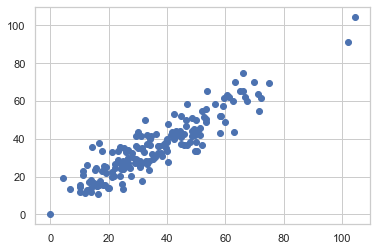

In [93]:
plt.scatter(y.values,predictions)

In [94]:
from sklearn.metrics import r2_score

In [95]:
r2_score(y.values, predictions)

0.835225206375194

In [96]:
actual = pd.Series(y.values)
predicted = pd.Series(predictions.reshape(173))

In [97]:
result = pd.concat([actual,predicted],axis=1)

In [98]:
result.columns=['actual','predicted']

In [99]:
result

,actual,predicted
0,36.300353,42.555553
1,63.129522,43.610035
2,34.998177,31.790846
3,17.735168,33.722103
4,23.407582,27.798098
...,...,...
168,45.763668,36.689659
169,40.173380,27.908285
170,50.427991,33.760754
171,19.632272,13.817599


In [100]:
def corrfit2(data, X, Y, xlabel=None, ylabel=None, log=(False, False), xlim=None, ylim=None, size=None,name=None):
    df = data.loc[:,[X,Y]]

    if log[0]:
        U = f"log({X})"
        xlabel = f"log: {xlabel}"
        df[U] = df[X].map(np.log)
    else:
        U = X

    if log[1]:
        V = f"log({Y})"
        ylabel = f"log: {ylabel}"
        df[V] = df[Y].map(np.log)
    else:
        V = Y

    r = stats.linregress(df[U], df[V])
    df['fit'] = (r.intercept + r.slope*df[U])
    df['residuals'] = df[V]  - df.fit
    df['scaled_residuals'] = df.residuals/df.fit

    dfBULK = df[df.scaled_residuals.abs() <= 2*df.scaled_residuals.std()]
    dfOUT = df[df.scaled_residuals.abs() > 2*df.scaled_residuals.std()]

    if xlim is None:
        xmin = df[U].min()
        xmax = df[U].max()
        xwidth = xmax - xmin
        xmax = xmax + 0.05*xwidth
        xmin = xmin - 0.05*xwidth
        xlim = (xmin,xmax)

    if ylim is None:
        ymin = df[V].min()
        ymax = df[V].max()
        ywidth = ymax - ymin
        ymax = ymax + 0.05*ywidth
        ymin = ymin - 0.05*ywidth
        ylim = (ymin,ymax)

    #print(size, data.columns)
    if size is not None:
        if size not in df.columns:
            if size not in data.columns:
                size = None
            else:
                df[size] = data[size]
    #print('Size:', size, df[size].min(), df[size].max())
        
    df['Outlier'] = df.scaled_residuals.abs() > 2*df.scaled_residuals.std()

    g0 = sns.jointplot(U, V, data=dfBULK,
                      kind="reg", 
                      marker="o",
                      xlim=xlim, ylim=ylim,
                      scatter=False,
                      height=7)    
    g1 = sns.scatterplot(U, V, data=df, hue="Outlier",
                         size=size, sizes=(25,200),
                         alpha=0.75, 
                         marker="o", edgecolor="k",
                         ax=g0.ax_joint)
    #g2 = sns.scatterplot(U, V, data=dfOUT, size="dPOP",
    #                    color="orange", marker="o", edgecolor="k",
    #                    ax=g0.ax_joint)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    r, p = stats.pearsonr(dfBULK[U],dfBULK[V])
    p_str = f'= {p:.5f}' if p >= 1E-5 else "< 0.00001"
    plt.title(f"$r^2 = {r**2:.5f}$, $p {p_str}$", pad=-5, fontsize = 12)
    plt.savefig(name)
    plt.show()
    
    return stats.linregress(dfBULK[U], dfBULK[V])

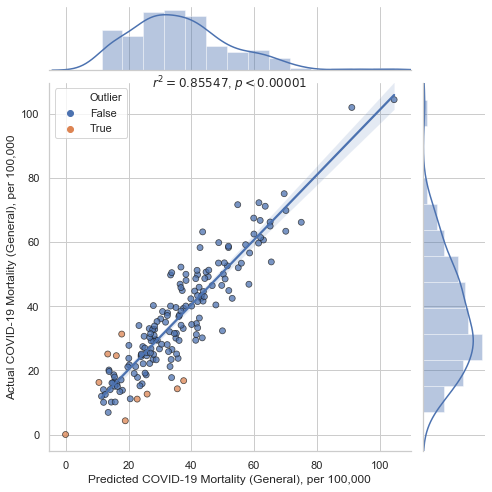

LinregressResult(slope=1.0114361585636908, intercept=-0.01655260223882493, rvalue=0.9249155233514917, pvalue=1.6152108801419915e-69, stderr=0.03276456341506921)

In [107]:
corrfit2(result, X="predicted", Y="actual",
        xlabel="Predicted COVID-19 Mortality (General), per 100,000",
        ylabel="Actual COVID-19 Mortality (General), per 100,000",name = 'RegularizedNN1(7pca_Sigmoid0_100K).jpg')

In [102]:
loss = pd.DataFrame(model.history.history)

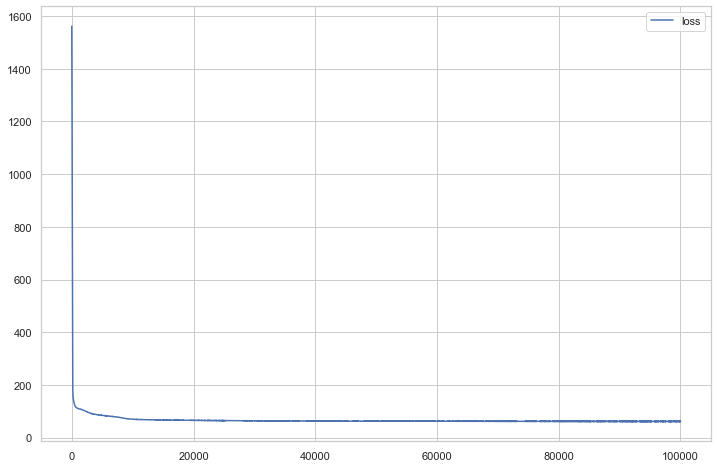

In [106]:
loss.plot(figsize=(12,8))
plt.savefig('RegularizedNN1(General)_7pca_loss_100K.jpg')

In [112]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [113]:
regressor = LinearRegression()  
regressor.fit(X_train, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [114]:
y_pred = regressor.predict(X)

In [115]:
pred_plot = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
pred_plot

,Actual,Predicted
code,,
E06000001,11.744232,12.713937
E06000002,21.279614,8.425024
E06000003,5.103901,12.035114
E06000004,8.107506,9.318158
E06000005,7.490426,9.364251
...,...,...
W06000020,2.128543,9.506593
W06000021,6.343165,4.687592
W06000022,10.344203,9.808712


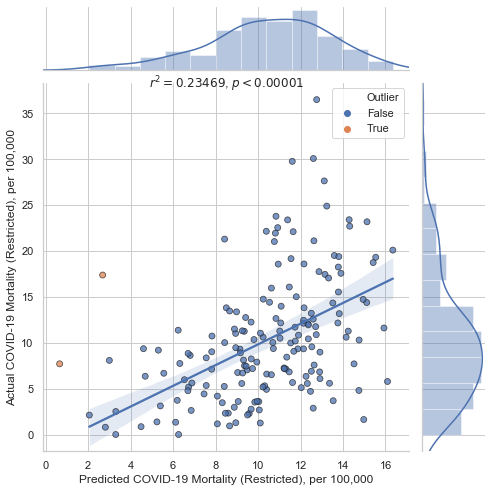

LinregressResult(slope=1.1284268905408803, intercept=-1.4708638893792436, rvalue=0.4844430927550299, pvalue=1.899681682653702e-11, stderr=0.15674994171577106)

In [116]:
corrfit2(pred_plot, X="Predicted", Y="Actual",
        xlabel="Predicted COVID-19 Mortality (Restricted), per 100,000",
        ylabel="Actual COVID-19 Mortality (Restricted), per 100,000",name = 'Linear_Regression_6PCA.jpg')

In [117]:
import statsmodels.api as sm

mod = sm.OLS(y,X_train)

fii = mod.fit()
print(fii.summary())
p_values = fii.summary2().tables[1]['P>|t|']

                                 OLS Regression Results                                
Dep. Variable:           d_restricted   R-squared (uncentered):                   0.060
Model:                            OLS   Adj. R-squared (uncentered):              0.026
Method:                 Least Squares   F-statistic:                              1.776
Date:                Mon, 01 Jun 2020   Prob (F-statistic):                       0.107
Time:                        22:18:49   Log-Likelihood:                         -674.95
No. Observations:                 173   AIC:                                      1362.
Df Residuals:                     167   BIC:                                      1381.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [98]:
regressor.coef_

array([0.70174428, 1.27908228, 1.90305644, 7.40854291, 7.04253457,
       3.81345381])

In [ ]:
r